<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;"> TP 4 </h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
sns.set_theme()

# Data extraction

In [13]:
paths = '/Users/zohra/Desktop/Cours_phi/semester2/lehalle/TP1/Data'
Stocks = {'Nasdaq' : ['AMAZON', 'APPLE', 'GOOGLE'], 
          'Paris' : ['TOTAL', 'SANOFI', 'LVMH', 'BOUYGUES'] , 
          'Tokyo' : ['SONY', 'TOYOTA', 'NISSAN', 'CANON', 'PANASONIC']}
files_ = {'Nasdaq' : {'AMAZON' : 0,
                  'APPLE' : 0,
                  'GOOGLE': 0}, 
          'Paris' : {'TOTAL':0, 
                  'SANOFI': 0, 
                  'LVMH' : 0, 
                  'BOUYGUES': 0} , 
          'Tokyo' : {'SONY' : 0,
                     'TOYOTA': 0,
                     'NISSAN': 0,
                     'CANON':0, 
                     'PANASONIC' : 0} }

In [14]:
for key, item in files_.items() :
    for keys in item.keys() :
        files_[key][keys] = pd.read_hdf(paths + '/' + keys + '.h5')  
        files_[key][keys]['trade'] = files_[key][keys]['TradedSign'] != 0
        files_[key][keys]['trade'] = files_[key][keys]['trade'].astype('int')

In [15]:
files_['Paris']['TOTAL']

,TradedPrice,TradedQty,BidPrice,AskPrice,BidQty,AskQty,TradedSign,trade
Time,,,,,,,,
2011-01-03 09:00:01.988,40.190,70,40.010,40.190,660800,40700,1,1
2011-01-03 09:00:01.988,40.190,15,40.010,40.190,660800,40700,1,1
2011-01-03 09:00:01.988,40.190,67,40.010,40.190,660800,40700,1,1
2011-01-03 09:00:01.988,40.190,20,40.010,40.190,660800,40700,1,1
2011-01-03 09:00:01.988,40.190,250,40.010,40.190,660800,40700,1,1
...,...,...,...,...,...,...,...,...
2011-12-30 17:29:57.069,39.425,320,39.425,39.435,82000,20000,-1,1
2011-12-30 17:29:57.069,39.425,320,39.425,39.435,82000,20000,-1,1
2011-12-30 17:29:57.076,39.425,180,39.425,39.435,82000,20000,-1,1


<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;"> 1-Optimal split of orders across liquidity pools </h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

In [919]:
reference = 'TOTAL'
others = ['SANOFI', 'LVMH', 'BOUYGUES']

def select_data(files_, bourse, actifs, time_=18, sample=True, time_start=1) :
    values = {}
    for key in actifs :
        val = files_[bourse][key].copy()
        if bourse=='Paris':
            val=val.between_time('09:05', '17:25')
        val['time_'] = val.index.astype(str)
        val['day'] = val['time_'].apply(lambda x : int(x.split(' ')[0].split('-')[2]) )
        val['month'] = val['time_'].apply(lambda x : int(x.split(' ')[0].split('-')[1]) )
        val = val.loc[val['month'] == 1]
        val = val.loc[val['day'] >= time_start ]
        val = val.loc[val['day'] < time_ ]
        val = val.drop(['time_', 'month', 'day'], axis = 1)
        if sample :
            values[key] = val.resample('5T',label='right', closed='right').sum()
        else :
            values[key] = val
    return values

def compute_D(values, beta, alpha, reference, others) :
    mean_volume = {key : values[key]['TradedQty'].mean() for key in [reference]+others}
    dd = values[reference][['TradedQty']]
    for i, key in enumerate(others) :
        dd['d'+str(i)] = 0
    for t in dd.index :
        V = dd.loc[t, 'TradedQty']
        esp_V = mean_volume[reference]
        for i, key in enumerate(others) :
            esp = mean_volume[key]
            dd.loc[t, 'd'+str(i)] = beta[i]*(alpha[i]*values[key].loc[t]['TradedQty']/esp*esp_V+ (1-alpha[i])*dd.loc[t, 'TradedQty'] )
    return values, dd
  
def compute_r(nstep, dd, c, rho) :
    r = np.zeros((nstep*len(dd)+1, 3)) 
    r[0] = 1/3
    H = np.zeros((len(dd), 3))
    j = 0
    for k in range(nstep) :
        for i in range(len(dd)) :
            Yi = dd.iloc[i].to_numpy()
            values = (r[j]*Yi[0] < Yi[1:]).astype(int)
            val = rho@values / 3
            H[i] = Yi[0]* ( rho * (r[j]*Yi[0] < Yi[1:]).astype(int) - val ) 
            r[j+1] = r[j] + c/(j+1) * H[i]
            # projection des données sur le simplexe
            for k in range(3) :
                if r[j+1, k] <0 :
                    r[j+1, k] = 0
                elif r[j+1, k] > 1 :
                    r[j+1, k] = 1
            r[j+1] /= np.sum(r[j+1])
            j += 1
    return r

def compute_critere(dd, r_, rho) :
    critere = {key : None for key in r_.keys()}
    for key, rr in r_.items() :
        print(f'-- {key}')
        r_0, r_1, r_2 = rr.T[0][1:], rr.T[2][1:], rr.T[2][1:]
        values_dd = [[], [], [], []] 
        for k in range(key) :
            values_dd[0] += list(dd['TradedQty'].to_numpy())
            values_dd[1] += list(dd['d0'].to_numpy())
            values_dd[2] += list(dd['d1'].to_numpy())
            values_dd[3] += list(dd['d2'].to_numpy())
        values_dd = pd.DataFrame(np.array(values_dd).T, columns = dd.columns)
        values_dd['r0'] = r_0
        values_dd['r1'] = r_1
        values_dd['r2'] = r_2
        values_dd['cr_oracle'] = 0
        values_dd['cr_algo'] = 0
        for i in range(3) :
            r_val, d_val = 'r'+str(i), 'd'+str(i)
            values_dd[r_val+'*V'] = values_dd[r_val]*values_dd['TradedQty']
            values_dd['min('+r_val+'*V-'+d_val+')'] = 0
            for j in range(len(values_dd)) :
                values_dd.loc[j,'min('+r_val+'*V-'+d_val+')'] = min(values_dd.loc[j,r_val+'*V'],values_dd.loc[j,d_val])
            values_dd['cr_algo'] += rho[i] * values_dd['min('+r_val+'*V-'+d_val+')']
            values_dd['cr_oracle'] += rho[i] * values_dd[d_val]
        critere[key] = values_dd
    return critere
    
def plot_d(dd) :
    fig, ax = plt.subplots(2, 2, figsize=(25, 10))
    ax[0, 0].plot(dd.index, dd['TradedQty'])
    ax[0, 0].set_xlabel('time')
    ax[0, 0].set_ylabel('Traded Quantity')
    ax[0, 0].set_title(f'Traded Quantity')
    for i in range(3) :
        d = 'd'+str(i)
        ax[(i+1)//2, (i+1)%2].plot(dd.index, dd[d])
        ax[(i+1)//2, (i+1)%2].set_xlabel('time')
        ax[(i+1)//2, (i+1)%2].set_ylabel('d')
        ax[(i+1)//2, (i+1)%2].set_title(f'Graphe pour {d}')
    plt.show()
    
def plot_r(dd,r_) :
    fig, ax = plt.subplots(1, 3, figsize=(30, 5))
    colors = ['b', 'r', 'y', 'g']
    for i in range(3) :
        for c, (epoch, rr) in enumerate(r_.items()) :
            r_val = rr.T[i]
            ax[i].plot(r_val, c= colors[c], label=f'{epoch}')
            ax[i].set_xlabel('iteration')
            ax[i].set_ylabel('r'+str(i))
            ax[i].set_title(f'Graphe pour r_{i}')
        ax[i].legend()
    plt.show()
    
def plot_critere(dd, critere) :
    fig, ax = plt.subplots(len(critere.keys()),1 , figsize=(20, 20))
    v1 = list(critere.keys())[0]
    colors = ['b', 'r', 'y', 'g']
    values_0 = critere[v1]['cr_algo']/critere[v1]['cr_oracle']
    for c, (epoch, rr) in enumerate(critere.items()) :
        values = rr['cr_algo']/rr['cr_oracle']
        values = values[len(values)-len(values_0) :]
        ax[c].plot(dd.index, values , c= colors[c], label=f'{epoch}')
        ax[c].set_xlabel('last iterations - each time')
        ax[c].set_ylabel('CRopti/CRoracle')
        ax[c].set_title(f'CRopti/CRoracle pour {epoch} epochs')
        ax[c].legend()
    plt.show()

On choisit la bourse de Paris, 'Total' comme référence et 'SANOFI', 'LVMH', 'BOUYGUES' comme autres actifs en prenant les 15 jours de trading environ comme le montre le graphe ci-dessous.

In [831]:
values_ = select_data(files_, 'Paris', ['TOTAL', 'SANOFI', 'LVMH', 'BOUYGUES'])

<AxesSubplot:xlabel='Time'>

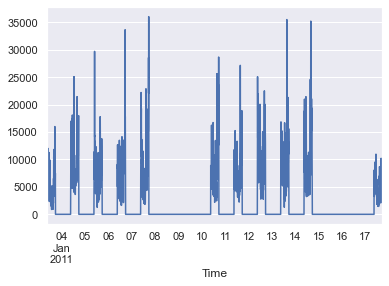

In [832]:
values_['TOTAL']['TradedPrice'].plot()

## Calcul des di

In [833]:
values_, dd = compute_D(values_, [0.3,0.3, 0.3], [0.5,0.5, 0.5], reference, others) 
dd = dd.dropna(axis=0)
dd

,TradedQty,d0,d1,d2
Time,,,,
2011-01-03 09:10:00,76329,15376.698518,16383.225599,15577.403709
2011-01-03 09:15:00,73653,18773.761915,15606.433482,18236.281150
2011-01-03 09:20:00,55453,10549.121681,12152.011055,11949.703051
2011-01-03 09:25:00,26879,7736.081350,5543.963188,9899.145574
2011-01-03 09:30:00,29182,9551.855250,17539.222467,5531.928884
...,...,...,...,...
2011-01-17 17:05:00,24098,9402.675475,9747.510532,5934.905577
2011-01-17 17:10:00,50570,11447.798009,16929.178495,12254.375456
2011-01-17 17:15:00,40046,8445.990132,10939.721126,15474.564907


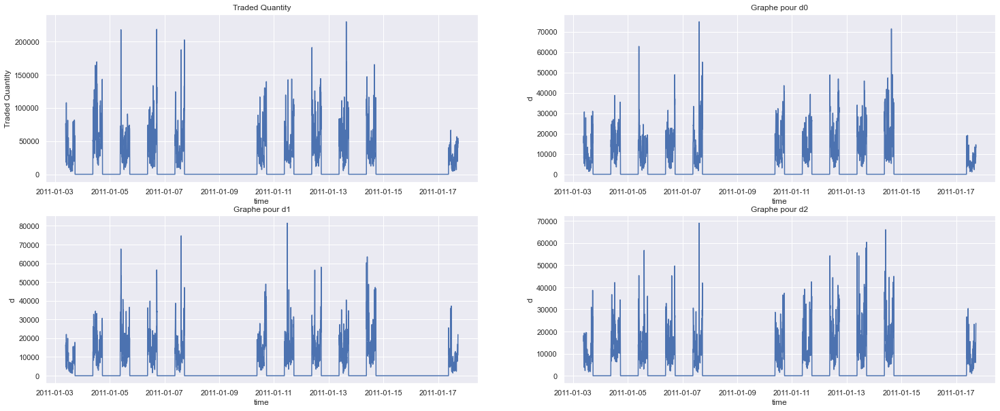

In [838]:
plot_d(dd)

## Optimization 

In [901]:
rho = np.array([0.01, 0.02, 0.04])

In [902]:
r_ = {epoch : compute_r(epoch, dd, 10**(-3), rho) 
      for epoch in [1, 5, 15, 50]}

In [904]:
r_

{1: array([[0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333],
        ...,
        [0.26391397, 0.32055282, 0.4155332 ],
        [0.26382604, 0.320333  , 0.41584095],
        [0.26367598, 0.32029549, 0.41602853]]),
 5: array([[0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333],
        ...,
        [0.26531366, 0.32229201, 0.41239432],
        [0.26529608, 0.32224806, 0.41245586],
        [0.26526607, 0.32224055, 0.41249338]]),
 15: array([[0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333],
        ...,
        [0.26571034, 0.32307364, 0.41121603],
        [0.26570447, 0.32305898, 0.41123654],
        [0.26569447, 0.32305648, 0.41124905]]),
 50: array([[0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 

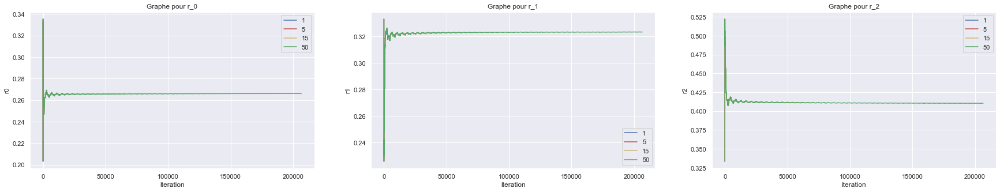

In [905]:
plot_r(dd,r_)

On fait varier le nombre d'epochs pour s'assurer d'une bonne optimisation mais on remarque que l'on converge assez vite. Le learning rate est fixé à $10^{-3}$ et la descente se fait à partir du nombre d'epochs, pas du nombre de samples. 

## Courbe de comparaison avec le critère de ratio avec l'oracle

In [906]:
critere = compute_critere(dd, r_, rho) 

-- 1
-- 5
-- 15
-- 50


In [907]:
critere[1]

,TradedQty,d0,d1,d2,r0,r1,r2,cr_oracle,cr_algo,r0*V,min(r0*V-d0),r1*V,min(r1*V-d1),r2*V,min(r2*V-d2)
0,76329.0,15376.698518,16383.225599,15577.403709,0.333333,0.333333,0.333333,1104.527646,1104.527646,25443.000000,15376.698518,25443.000000,16383.225599,25443.000000,15577.403709
1,73653.0,18773.761915,15606.433482,18236.281150,0.333333,0.333333,0.333333,1229.317535,1229.317535,24551.000000,18773.761915,24551.000000,15606.433482,24551.000000,18236.281150
2,55453.0,10549.121681,12152.011055,11949.703051,0.333333,0.333333,0.333333,826.519560,826.519560,18484.333333,10549.121681,18484.333333,12152.011055,18484.333333,11949.703051
3,26879.0,7736.081350,5543.963188,9899.145574,0.243737,0.512527,0.512527,584.205900,572.359065,6551.397863,6551.397863,13776.204273,5543.963188,13776.204273,9899.145574
4,29182.0,9551.855250,17539.222467,5531.928884,0.243737,0.454163,0.454163,667.580157,557.471888,7112.723407,7112.723407,13253.374939,13253.374939,13253.374939,5531.928884
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4127,24098.0,9402.675475,9747.510532,5934.905577,0.263996,0.415615,0.415615,526.373188,495.964099,6361.766515,6361.766515,10015.486761,9747.510532,10015.486761,5934.905577
4128,50570.0,11447.798009,16929.178495,12254.375456,0.263914,0.415533,0.415533,943.236568,943.236568,13346.129592,11447.798009,21013.514139,16929.178495,21013.514139,12254.375456
4129,40046.0,8445.990132,10939.721126,15474.564907,0.263914,0.415533,0.415533,922.236920,922.236920,10568.698945,8445.990132,16640.442698,10939.721126,16640.442698,15474.564907
4130,54485.0,14551.651599,14437.369562,22765.449056,0.263826,0.415841,0.415841,1344.881869,1338.776788,14374.562001,14374.562001,22657.094411,14437.369562,22657.094411,22657.094411


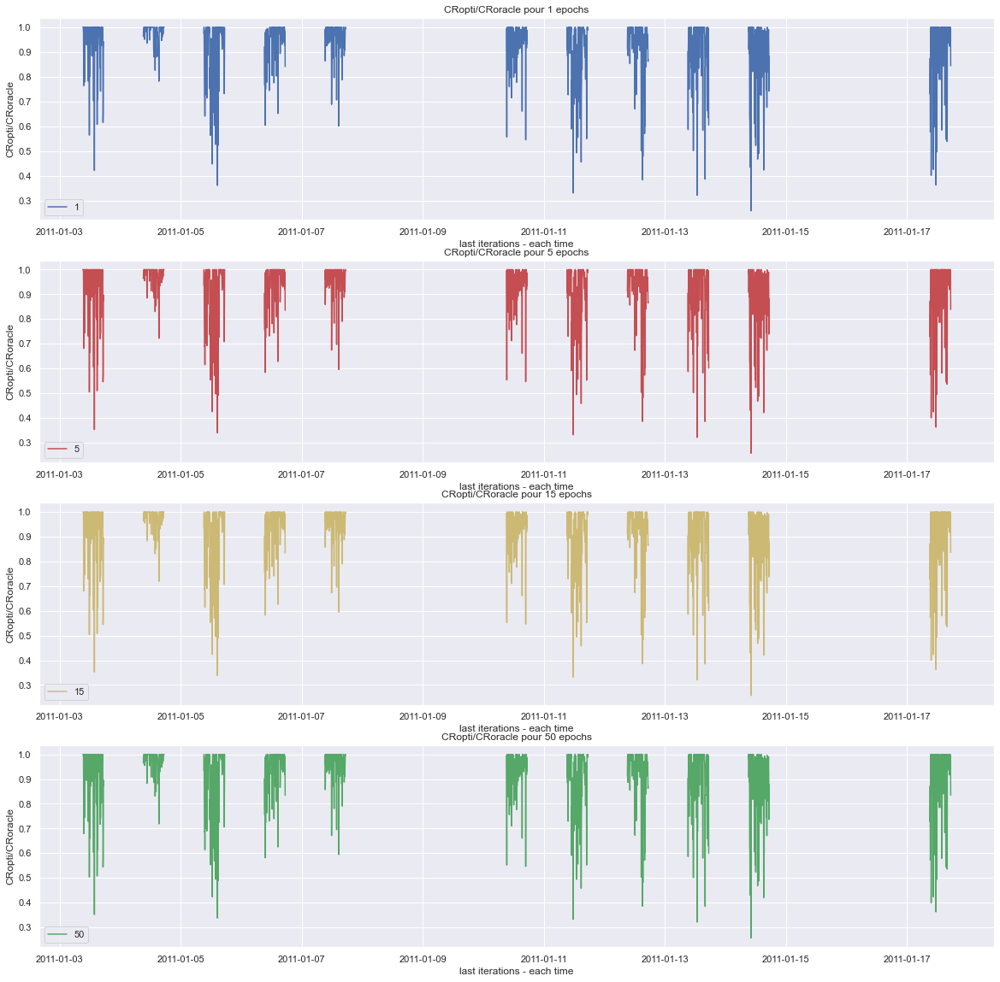

In [920]:
plot_critere(dd, critere)

On affiche ici le graphique pour les dernières itérations pour les différents epochs choisis pour avoir le ratio sur toute la tranche de 15 jours. On remarque que l'on obtient des ratios assez proches de 1 en moyenne pour les différentes journées avec quelques valeurs extrêmes. Le fait d'avoir des ratios proches de 1 montre la pertinence de la méthode utilisée (on s'approche de l'oracle).

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;">  2-Market making  </h1>

<a id="fbm"></a><h1 style="text-align:center;">  a-Fillrates  </h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

In [50]:
import datetime

In [320]:
def fillrate(values_fillrate, durations, distances, sides, tick) :
    execution_rate = {side : {} for side in sides}
    for h in durations :
        execution_rate[sides[0]][h] = compute_X(values_fillrate, values_fillrate, distances, tick, h, sides[0]) 
        execution_rate[sides[1]][h] = compute_X(values_fillrate, values_fillrate, distances, tick, h, sides[1]) 
    return execution_rate

def compute_tick(values, key_func) :
    difference = np.abs(values[key_func].diff(periods=1).dropna())
    indexes = difference != 0.0
    return difference[indexes].min()

def compute_X(bids, trades, deltas, tick, h, side) :
    function_isany_ask = lambda list_trades, limit_order, delta, tick : list_trades >= limit_order - delta*tick
    function_isany_bid = lambda list_trades, limit_order, delta, tick : list_trades <= limit_order + delta*tick
    function_convert_sec = lambda max_time : max_time.hour*3600+max_time.minute*60 + max_time.second 
    values = bids[side]
    time_bids = values.index
    trade_sign = 1
    function_isany = function_isany_ask
    if side == 'BidPrice' :
        trade_sign = -1
        function_isany = function_isany_bid
    trades = trades.loc[trades['TradedSign']==trade_sign]
    max_time = trades.index[-1]
    max_time = function_convert_sec(max_time) + 1
    num_seconds = h.total_seconds()
    
    bids_delta = []
    for i in range(0, len(values)) :
        if i % 500 == 0 :
            print(f'---- processed {h}-{i}-{len(values)}')
        value_delta = []
        trades_range = trades.loc[trades.index >= time_bids[i]]
        trades_range = trades_range.loc[trades_range.index <= time_bids[i]+h, "TradedPrice"]
        for j, delta in enumerate(deltas) :
            isany = function_isany(trades_range, values[i], delta, tick)
            #isany = trades_range <= values[i] + delta*tick
            X = sum(isany) 
            value_delta.append(int(X))
        bids_delta.append([time_bids[i], values[i], *value_delta])
        
    bids_delta = pd.DataFrame(bids_delta, columns = ['time', side]+[str(v) for v in deltas])
    return bids_delta

On choisit la bourse de Paris et l'actif 'Total' pour la suite avec comme jour de trading le 2011-01-03

In [304]:
bourse = 'Paris'
reference = 'TOTAL'
time_start = 3
time_ = time_start + 1
values_fillrate = select_data(files_, 'Paris', ['TOTAL'], time_, sample=False, time_start = time_start)
tick = compute_tick(values_fillrate['TOTAL'], 'TradedPrice') 


In [619]:
values_fillrate['TOTAL'].head()

,TradedPrice,TradedQty,BidPrice,AskPrice,BidQty,AskQty,TradedSign,trade,spread,latent
Time,,,,,,,,,,
2011-01-03 09:05:04.594,40.105,1516,40.105,40.13,166500,54300,-1,1,0.025,40.105000
2011-01-03 09:05:04.594,40.105,149,40.105,40.13,166500,54300,-1,1,0.025,40.147639
2011-01-03 09:05:04.594,40.100,620,40.105,40.13,166500,54300,-2,1,0.025,40.142639
2011-01-03 09:05:05.005,40.100,1110,40.100,40.13,135900,54300,-1,1,0.030,40.142639
2011-01-03 09:05:05.005,40.100,149,40.100,40.13,135900,54300,-1,1,0.030,40.142639


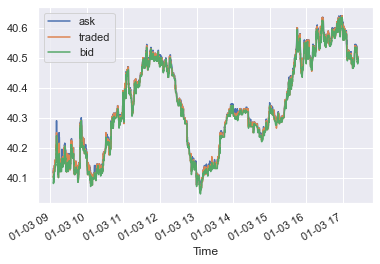

In [795]:
values_fillrate['TOTAL']['AskPrice'].plot(label='ask')
values_fillrate['TOTAL']['TradedPrice'].plot(label='traded')
values_fillrate['TOTAL']['BidPrice'].plot(label='bid')
plt.legend()

## Calcul des fillrates pour différentes durations et différentes distances fixes

Pour chaque duration, on implémente les fillrates pour l'ask et le bid pour des distances comprises entre 0 et 9 (on augmente le nombre de distances choisies pour pouvoir les utiliser dans la suite).

In [393]:
durations = [datetime.timedelta(seconds=k*60) for k in [1,5,10,15]]
fixed_distances = range(10)
sides = ['AskPrice', 'BidPrice']

In [394]:
all_fillrates = fillrate(values_fillrate['TOTAL'], durations, fixed_distances, sides, tick) 

---- processed 0:01:00-0-11877
---- processed 0:01:00-500-11877
---- processed 0:01:00-1000-11877
---- processed 0:01:00-1500-11877
---- processed 0:01:00-2000-11877
---- processed 0:01:00-2500-11877
---- processed 0:01:00-3000-11877
---- processed 0:01:00-3500-11877
---- processed 0:01:00-4000-11877
---- processed 0:01:00-4500-11877
---- processed 0:01:00-5000-11877
---- processed 0:01:00-5500-11877
---- processed 0:01:00-6000-11877
---- processed 0:01:00-6500-11877
---- processed 0:01:00-7000-11877
---- processed 0:01:00-7500-11877
---- processed 0:01:00-8000-11877
---- processed 0:01:00-8500-11877
---- processed 0:01:00-9000-11877
---- processed 0:01:00-9500-11877
---- processed 0:01:00-10000-11877
---- processed 0:01:00-10500-11877
---- processed 0:01:00-11000-11877
---- processed 0:01:00-11500-11877
---- processed 0:01:00-0-11877
---- processed 0:01:00-500-11877
---- processed 0:01:00-1000-11877
---- processed 0:01:00-1500-11877
---- processed 0:01:00-2000-11877
---- processed 0:0

In [829]:
all_fillrates['AskPrice'][durations[0]]

,time,AskPrice,0,1,2,3,4,5,6,7,8,9
0,2011-01-03 09:05:04.594,40.130,0,0,0,10,12,12,12,32,32,32
1,2011-01-03 09:05:04.594,40.130,0,0,0,10,12,12,12,32,32,32
2,2011-01-03 09:05:04.594,40.130,0,0,0,10,12,12,12,32,32,32
3,2011-01-03 09:05:05.005,40.130,0,0,0,10,12,12,12,32,32,32
4,2011-01-03 09:05:05.005,40.130,0,0,0,10,12,12,12,32,32,32
...,...,...,...,...,...,...,...,...,...,...,...,...
11872,2011-01-03 17:24:41.460,40.505,2,2,2,2,2,2,2,2,2,2
11873,2011-01-03 17:24:41.460,40.505,2,2,2,2,2,2,2,2,2,2
11874,2011-01-03 17:24:41.460,40.505,2,2,2,2,2,2,2,2,2,2
11875,2011-01-03 17:24:45.230,40.505,2,2,2,2,2,2,2,2,2,2


## Visualisation des fillrates

In [821]:
def plot_fillrates(values_fillrate_, fillrates_values, distances_to_plot, tick) :
    name_fillrate = 'Ask'
    for key, fillrate_ask in fillrates_values['AskPrice'].items() :
        print(f'---- Duration {key}')
        fig, ax = plt.subplots(1, 1, figsize=(30, 10))
        # prix
        ax.plot(values_fillrate_.index, values_fillrate_['TradedPrice'])
        ax.set_xlabel('time')
        ax.set_ylabel('Price')
        ax.set_title(f'Prix traded')
        plt.show()
        
        width = 5*10**(-4)
        for i, c in enumerate(distances_to_plot[key]) :
            fig, ax = plt.subplots(1, 1, figsize=(30, 10))
            x = fillrates_values['AskPrice'][key]['time'] 
            height = fillrates_values['AskPrice'][key][c]
            ax.bar(x, height, width, color='r')
            #ax.scatter([i+width/2.0 for i in x],height,s=40)
            ax.set_title(f'Fillrate {name_fillrate} duration {key} distance {c} in tick {tick}')
            plt.show()
            
    name_fillrate = 'bid'
    for key, fillrate_bid in fillrates_values['BidPrice'].items() :
        print(f'---- Duration {key}')
        fig, ax = plt.subplots(1, 1, figsize=(30, 10))
        # prix
        ax.plot(values_fillrate_.index, values_fillrate_['TradedPrice'])
        ax.set_xlabel('time')
        ax.set_ylabel('Price')
        ax.set_title(f'Prix traded')
        plt.show()
        
        width = 5*10**(-4)
        for i, c in enumerate(distances_to_plot[key]) :
            fig, ax = plt.subplots(1, 1, figsize=(30, 10))
            x = fillrates_values['BidPrice'][key]['time'] 
            height = fillrates_values['BidPrice'][key][c]
            ax.bar(x, height, width, color='b')
            #ax.scatter([i+width/2.0 for i in x],height,s=40)
            ax.set_title(f'Fillrate {name_fillrate} duration {key} distance {c} in tick {tick}')
            plt.show()

In [822]:
combi_to_ = [str(fixed_distances[i]) for i in range(5)]
combi_to_plot = {key : combi_to_ for key in durations}

---- Duration 0:01:00


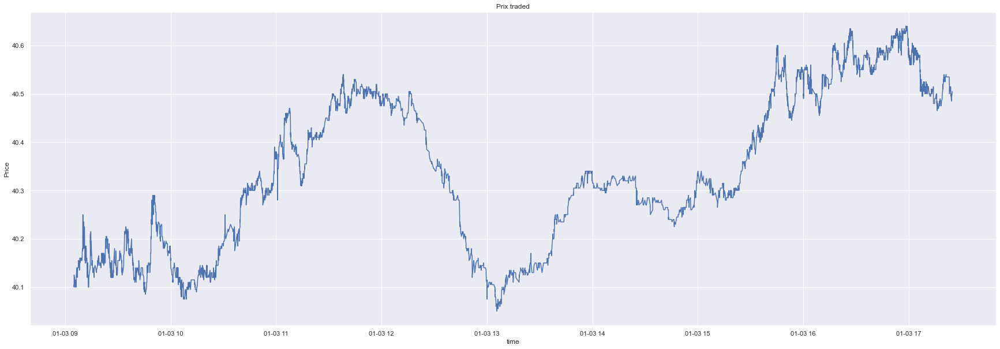

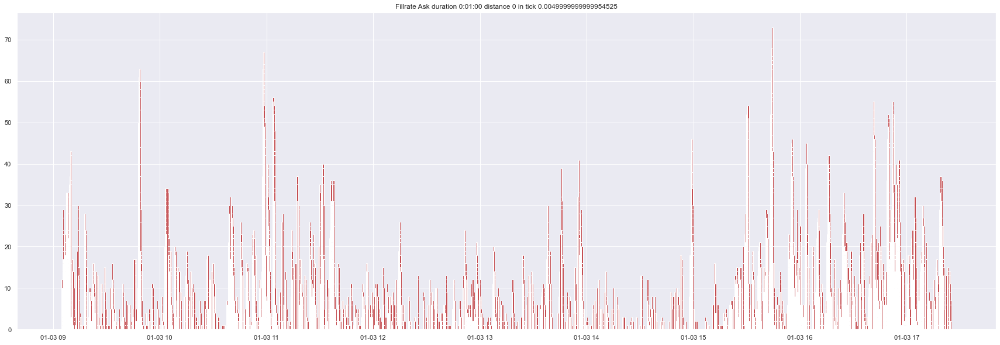

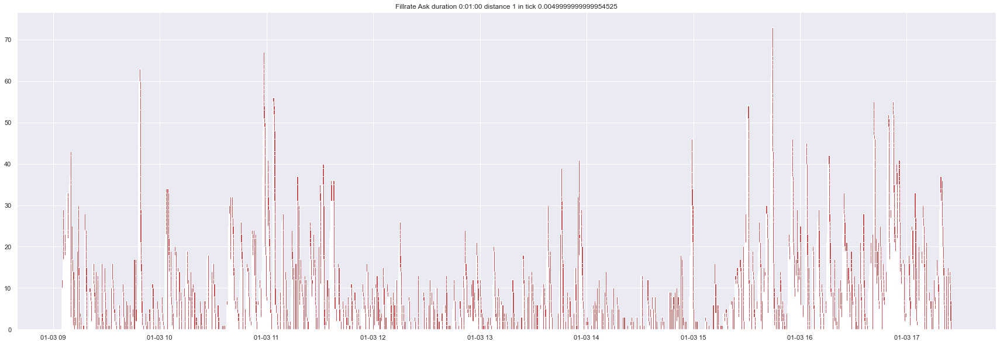

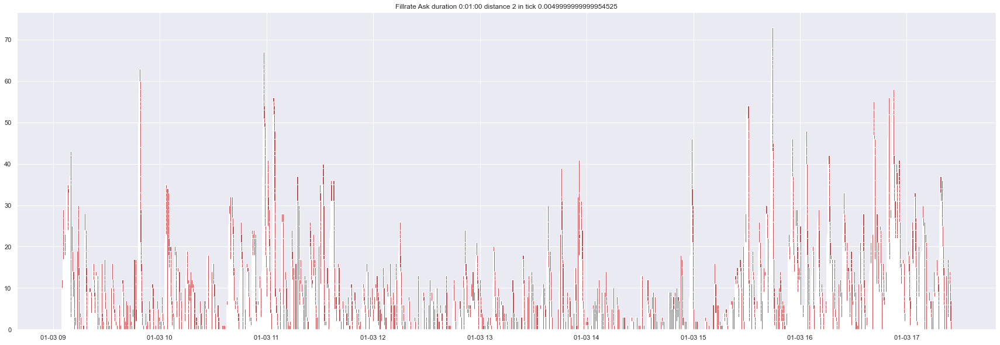

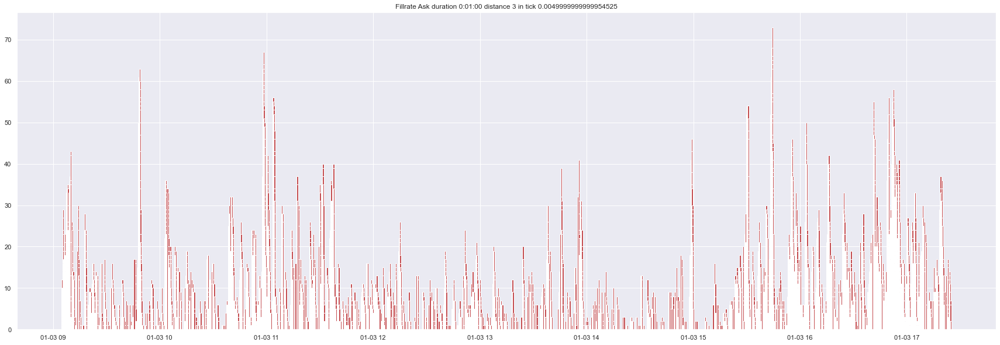

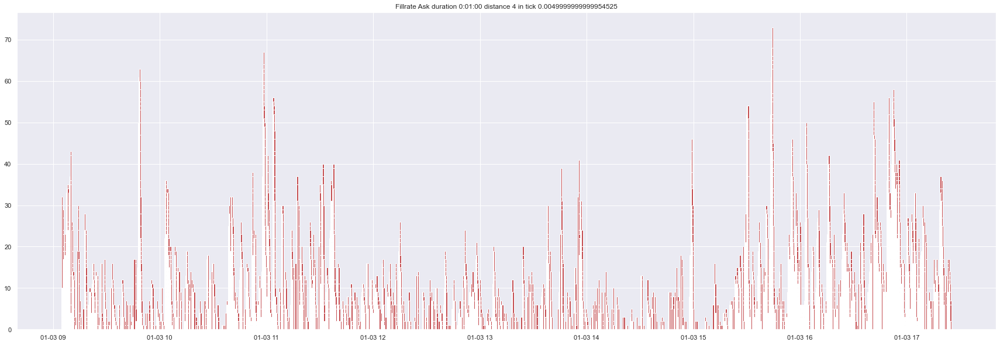

---- Duration 0:05:00


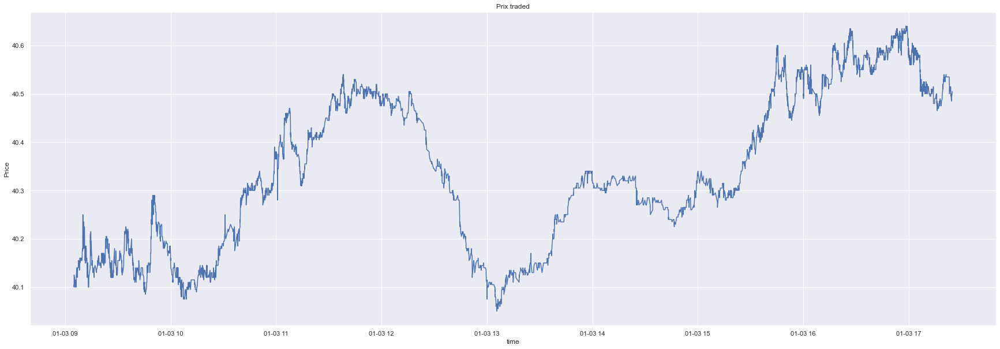

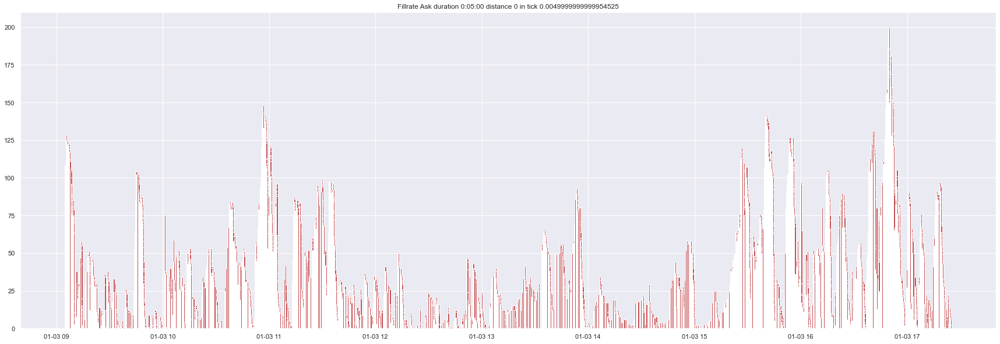

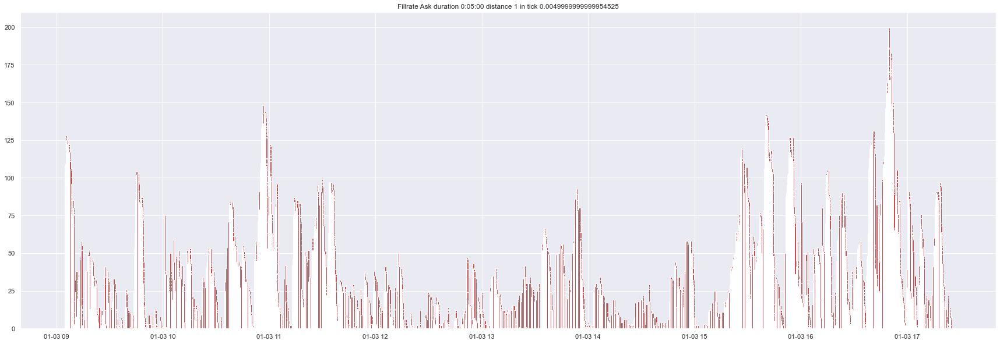

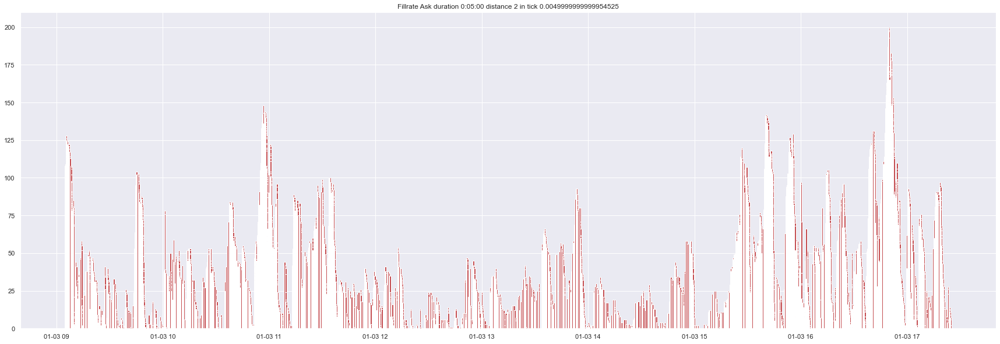

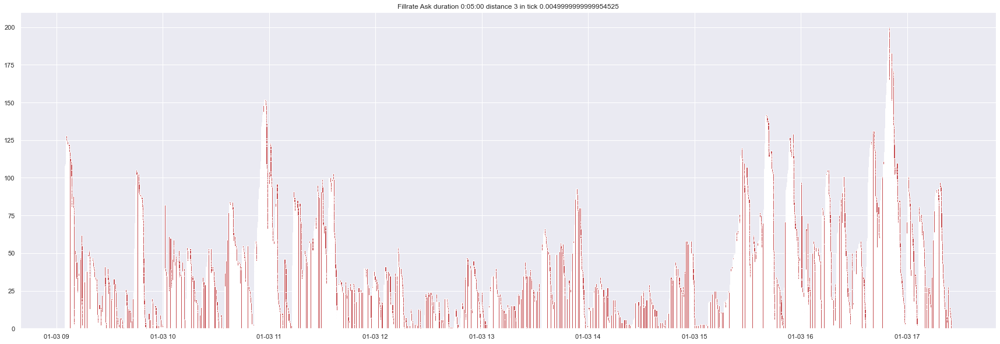

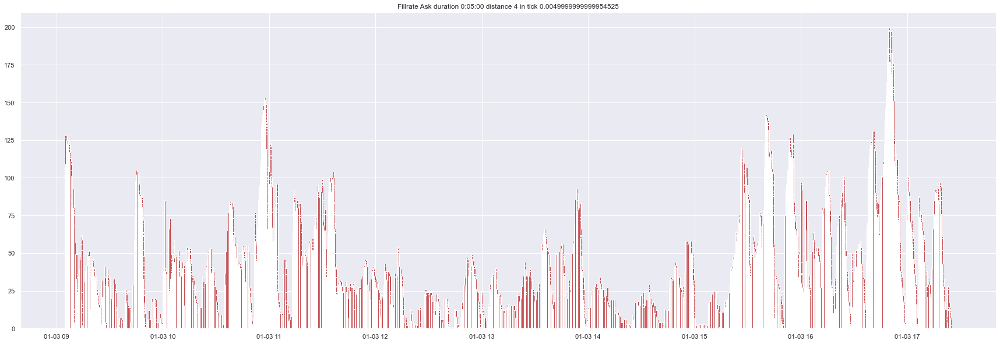

---- Duration 0:10:00


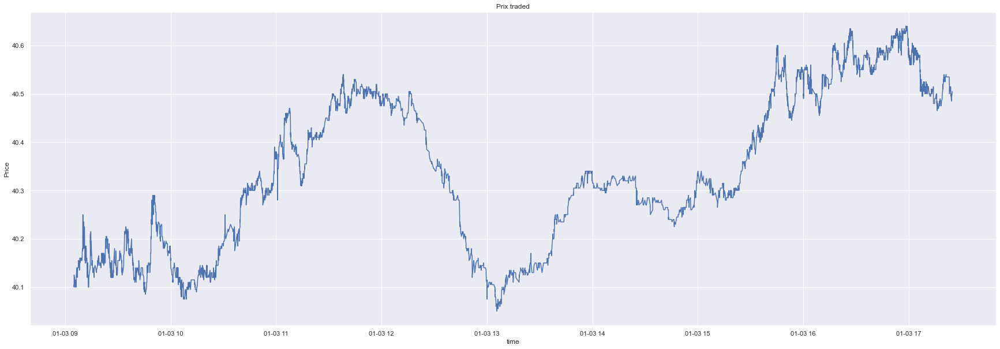

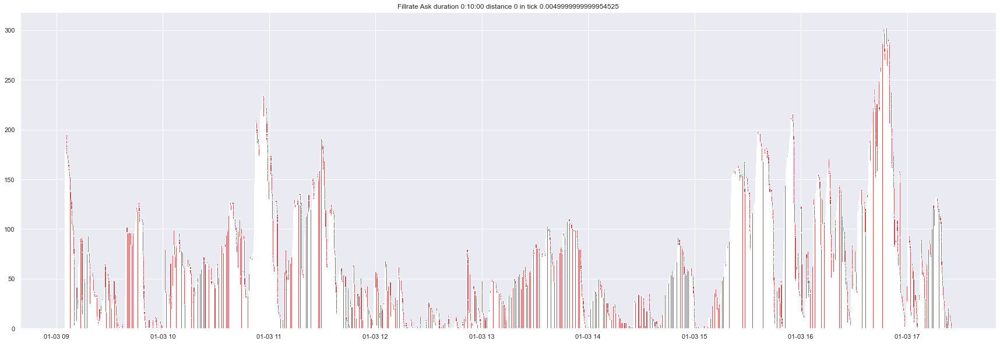

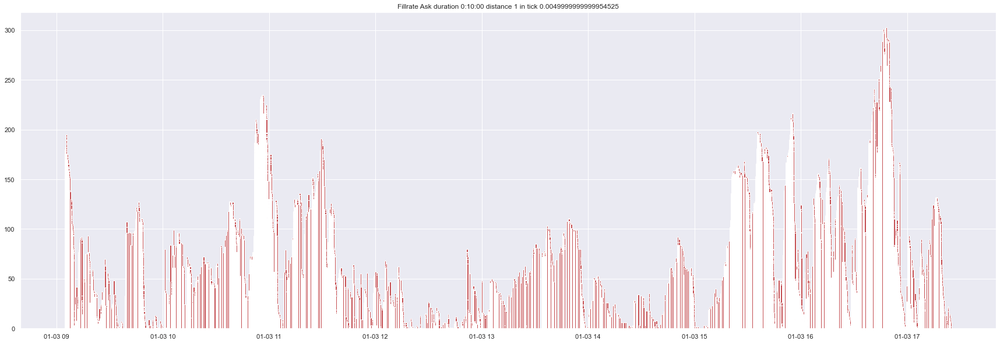

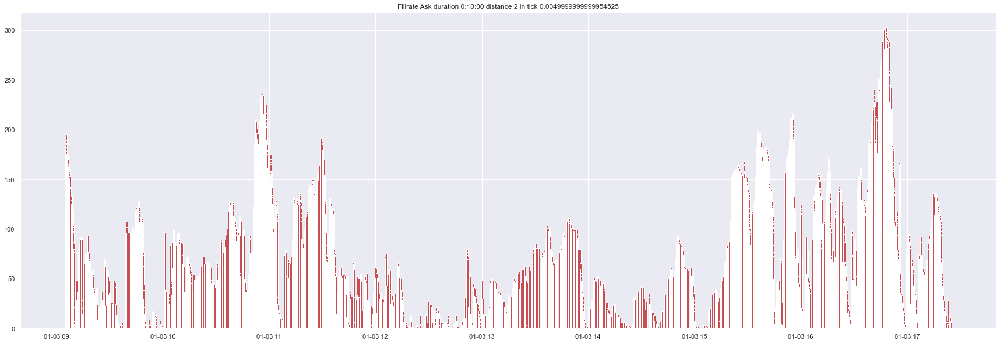

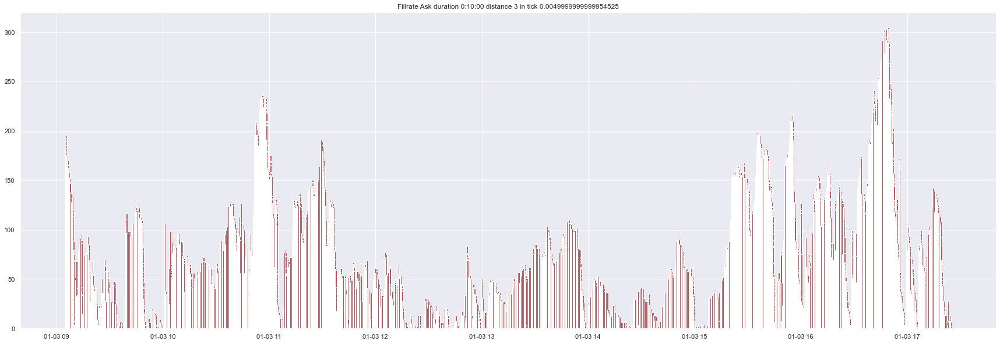

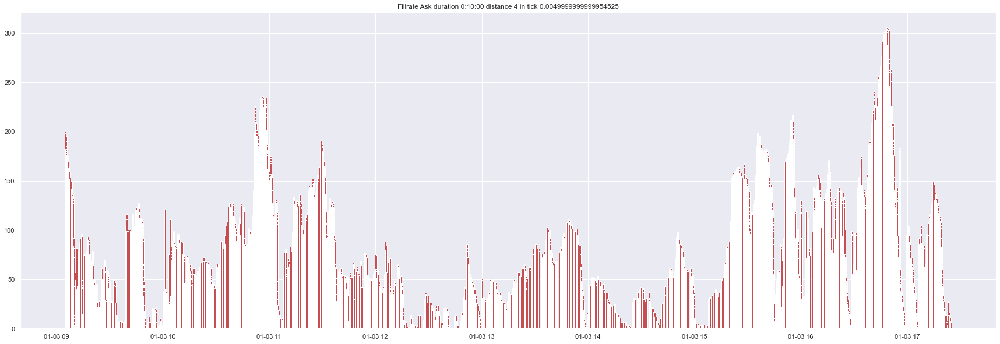

---- Duration 0:15:00


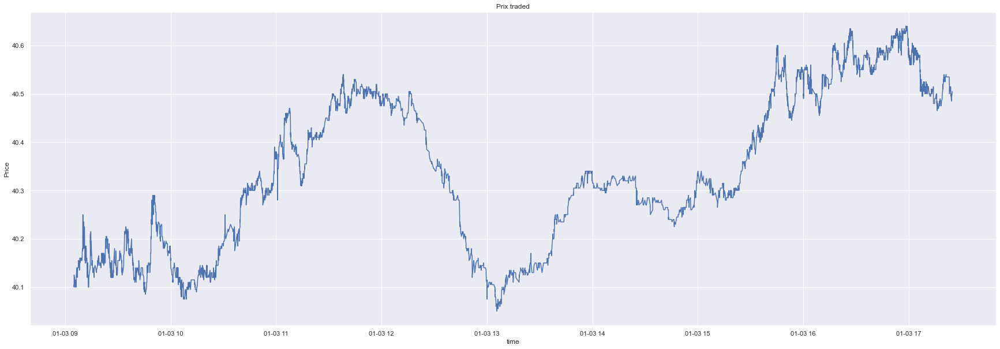

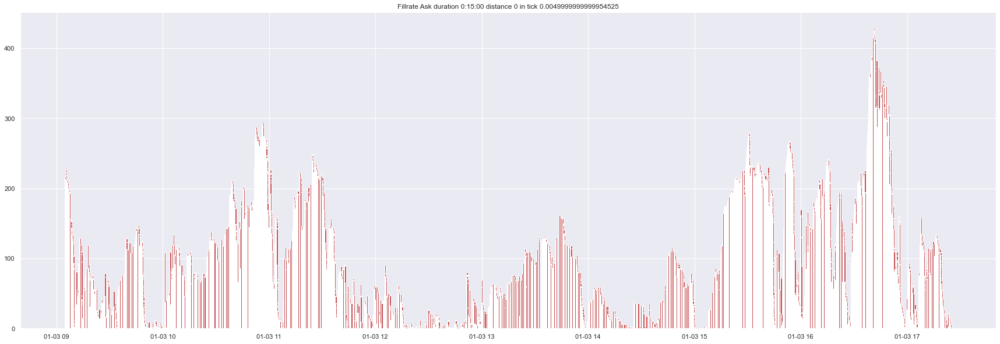

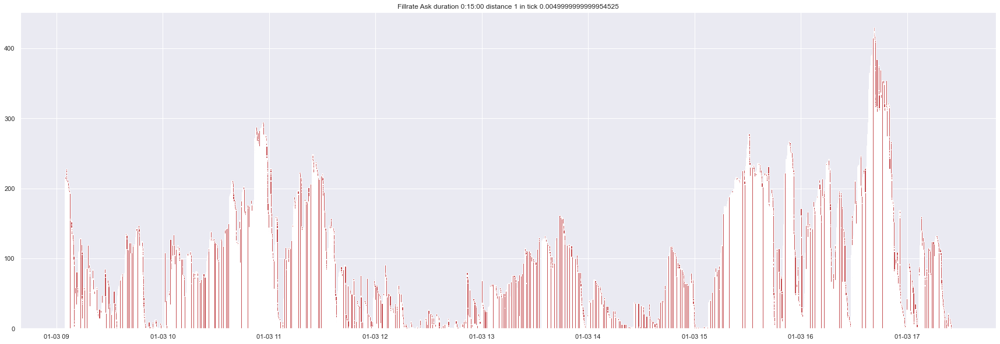

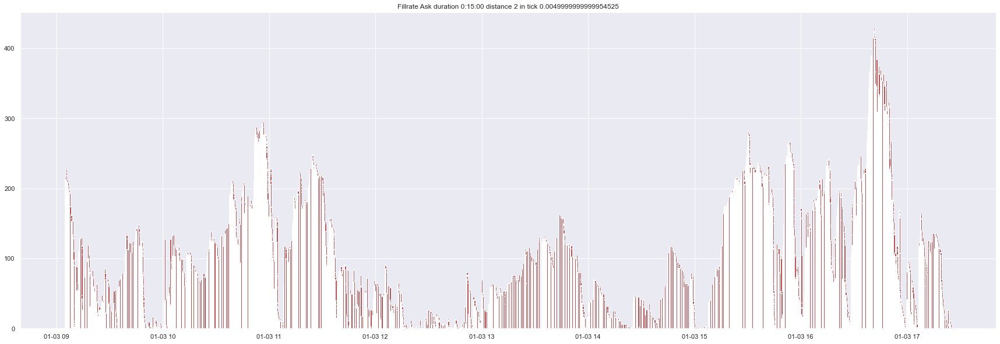

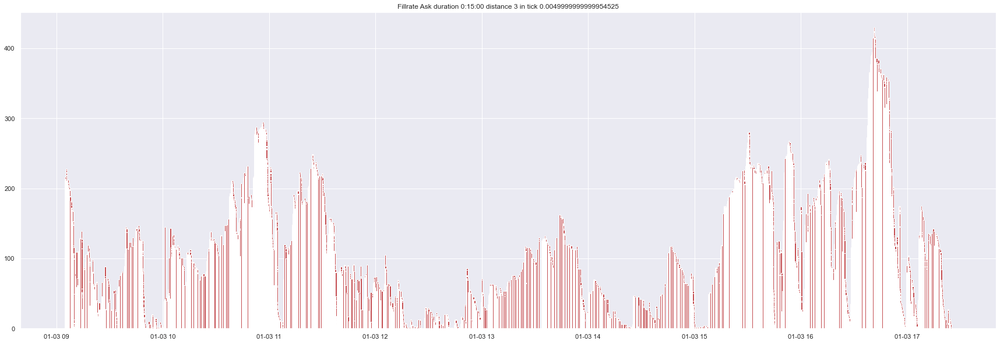

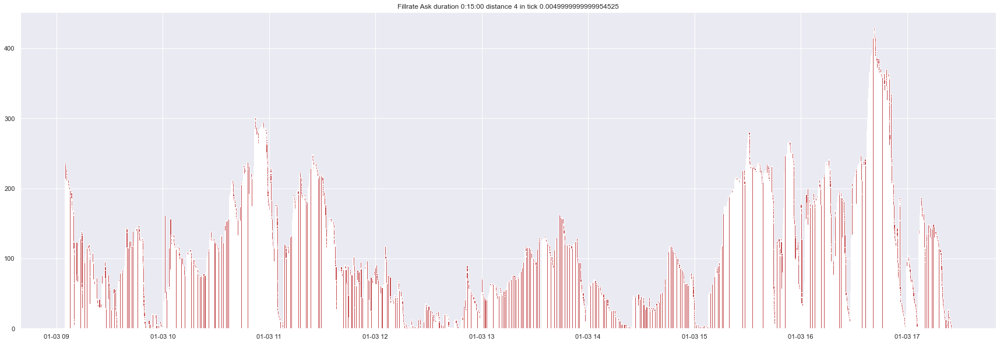

---- Duration 0:01:00


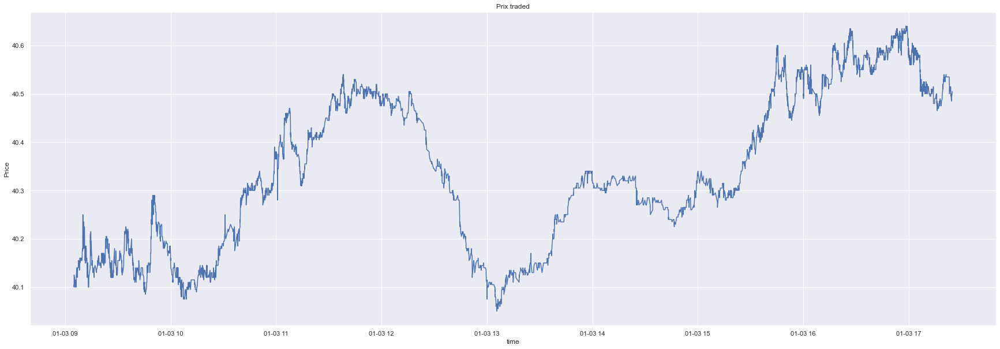

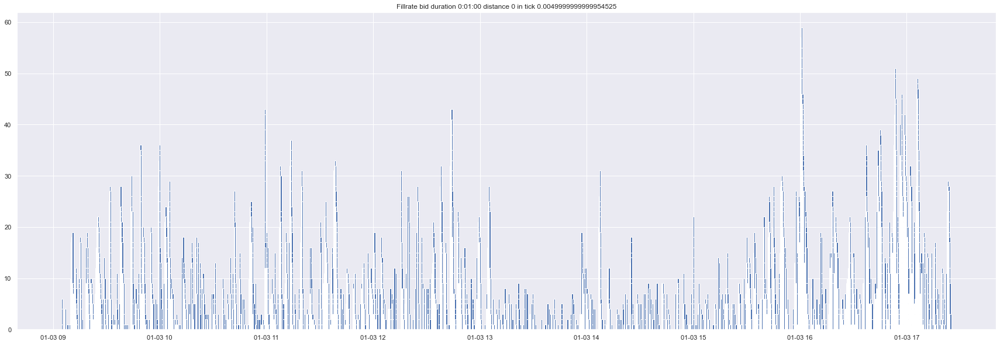

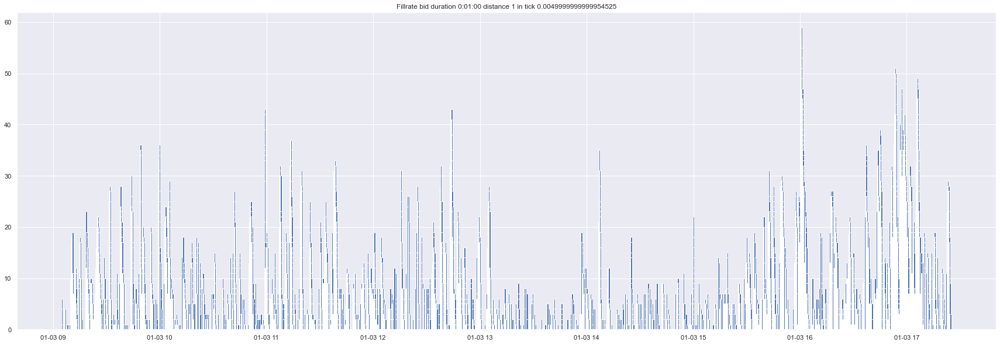

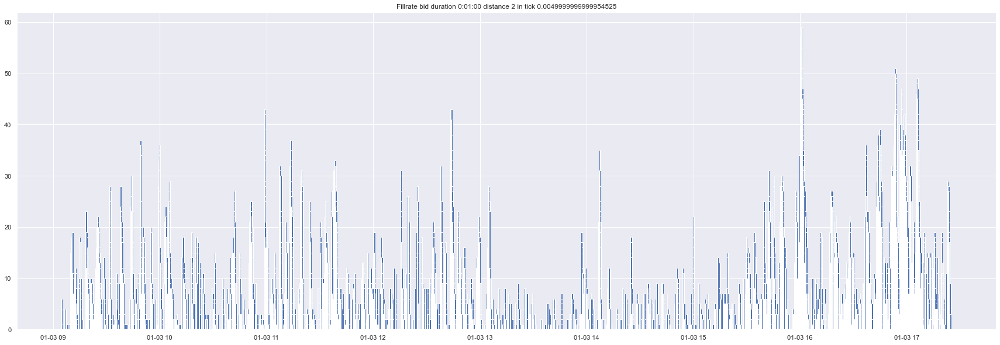

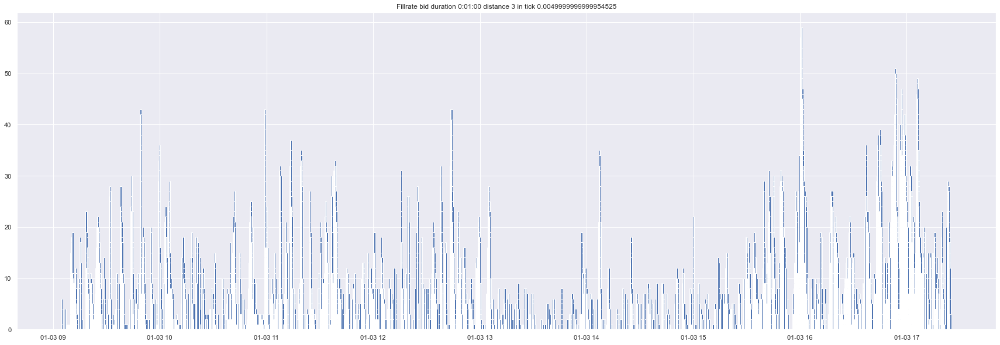

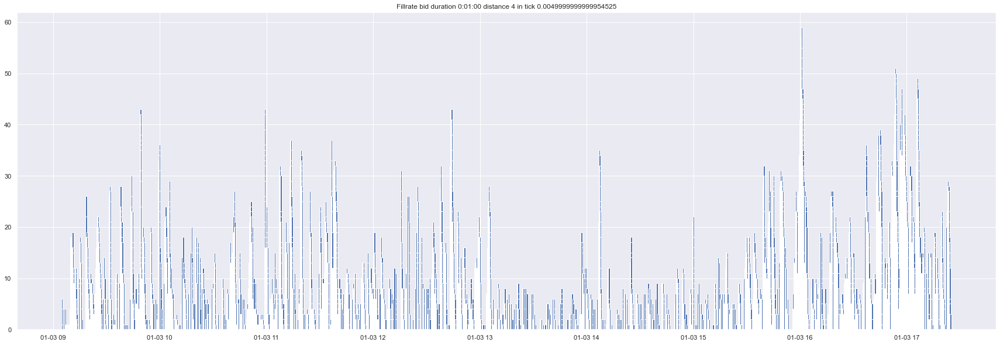

---- Duration 0:05:00


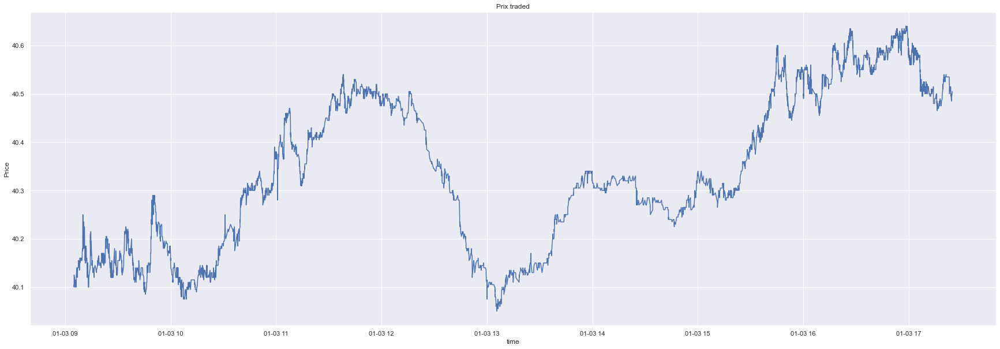

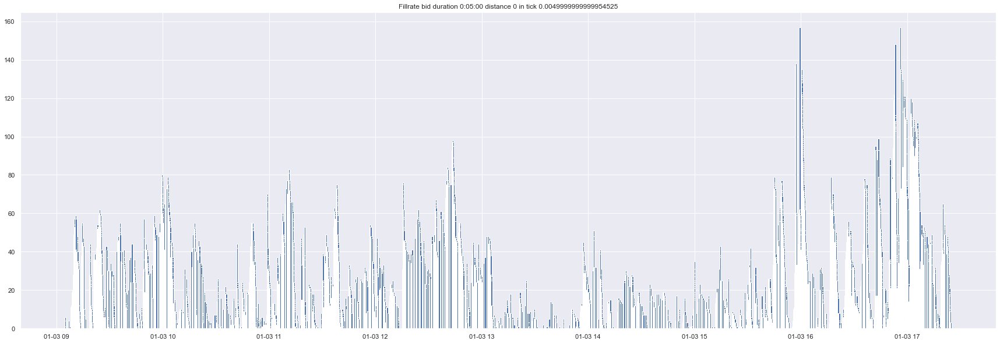

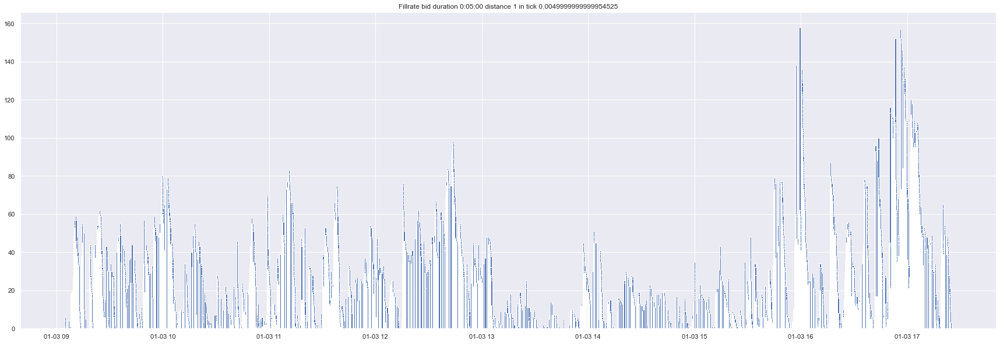

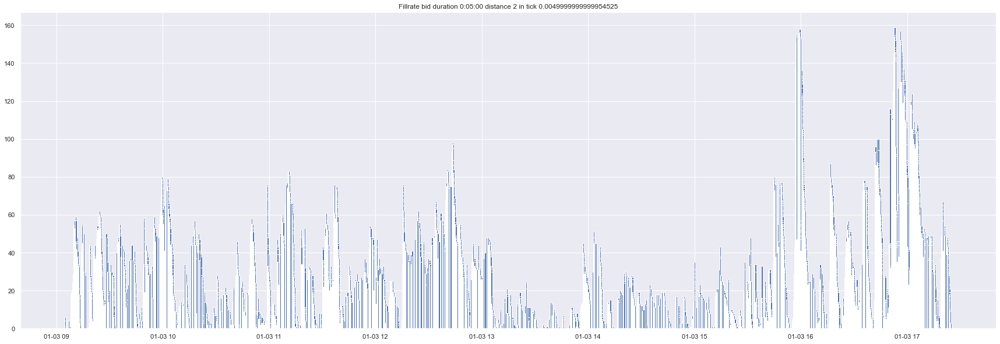

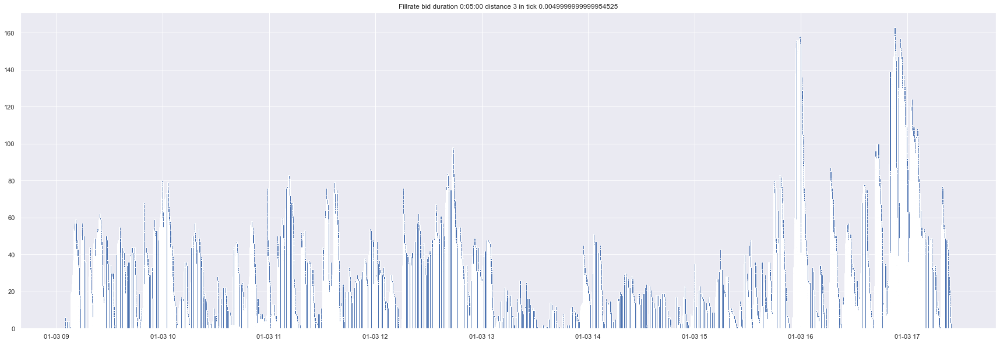

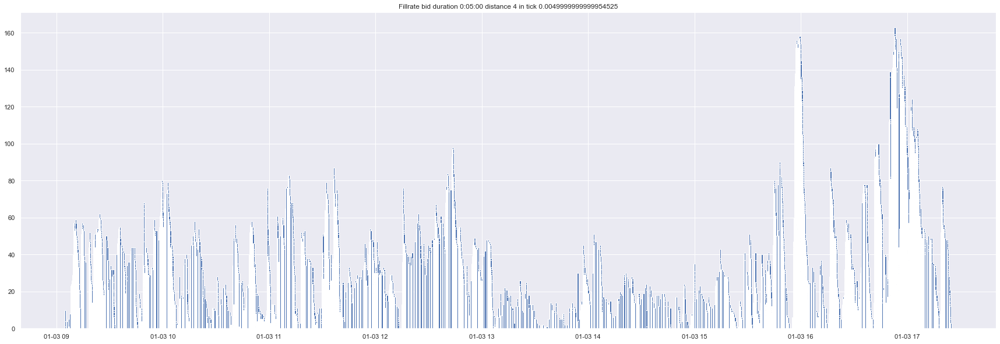

---- Duration 0:10:00


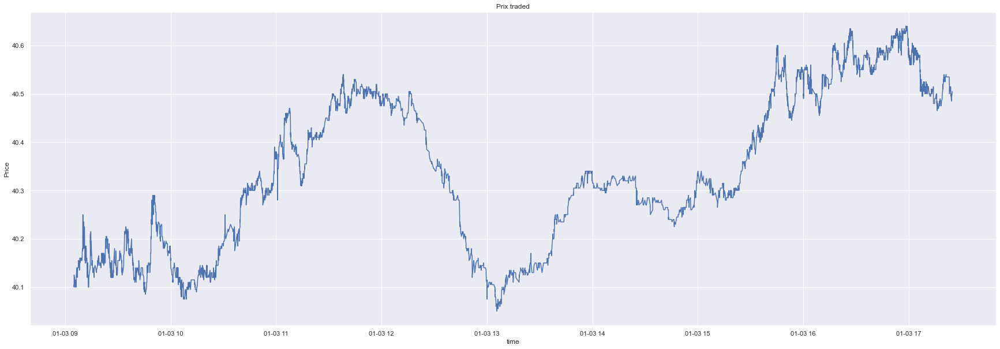

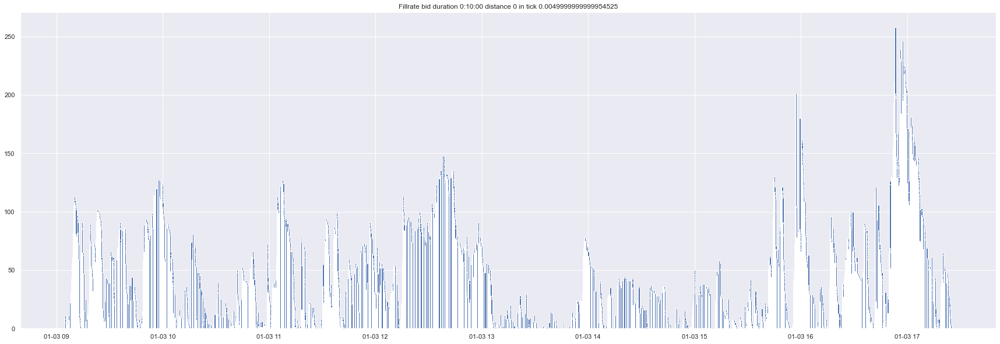

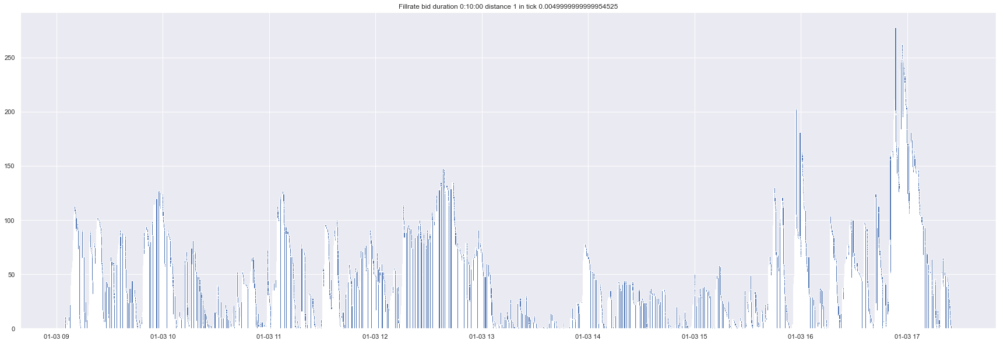

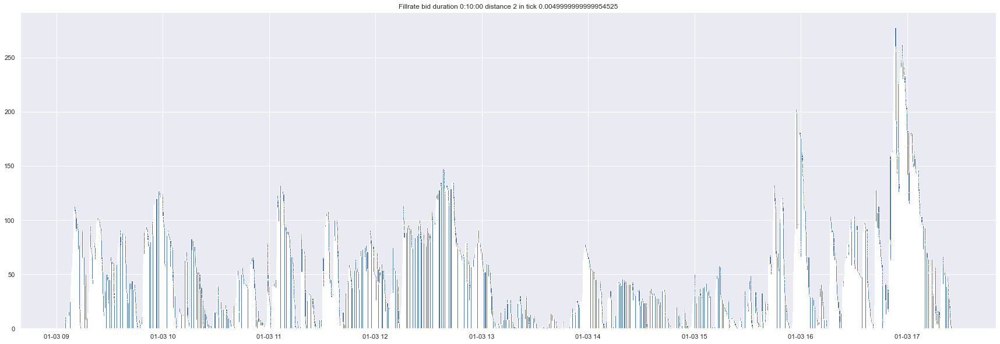

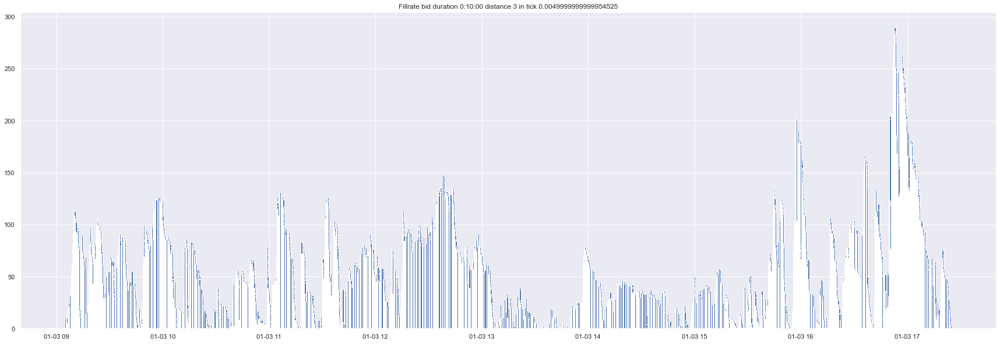

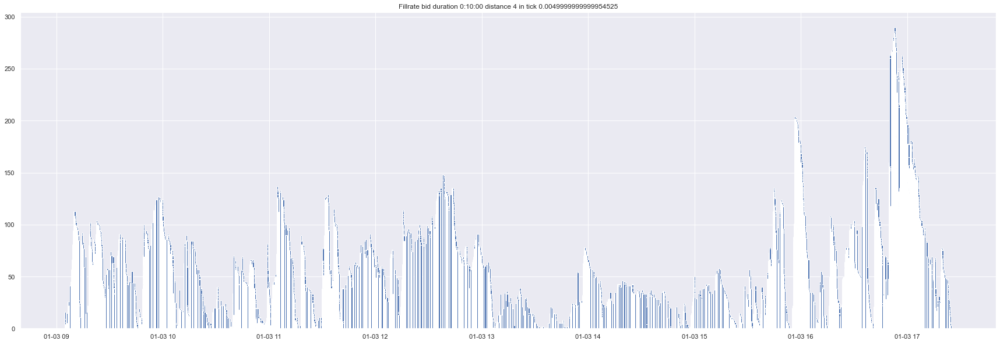

---- Duration 0:15:00


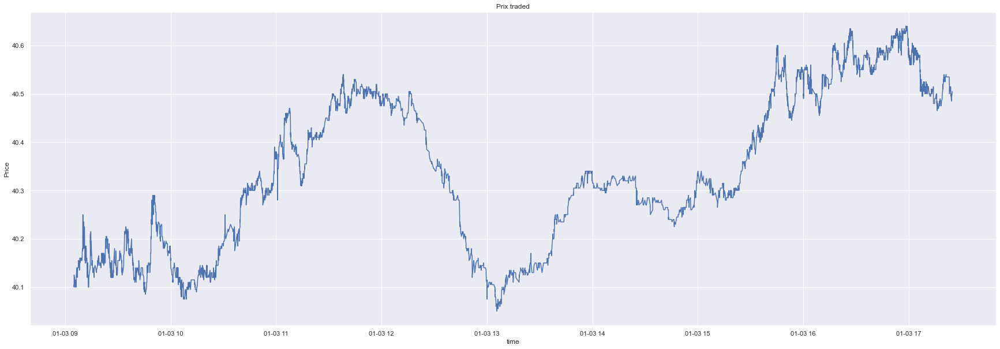

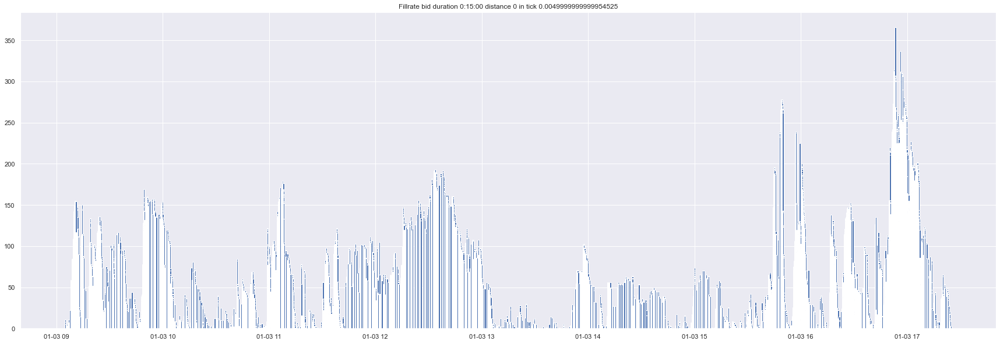

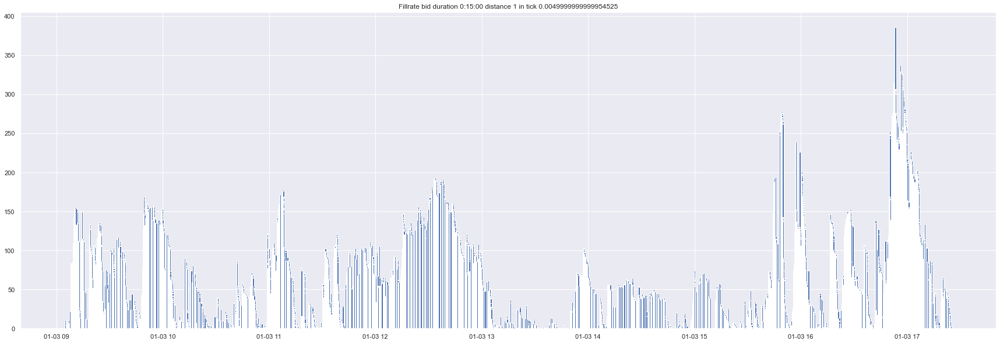

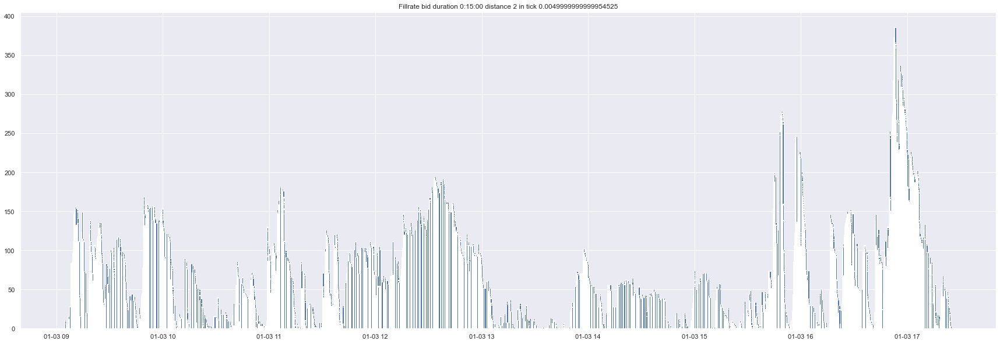

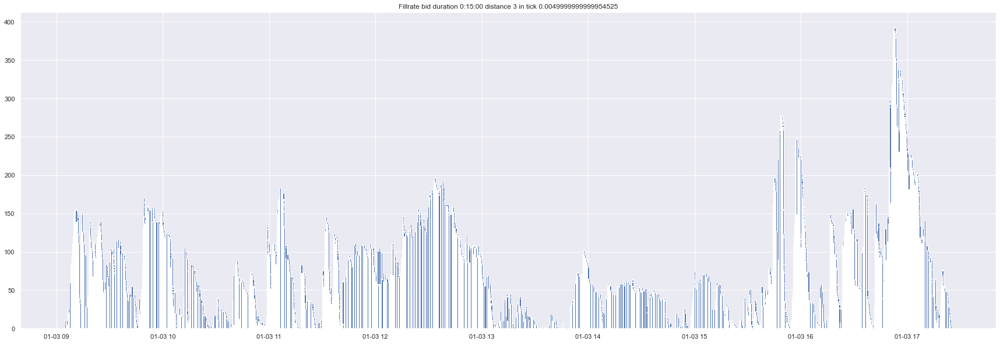

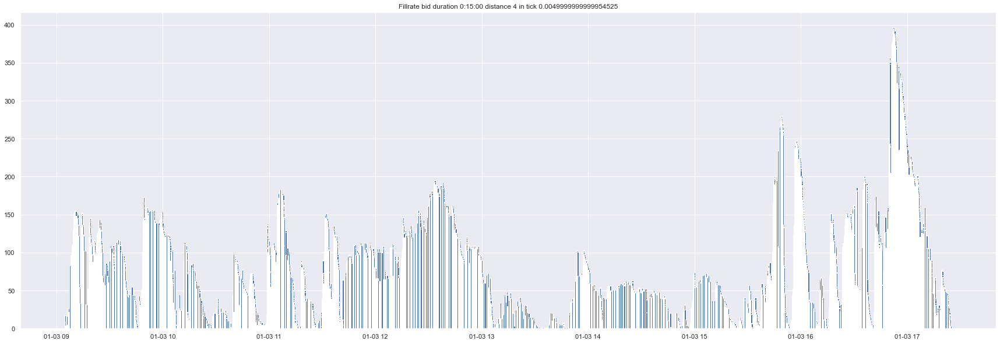

In [823]:
plot_fillrates(values_fillrate['TOTAL'], all_fillrates, combi_to_plot, tick) 

Comme on peut le voir, les écarts de fillrates au sein d'une même duration pour différentes distances sont imperceptibles mais sont bien là (voir tableau dans la section précédente). Graphiquement, on a du mal à distinguer les figures entre elles à duration fixe que ce soit pour le côté ask (en rouge) ou bid (en bleu).

Par contre, plus la duration augmente, plus les valeurs des fillrates augmentent et on a plus d'exécution (moins de valeurs nulles de fillrates). On a l'impression aussi de retrouver l'allure de la courbe des prix. 

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;"> b-Inventory and Market making  </h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

In [396]:
def compute_inventory(all_fillrates, start = True) :
    # start met l'inventory initial à 0
    durations = list(all_fillrates['AskPrice'].keys())
    inventories = {key : None for key in durations}
    for key in durations :
        values_ask, values_bid = all_fillrates['AskPrice'][key], all_fillrates['BidPrice'][key]
        columns = values_ask.columns[2:]
        for da in columns :
            for db in columns :
                values = np.cumsum(np.array(values_bid[db].to_numpy()) -(np.array(values_ask[da].to_numpy())))
                values = pd.DataFrame(values, columns=[da+'-'+db], index = values_ask['time'])
                if inventories[key] is None :
                    inventories[key] = values
                    if start :
                        inventories[key][da+'-'+db] = inventories[key][da+'-'+db] - inventories[key][da+'-'+db][0]
                else :
                    if start :
                        inventories[key][da+'-'+db] = values[da+'-'+db] - values[da+'-'+db][0]
                    else :
                        inventories[key][da+'-'+db] = values[da+'-'+db]
    return inventories

Pour le calcul de l'inventory, on fixe $V_0$ à 0 et l'inventory est la somme cumulative des différences des fillrates bid et ask pour chaque combinaison de distances $d_a$ et $d_b$.

In [397]:
inventories = compute_inventory(all_fillrates)
inventories[durations[3]]

,0-0,0-1,0-2,0-3,0-4,0-5,0-6,0-7,0-8,0-9,...,9-0,9-1,9-2,9-3,9-4,9-5,9-6,9-7,9-8,9-9
time,,,,,,,,,,,,,,,,,,,,,
2011-01-03 09:05:04.594,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2011-01-03 09:05:04.594,-188,-188,-188,-188,-182,-177,-168,-167,-164,-138,...,-225,-225,-225,-225,-219,-214,-205,-204,-201,-175
2011-01-03 09:05:04.594,-376,-376,-376,-376,-364,-354,-336,-334,-328,-276,...,-450,-450,-450,-450,-438,-428,-410,-408,-402,-350
2011-01-03 09:05:05.005,-567,-567,-566,-566,-554,-538,-515,-504,-497,-442,...,-678,-678,-677,-677,-665,-649,-626,-615,-608,-553
2011-01-03 09:05:05.005,-758,-758,-756,-756,-744,-722,-694,-674,-666,-608,...,-906,-906,-904,-904,-892,-870,-842,-822,-814,-756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-01-03 17:24:41.460,-307081,-277238,-217108,-133000,-52906,17847,82061,145574,200589,253792,...,-787863,-758020,-697890,-613782,-533688,-462935,-398721,-335208,-280193,-226990
2011-01-03 17:24:41.460,-307080,-277237,-217107,-132999,-52905,17848,82062,145575,200590,253793,...,-787862,-758019,-697889,-613781,-533687,-462934,-398720,-335207,-280192,-226989
2011-01-03 17:24:41.460,-307079,-277236,-217106,-132998,-52904,17849,82063,145576,200591,253794,...,-787861,-758018,-697888,-613780,-533686,-462933,-398719,-335206,-280191,-226988


## Graphe pour différentes combinaisons

In [791]:
def plot_inventory(values_fillrate_, courbes, inventory, combi_to_plot) :
    for key, combi in combi_to_plot.items() :
        print(f'---- Duration {key}')
        fig, ax = plt.subplots(1,2, figsize=(20, 5))
        # prix
        ax[0].plot(values_fillrate_.index, values_fillrate_['TradedPrice'])
        ax[0].set_xlabel('time')
        ax[0].set_ylabel('Price')
        ax[0].set_title(f'Prix traded')
        # vol
        ax[1].plot(courbes.index, courbes['vol'])
        ax[1].set_xlabel('time')
        ax[1].set_ylabel('Volatility')
        ax[1].set_title(f'Volatilité ')
        plt.show()
        
        for i, c in enumerate(combi) :
            fig, ax = plt.subplots(1, figsize=(7.5, 5))
            ax.plot(inventory[key].index, inventory[key][c].to_numpy())
            ax.set_xlabel('time')
            ax.set_ylabel('inventory')
            ax.set_title(f'Inventory pour {key} {c} ')
            plt.show()

In [779]:
combi_to_ = [str(fixed_distances[i])+'-'+str(fixed_distances[j]) for i in range(5) for j in range(5)]
combi_to_plot = {key : combi_to_ for key in durations}

---- Duration 0:01:00


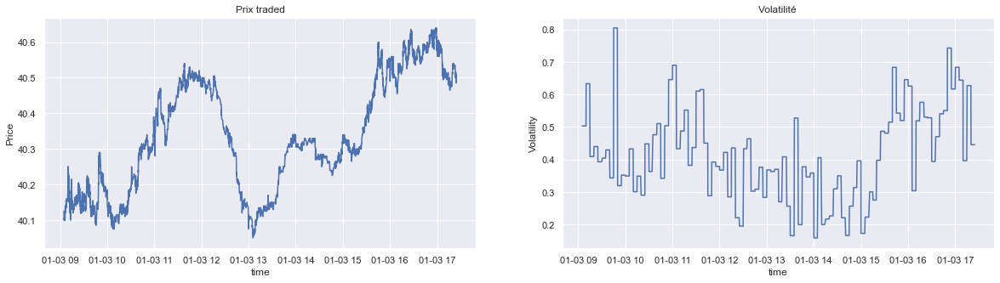

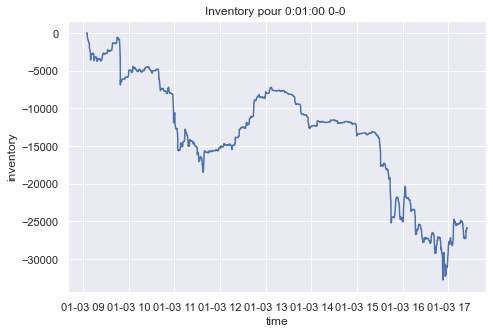

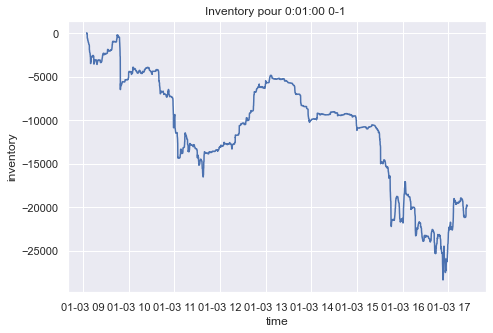

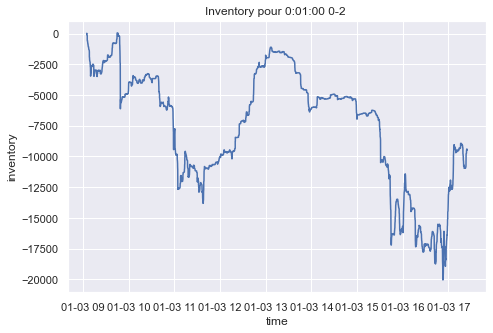

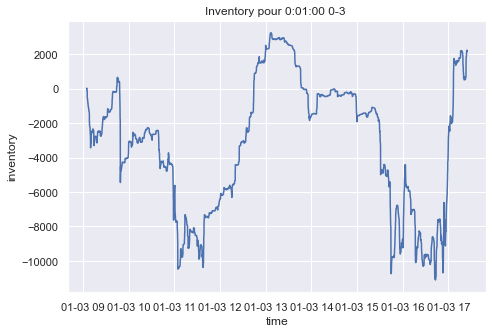

...

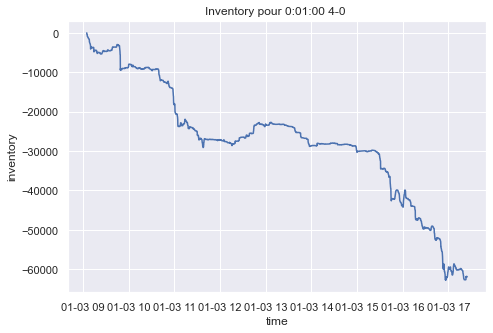

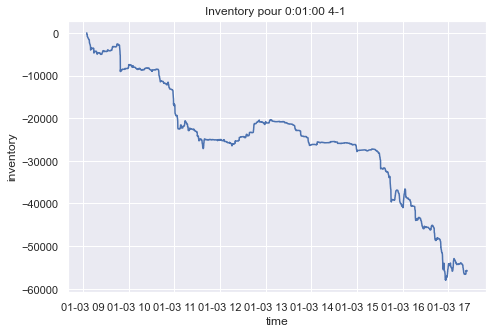

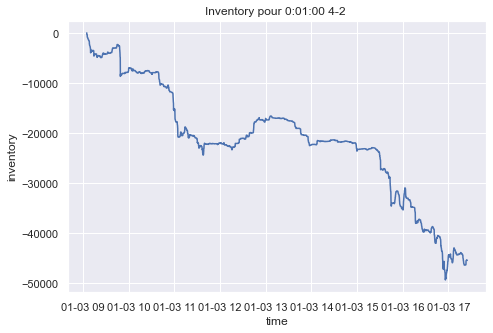

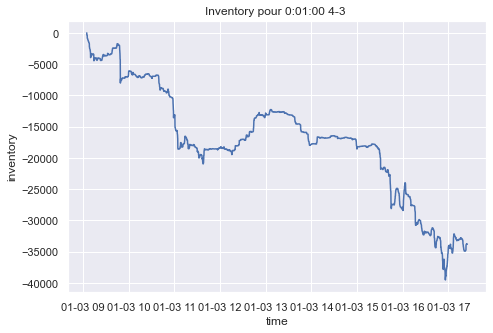

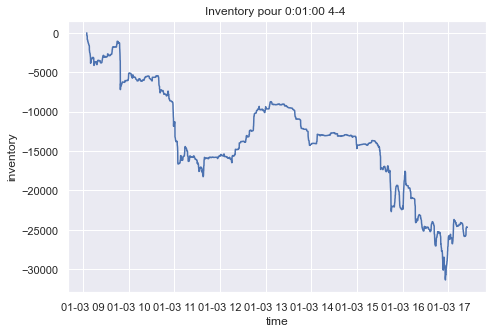

---- Duration 0:05:00


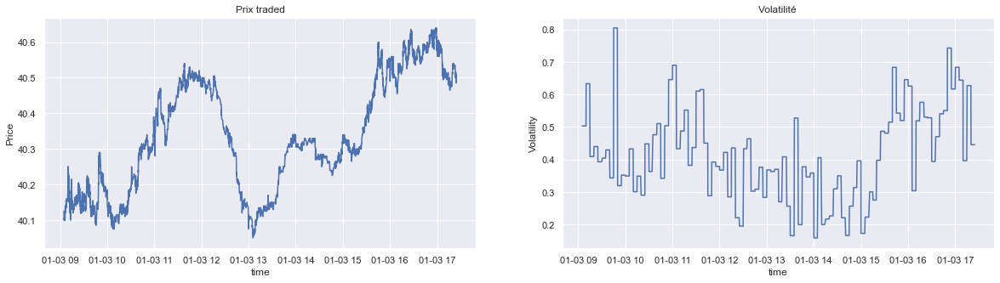

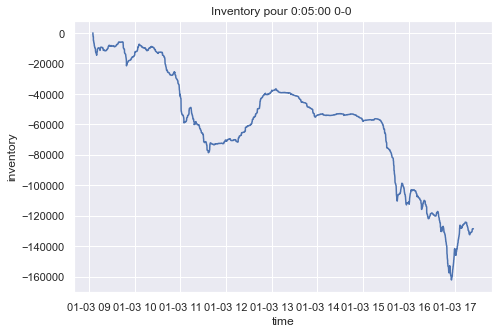

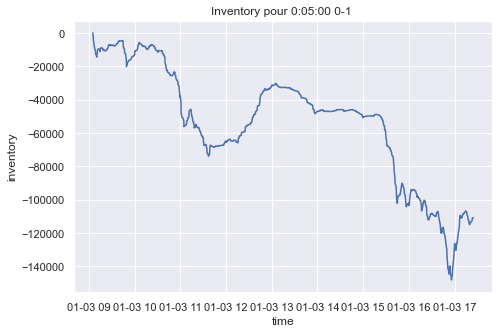

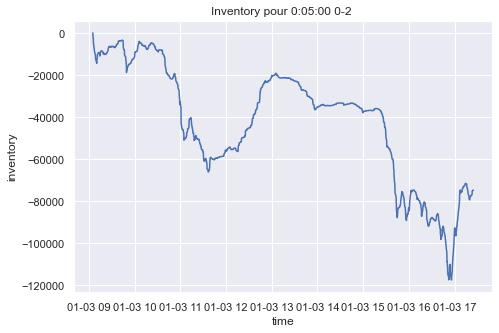

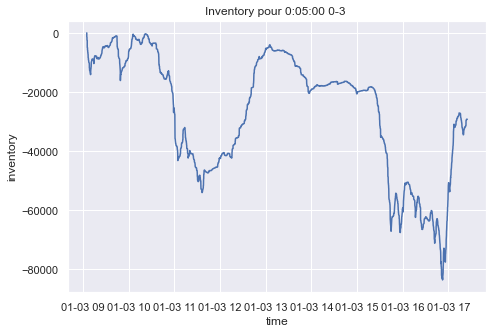

...

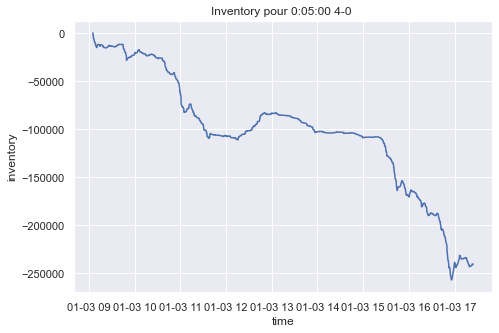

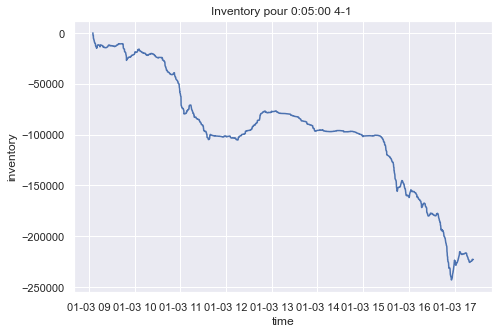

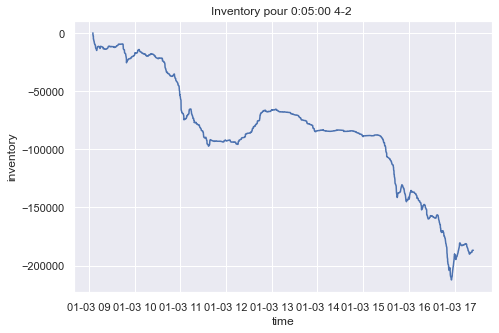

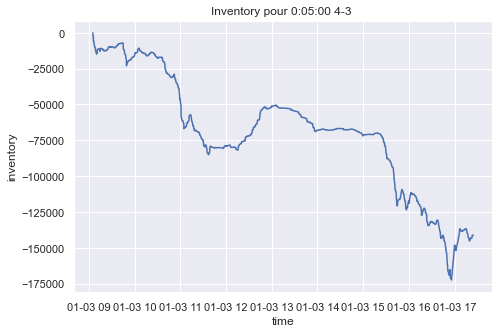

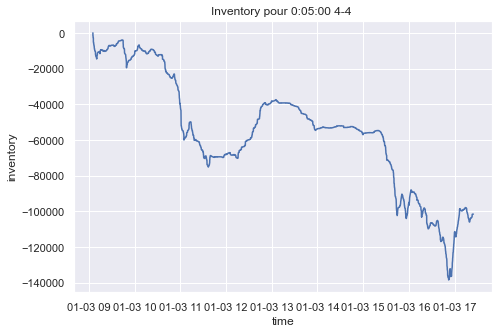

---- Duration 0:10:00


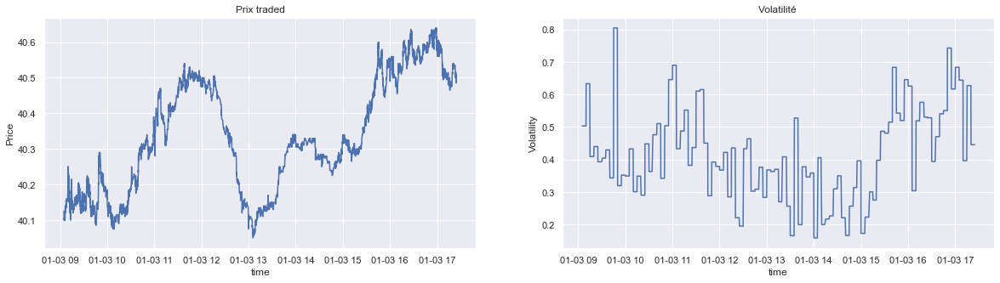

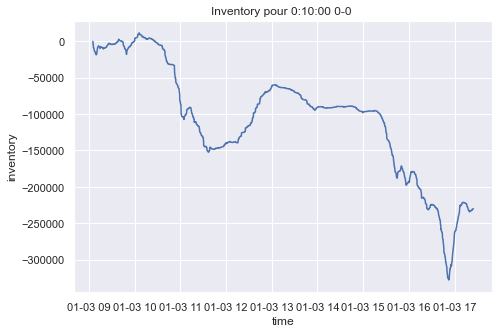

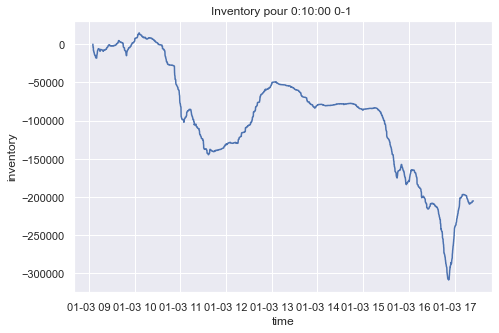

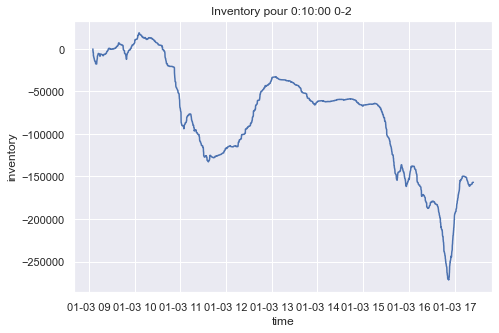

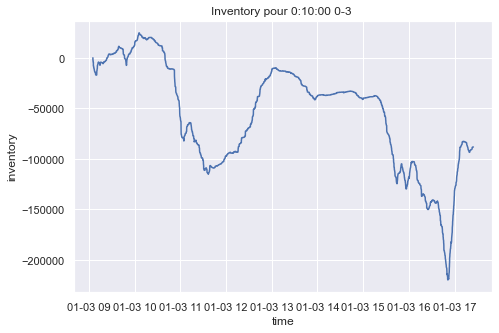

...

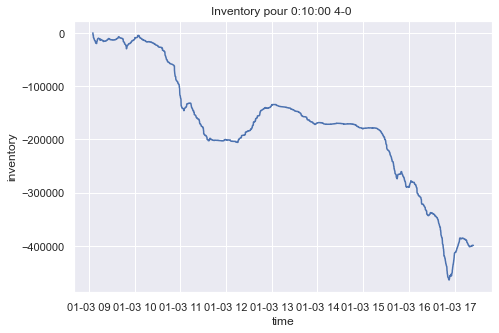

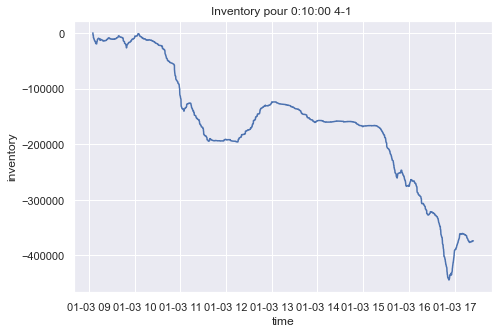

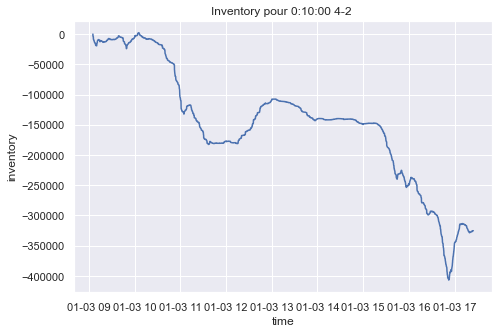

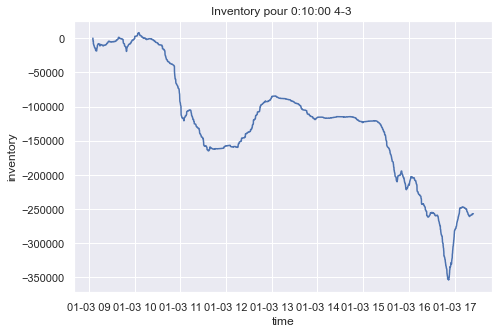

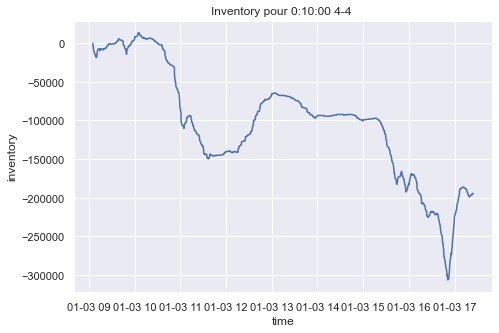

---- Duration 0:15:00


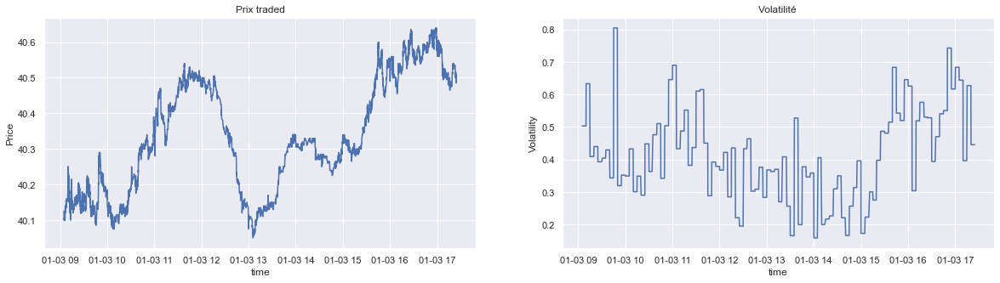

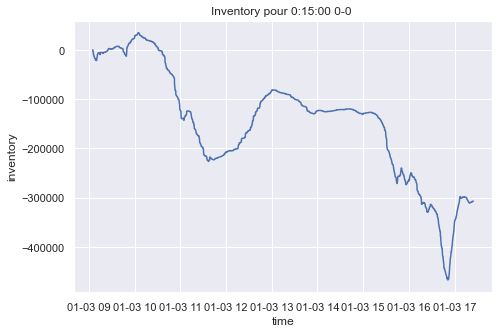

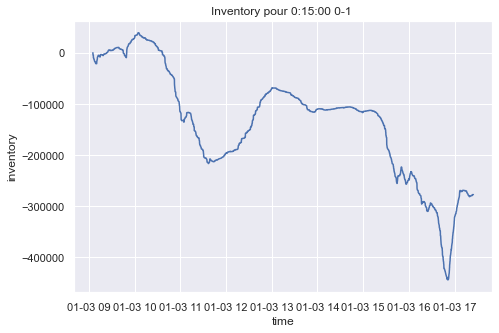

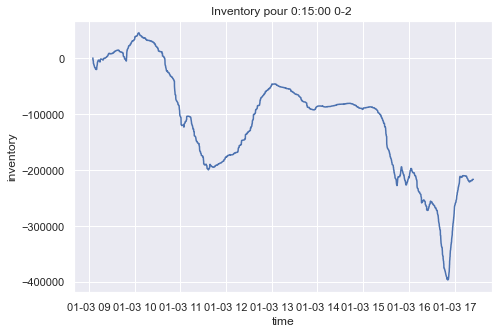

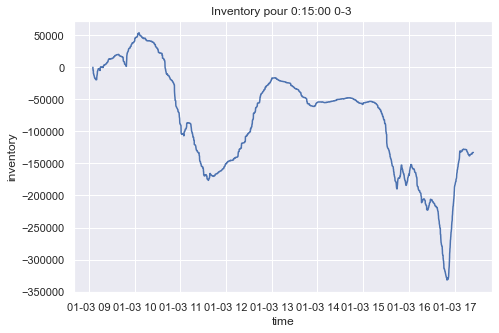

...

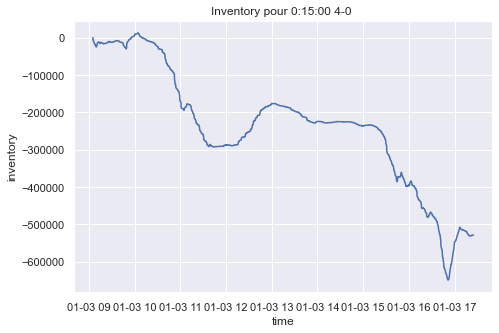

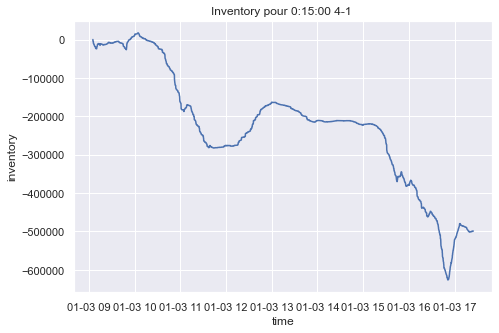

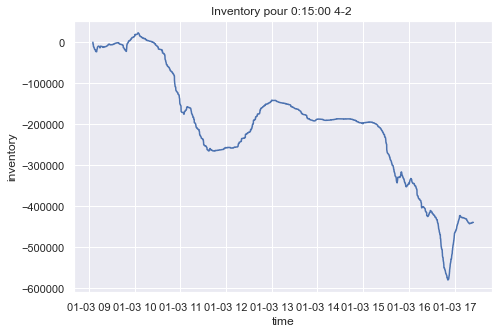

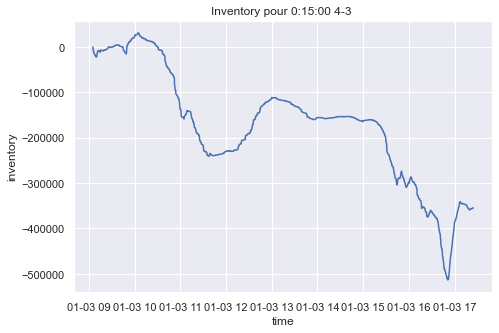

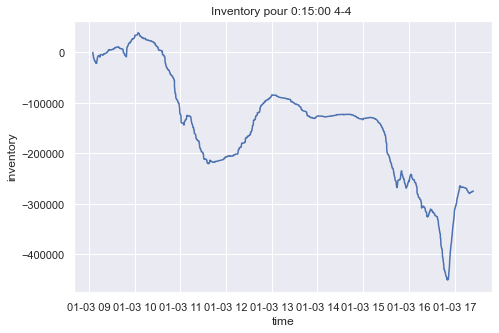

In [792]:
plot_inventory(values_fillrate['TOTAL'], courbes, inventories, combi_to_plot)

On remarque d'abord que les valeurs de l'inventory sont très élevées en valeur absolue et plutôt négatives dans les cas testés (en moyenne). 

On observe pour les différentes durations, qu'à distance $d_a$ fixe, et pour une distance $d_b$ croissante, l'inventory augmente (devient positif - ceci est dû à l'augmentation des fillrates bids avec la distance) tandis qu'il devient de plus en plus négatif lorsqu'on fixe la distance $d_b$ et augmente $d_a$.

Les graphes montrent que l'on peut trouver des valeurs de distances $d_a$ et $d_b$ intermédiaires qui établissent l'équilibre entre les deux tendances comme $d_a=1$ et $d_b=4$ pour la duration 1s.

## Etude de l'évolution de l'inventory en fonction de la volatilité et du spread

Le calcul de la volatilité se fait à partir du prix latent vu au TP2 moyennisé sur une période de 5 mins. L'étude de la corrélation entre les inventories obtenus et la volatilité et le spread se fait via un test de Person / Spearman.

In [628]:
def compute_tick(values, key_func) :
    difference = np.abs(values[key_func].diff(periods=1).dropna())
    indexes = difference != 0.0
    return difference[indexes].min()

def compute_eta(values, price) :
    diff_ = values[price].diff(periods=1).dropna()
    indexes = diff_ != 0.0
    diff_= diff_[indexes]
    val = diff_ > 0
    signe =  2*val - 1
    val = signe[1:] * signe[:-1]
    val = val.dropna()
    continuation = np.sum(val>0)
    alternation = np.sum(val<0)
    return continuation / (2*alternation)

def xt(values, eta, alpha, price_p) :
    values['latent'] = 0.0
    diff_ = values[price_p].diff(periods=1).dropna()
    val = diff_> 0
    signe =  2*val - 1
    val = signe*(1/2-eta)*alpha
    values.loc[1:, 'latent'] =  val
    values['latent'] = values['latent'] +values[price_p]
    return values

def function_vol(values, key_func) :
    vol = values[key_func].diff(periods=1)**2
    vol = np.sqrt(vol.dropna().sum())
    return vol,  vol/np.sqrt(values['trade'].sum())

def run_micro_day(values, plot=False) :
    alpha = compute_tick(values, 'TradedPrice')
    #print('tick ', alpha)
    eta = compute_eta(values, 'TradedPrice')
    #print('eta ',  eta)
    implicit_spread = 2*eta*alpha
    values['spread'] = values['AskPrice'] - values['BidPrice']
    #print('implicit spread ', 2*eta*alpha)
    values = xt(values, eta, alpha, 'TradedPrice')
    return alpha, eta, values, implicit_spread
   
def compute_vol(values):
    vol, vol_per_trade = function_vol(values, 'latent')
    vol_traded, vol_per_trade_traded = function_vol(values, 'TradedPrice')
    return values['spread'].mean(), vol, vol_per_trade, vol_traded, vol_per_trade_traded

def run_microstructure(values, h) :
    courbes = []
    time_index = values.index
    alpha, eta, values, implicit_spread = run_micro_day(values)
    time_start = time_index[0]
    time_end = time_index[-1]
    while time_end > time_start :
        trades_range = values.loc[time_index >= time_start]
        trades_range = trades_range.loc[trades_range.index <= time_start+h]
        spread_mean, vol, vol_per_trade, vol_traded, vol_per_trade_traded = compute_vol(trades_range)
        results = [alpha, eta, spread_mean, implicit_spread, 
                  vol, vol_per_trade, vol_traded, vol_per_trade_traded]
        for time in trades_range.index :
            courbes.append([time, *results])
        time_start += h
    courbes = pd.DataFrame(courbes, columns = ['time','alpha', 'eta','spread','implicit_spread', 'vol', 
                                                         'vol_per_trade', 'vol_traded', 'vol_per_trade_traded'])
    courbes.index = courbes['time']
    return courbes

def plot_vol_spread(courbes) :
    fig, ax = plt.subplots(1,2, figsize=(20, 5))
    ax[0].plot(courbes.index, courbes['vol'])
    ax[0].set_xlabel('time')
    ax[0].set_ylabel('Volatility')
    ax[0].set_title(f'Volatilité ')
    ax[1].plot(courbes.index, courbes['spread'])
    ax[1].set_xlabel('time')
    ax[1].set_ylabel('spread')
    ax[1].set_title(f'Bid-Ask spread')
    plt.show()

### Calcul des volatilité et bid-ask spread

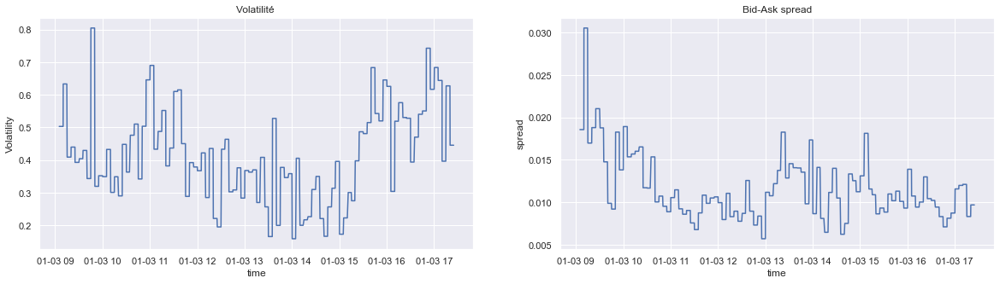

In [629]:
courbes = run_microstructure(values_fillrate['TOTAL'], datetime.timedelta(seconds=60*5)) 
plot_vol_spread(courbes)

In [605]:
values_fillrate['TOTAL'].head()

,TradedPrice,TradedQty,BidPrice,AskPrice,BidQty,AskQty,TradedSign,trade,spread,latent
Time,,,,,,,,,,
2011-01-03 09:05:04.594,40.105,1516,40.105,40.13,166500,54300,-1,1,0.025,40.105000
2011-01-03 09:05:04.594,40.105,149,40.105,40.13,166500,54300,-1,1,0.025,40.147639
2011-01-03 09:05:04.594,40.100,620,40.105,40.13,166500,54300,-2,1,0.025,40.142639
2011-01-03 09:05:05.005,40.100,1110,40.100,40.13,135900,54300,-1,1,0.030,40.142639
2011-01-03 09:05:05.005,40.100,149,40.100,40.13,135900,54300,-1,1,0.030,40.142639


In [606]:
courbes.head()

,time,alpha,eta,spread,implicit_spread,vol,vol_per_trade,vol_traded,vol_per_trade_traded
time,,,,,,,,,
2011-01-03 09:05:04.594,2011-01-03 09:05:04.594,0.005,9.027778,0.018563,0.090278,0.503073,0.039896,0.085294,0.006764
2011-01-03 09:05:04.594,2011-01-03 09:05:04.594,0.005,9.027778,0.018563,0.090278,0.503073,0.039896,0.085294,0.006764
2011-01-03 09:05:04.594,2011-01-03 09:05:04.594,0.005,9.027778,0.018563,0.090278,0.503073,0.039896,0.085294,0.006764
2011-01-03 09:05:05.005,2011-01-03 09:05:05.005,0.005,9.027778,0.018563,0.090278,0.503073,0.039896,0.085294,0.006764
2011-01-03 09:05:05.005,2011-01-03 09:05:05.005,0.005,9.027778,0.018563,0.090278,0.503073,0.039896,0.085294,0.006764


### Calcul des corrélations avec l'inventory

In [586]:
from scipy.stats.stats import pearsonr, spearmanr

In [603]:
def compute_correlation(X,y, name, index_) :
    coeff_p, p_value_p = pearsonr(X, y)
    coeff_s, p_value_s = spearmanr(X, y)
    value = pd.DataFrame([[coeff_p, p_value_p, coeff_s, p_value_s]], 
                         columns = [name+'-Pearson_coeff', name+'-Pearson_p_value', 
                                    name+'-spearman_coeff', name+'-spearman_p_value'],
                        index = [index_])
    return value
    
def compute_all_correlation(courbes, inventories) :
    correlation = {key : None for key in inventories.keys()}
    vol, spread = courbes['vol'], courbes['spread']
    for key, inventory in inventories.items() :
        for combi in inventory.columns :
            name1 = 'vol'
            name2 = 'spread'
            if correlation[key] is None :
                correlation[key] = compute_correlation(vol,inventory[combi], name1, combi)
                correlation[key] = pd.concat([correlation[key], 
                                              compute_correlation(spread,inventory[combi], name2, combi)], axis= 1)
            else :
                value = pd.concat([compute_correlation(vol,inventory[combi], name1, combi),
                                   compute_correlation(spread,inventory[combi], name2, combi)], axis= 1)
                correlation[key] = pd.concat([correlation[key], 
                                              value], axis= 0)
                
    return correlation

def plot_correlation(correlation) :
    fig, ax = plt.subplots(4,2, figsize=(30, 30))
    for i, key in enumerate(correlation) :
        ax[i,0].plot(correlation[key].index, correlation[key]['vol-Pearson_coeff'], 'o', label='Pearson')
        ax[i,0].plot(correlation[key].index, correlation[key]['vol-spearman_coeff'], 'o', label='spearman')
        ax[i,0].set_xlabel('combinaison')
        ax[i,0].set_ylabel('test')
        ax[i,0].set_title(f'Test de corrélation Pearson/Spearman Volatilité pour la duration {key}')
        ax[i,0].set_xticklabels(correlation[key].index, rotation=45)
        ax[i,0].legend()
        
        ax[i,1].plot(correlation[key].index, correlation[key]['spread-Pearson_coeff'], 'o', label='Pearson')
        ax[i,1].plot(correlation[key].index, correlation[key]['spread-spearman_coeff'], 'o', label='spearman')
        ax[i,1].set_xlabel('combinaison')
        ax[i,1].set_ylabel('test')
        ax[i,1].set_title(f'Test de corrélation Pearson/Spearman Spread pour la duration {key}')
        ax[i,1].set_xticklabels(correlation[key].index, rotation=45)
        ax[i,1].legend()
    plt.show()

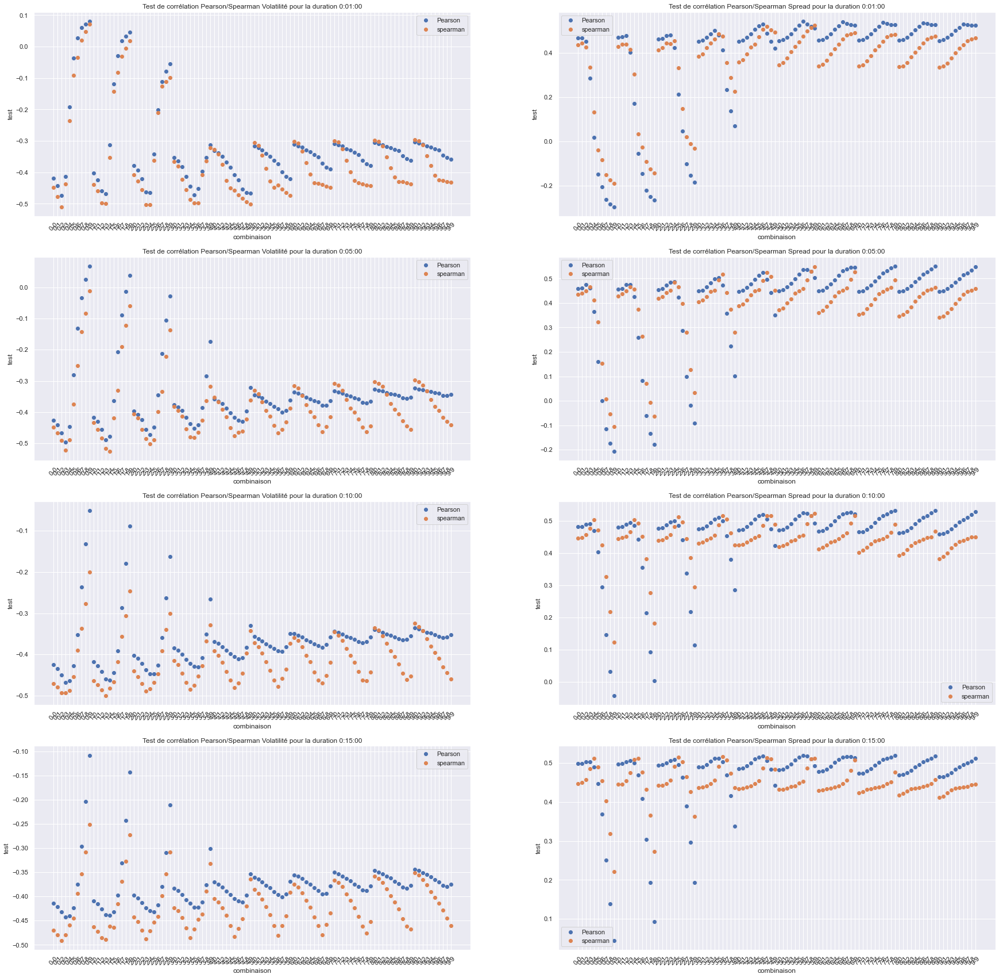

In [604]:
correlation = compute_all_correlation(courbes, inventories) 
plot_correlation(correlation)

Au vu des résultats ci-dessus, il semble bien qu'il y ait une corrélation entre les inventories et la volatilité et le bid-ask spread. Les coefficients de corrélation Pearson et Spearman indiquent que les corrélations évoluent suivant les combinaisons de distances choisies pour toutes les durations que ce soit pour la volatilités ou le spread. On remarque que les relations ne sont pas tout à fait linéaires et négatives pour la volatilités (graphes de gauche) et positives pour le bid ask spread (graphes de droite) indiquant que les sens d'évolution des 2 courbes sont inverses pour la volatilité et identiques pour le spread.

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;"> c- Static market making </h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

## Vérification de la stationnarité de l'inventory 

In [207]:
from statsmodels.tsa.stattools import kpss

In [445]:
def compute_kpss(inventories) :
    results_stati = {}
    for duration, inventor in inventories.items() :
        results = []
        for da_db in inventor.columns :
            results.append([da_db,kpss(inventor[da_db])[0]])
        results_stati[duration] = pd.DataFrame(results, columns = ['da-db', 'test'])
    return results_stati

def plot_stati(results_stati, inventories) :
    fig, ax = plt.subplots(4,2, figsize=(30, 30))
    min_kpss = []
    for i, key in enumerate(results_stati) :
        ax[i,0].plot(results_stati[key]['da-db'], results_stati[key]['test'], 'o')
        ax[i,0].set_xlabel('combinaison')
        ax[i,0].set_ylabel('test')
        ax[i,0].set_title(f'Test de stationarité pour la duration {key}')
        ax[i,0].set_xticklabels(results_stati[key]['da-db'], rotation=45)
        min_val = results_stati[key].loc[results_stati[key]['test']==results_stati[key]['test'].min()]
        min_val_combi = min_val['da-db'].to_numpy()[0]
        min_val_test = min_val['test'].to_numpy()[0]
        ax[i,1].plot(inventories[key].index, inventories[key][min_val_combi].to_numpy())
        ax[i,1].set_xlabel('time')
        ax[i,1].set_ylabel('inventory')
        ax[i,1].set_title(f'Inventory le plus stationaire pour {key} {min_val_combi} test: {min_val_test}')
        min_kpss.append([key,min_val_combi, min_val_test])
    plt.show()
    min_kpss = pd.DataFrame(min_kpss, columns = ['duration', 'da-db', 'test'])
    return min_kpss

In [402]:
results_stati = compute_kpss(inventories)

/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up ta

/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up ta

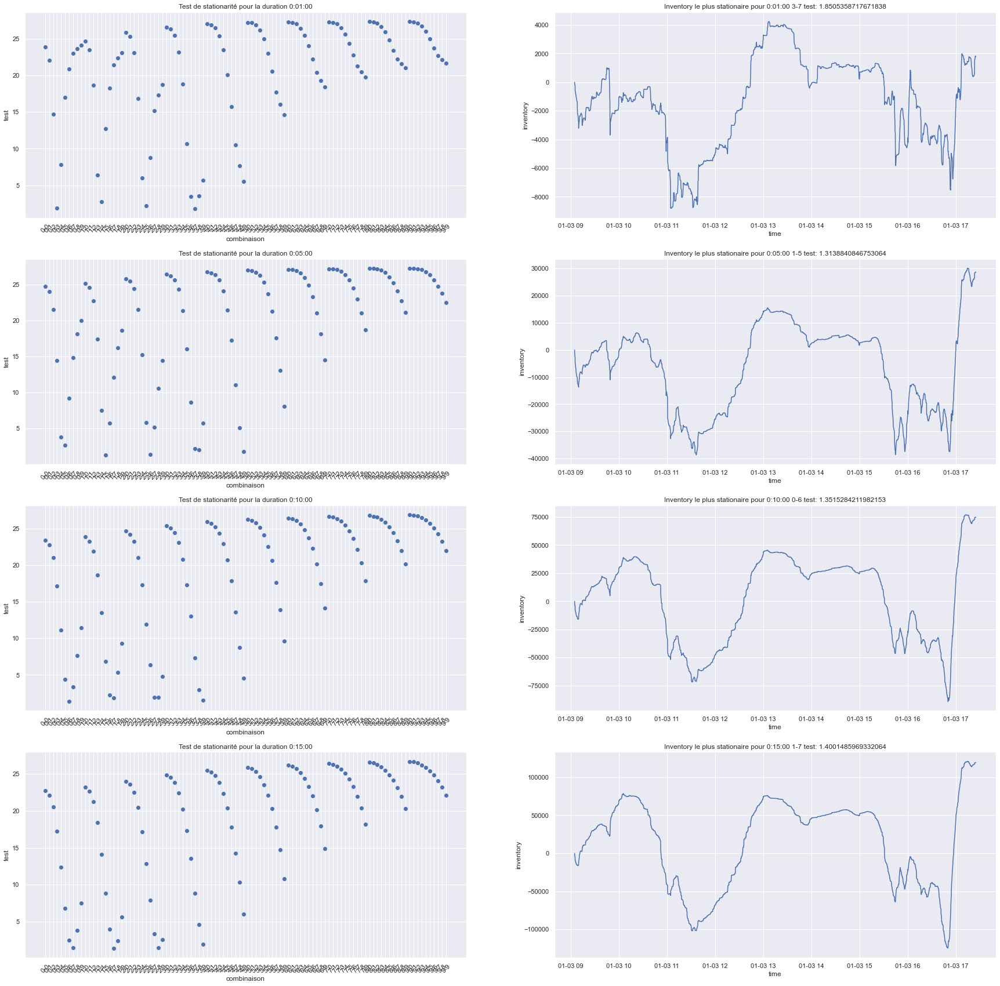

,duration,da-db,test
0,0 days 00:01:00,3-7,1.850536
1,0 days 00:05:00,1-5,1.313884
2,0 days 00:10:00,0-6,1.351528
3,0 days 00:15:00,1-7,1.400149


In [660]:
optimal_stati = plot_stati(results_stati, inventories) 
optimal_stati

Les combinaisons 'optimales' au sens de la stationarité sont données dans la table ci-dessus. On peut voir sur les graphes de l'inventory pour ces valeurs que l'on peut avoir un inventory qui tournent autour de 0 avec une amplitude plus grande pour une duration plus élevée. Les valeurs de test de stationarité sont tout de même assez grandes montrant que l'inventory n'est pas tout à fait stationnaire ce que l'on peut voir dans les courbes.

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;"> d- Dynamic market making </h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

In [632]:
def dynamic_market_making(courbes, fixed_distances, all_fillrates, start = True) :
    volatility = courbes['vol']
    tick = courbes['alpha'].max()
    max_sigma = volatility.max()
    max_distance = max(fixed_distances)
    max_ca = (max_distance+8)/(max_sigma) 
    
    # make the new distances
    ca = np.linspace(0.1, max_ca, 10)
    new_distances = courbes[['vol']]
    for c in ca :
        new_distances[c] = new_distances['vol']*c 
        new_distances[c] = new_distances[c].astype(int)
        new_distances.loc[new_distances[c]> max_distance, c] = max_distance
        if new_distances[c].min() == new_distances[c].max() :
            new_distances = new_distances.drop([c], axis=1)
      
    # plot the new distances
    distnace = new_distances.columns[1:][np.arange(0,len(new_distances.columns)-2,
                                                   (len(new_distances.columns)-1)//4)]
    fig, ax = plt.subplots(2,2, figsize=(20, 10))
    min_kpss = []
    for i, key in enumerate(distnace) :
        ax[i//2,i%2].plot(new_distances.index, new_distances[key])
        ax[i//2,i%2].set_xlabel('time')
        ax[i//2,i%2].set_ylabel('distance')
        ax[i//2,i%2].set_title(f'Distance pour c = {key}')
    plt.show()
    
    # compute the inventory
    # start met l'inventory initial à 0
    durations = list(all_fillrates['AskPrice'].keys())
    inventories_nonconstant = {key : None for key in durations}
    all_fillrates_nonconstant = {'AskPrice': {key : None for key in durations},
                                 'BidPrice': {key : None for key in durations}
                                }
    for key in durations :
        values_ask, values_bid = all_fillrates['AskPrice'][key], all_fillrates['BidPrice'][key]
        times = values_ask['time']
        values_ask_, values_bid_ = values_ask[values_ask.columns[2:]], values_bid[values_bid.columns[2:]]
        values_ask_.index = values_ask['time']
        values_bid_.index = values_bid['time']
        columns_ask = {k : j for j,k in enumerate(values_ask_.columns)}
        columns_bid = {k : j for j,k in enumerate(values_bid_.columns)}
        print(len(times))
        for da in new_distances.columns[1:] :
            distances_ask = new_distances[[da]]
            times_ask = distances_ask.index
            for db in new_distances.columns[1:] :
                distances_bid = new_distances[[db]]
                times_bid = distances_bid.index
                make_array_fillrate_ask, make_array_fillrate_bid = [], []
                for i,t in enumerate(times) :
                    fillrate_ask_en_t = values_ask_.iloc[i]
                    fillrate_bid_en_t = values_bid_.iloc[i]
                    valeur_ask_en_t = distances_ask.iloc[i][da]
                    valeur_bid_en_t = distances_bid.iloc[i][db]
                    make_array_fillrate_ask.append(fillrate_ask_en_t[columns_ask[str(valeur_ask_en_t)]])
                    make_array_fillrate_bid.append(fillrate_bid_en_t[columns_bid[str(valeur_bid_en_t)]])
                
                values = np.cumsum(np.array(make_array_fillrate_bid) -np.array(make_array_fillrate_ask))
                values = pd.DataFrame(values, columns=[str(da)+'-'+str(db)], index = values_ask['time'])
                values_ask_fillrates = pd.DataFrame(np.array(make_array_fillrate_ask), 
                                                    columns=[str(da)], index = values_ask.index)
                values_bid_fillrates = pd.DataFrame(np.array(make_array_fillrate_bid), 
                                                    columns=[str(db)], index = values_bid.index)
                if inventories_nonconstant[key] is None :
                    inventories_nonconstant[key] = values
                    if start :
                        inventories_nonconstant[key][str(da)+'-'+str(db)] = inventories_nonconstant[key][str(da)+'-'+str(db)]- inventories_nonconstant[key][str(da)+'-'+str(db)].to_numpy()[0]
                    all_fillrates_nonconstant['AskPrice'][key] = values_ask_fillrates
                    all_fillrates_nonconstant['AskPrice'][key]['AskPrice'] = values_ask['AskPrice']
                    all_fillrates_nonconstant['AskPrice'][key]['time'] = values_ask['time']
                    all_fillrates_nonconstant['BidPrice'][key] = values_bid_fillrates
                    all_fillrates_nonconstant['BidPrice'][key]['BidPrice'] = values_bid['BidPrice']
                    all_fillrates_nonconstant['BidPrice'][key]['time'] = values_bid['time']
                    
                else :
                    all_fillrates_nonconstant['AskPrice'][key][str(da)] = values_ask_fillrates[str(da)]
                    all_fillrates_nonconstant['BidPrice'][key][str(db)] = values_bid_fillrates[str(db)]
                    if start :
                        inventories_nonconstant[key][str(da)+'-'+str(db)] = values[str(da)+'-'+str(db)] - values[str(da)+'-'+str(db)][0]
                    else :
                        inventories_nonconstant[key][str(da)+'-'+str(db)] = values[str(da)+'-'+str(db)]
    
    return new_distances, inventories_nonconstant, all_fillrates_nonconstant



## Calcul des distances 

On calcule d'abord les distances pour différentes contantes suivant l'évolution de la volatilité puis on en déduit les inventories en faisant varier les combinaisons $c_a$ et $c_b$. Les premières figures ci-dessous montrent l'evolution des distances (en tick donc en valeurs entières) pour quelques constantes. En augmentant la constante, on se rapproche du graphe de la volatilité. Comme on n'a implémenté des distances fixes que jusqu'à 9, si les valeurs obtenues dépassent 9, on les remet à 9. On a testé que 10 valeurs et optimiser à partir de ces valeurs la forme de l'inventory (en stationarité) donc les résultats ne semblent pas bien optimisés.

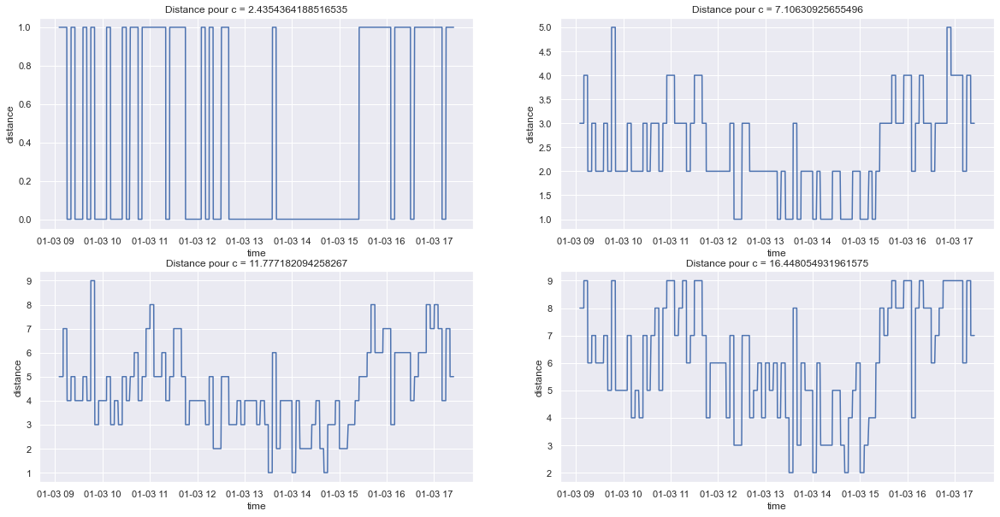

11877
11877
11877
11877


In [633]:
new_distances, inventories_nonconstant, all_fillrates_nonconstant = dynamic_market_making(courbes, fixed_distances, all_fillrates)

## Graphe de fillrates

In [634]:
all_fillrates_nonconstant['AskPrice'][datetime.timedelta(seconds=60)]

,2.4354364188516535,AskPrice,time,4.7708728377033065,7.10630925655496,9.441745675406613,11.777182094258267,14.11261851310992,16.448054931961575,18.78349135081323,21.118927769664882
0,0,40.130,2011-01-03 09:05:04.594,0,10,12,12,32,32,32,32
1,0,40.130,2011-01-03 09:05:04.594,0,10,12,12,32,32,32,32
2,0,40.130,2011-01-03 09:05:04.594,0,10,12,12,32,32,32,32
3,0,40.130,2011-01-03 09:05:05.005,0,10,12,12,32,32,32,32
4,0,40.130,2011-01-03 09:05:05.005,0,10,12,12,32,32,32,32
...,...,...,...,...,...,...,...,...,...,...,...
11872,2,40.505,2011-01-03 17:24:41.460,2,2,2,2,2,2,2,2
11873,2,40.505,2011-01-03 17:24:41.460,2,2,2,2,2,2,2,2
11874,2,40.505,2011-01-03 17:24:41.460,2,2,2,2,2,2,2,2
11875,2,40.505,2011-01-03 17:24:45.230,2,2,2,2,2,2,2,2


In [826]:
combi_to_plot = {key : np.array([c for c in all_fillrates_nonconstant['AskPrice'][key].columns 
                        if c != 'time' and c!= 'AskPrice'])[np.arange(0, 9, 2)][:4]
                 for key in all_fillrates_nonconstant['AskPrice'].keys()}
combi_to_plot

{datetime.timedelta(seconds=60): array(['2.4354364188516535', '7.10630925655496', '11.777182094258267',
        '16.448054931961575'], dtype='<U18'),
 datetime.timedelta(seconds=300): array(['2.4354364188516535', '7.10630925655496', '11.777182094258267',
        '16.448054931961575'], dtype='<U18'),
 datetime.timedelta(seconds=600): array(['2.4354364188516535', '7.10630925655496', '11.777182094258267',
        '16.448054931961575'], dtype='<U18'),
 datetime.timedelta(seconds=900): array(['2.4354364188516535', '7.10630925655496', '11.777182094258267',
        '16.448054931961575'], dtype='<U18')}

---- Duration 0:01:00


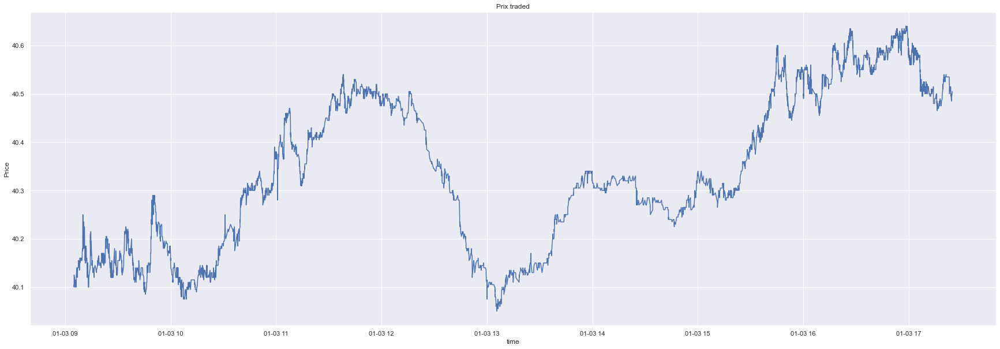

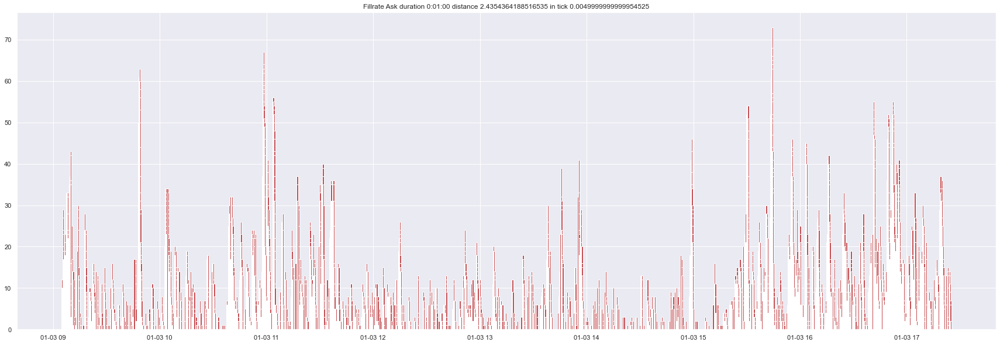

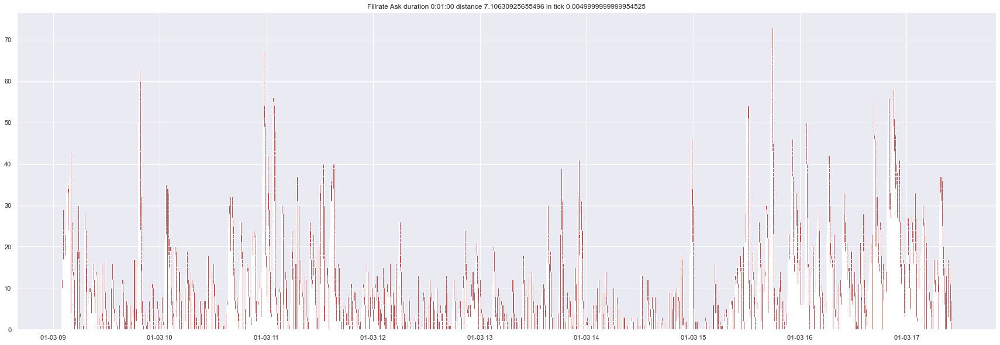

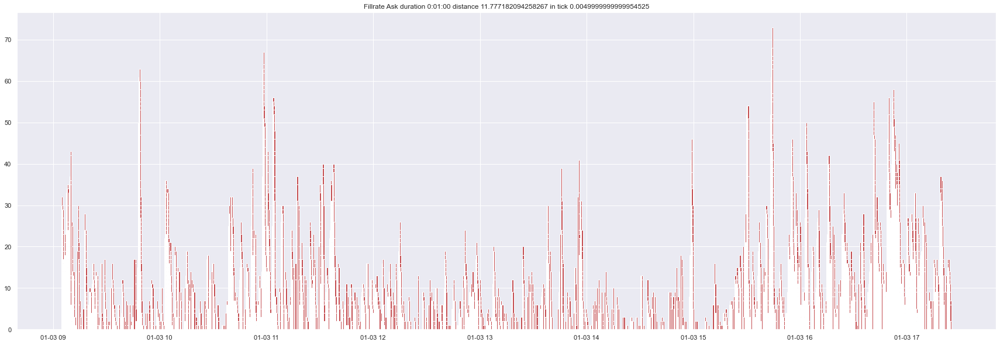

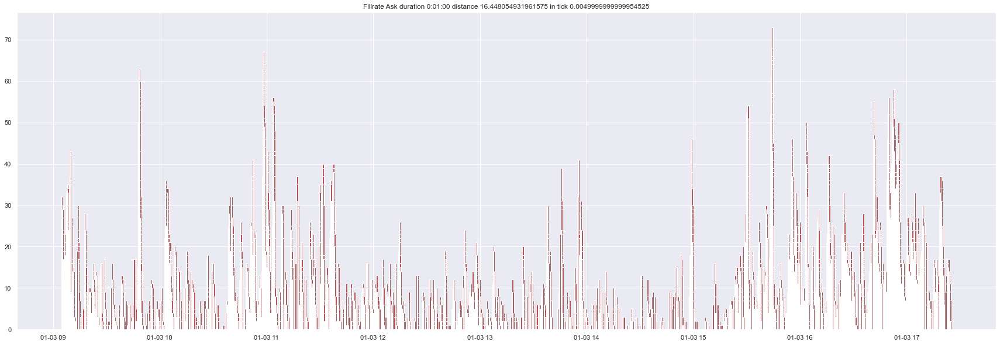

---- Duration 0:05:00


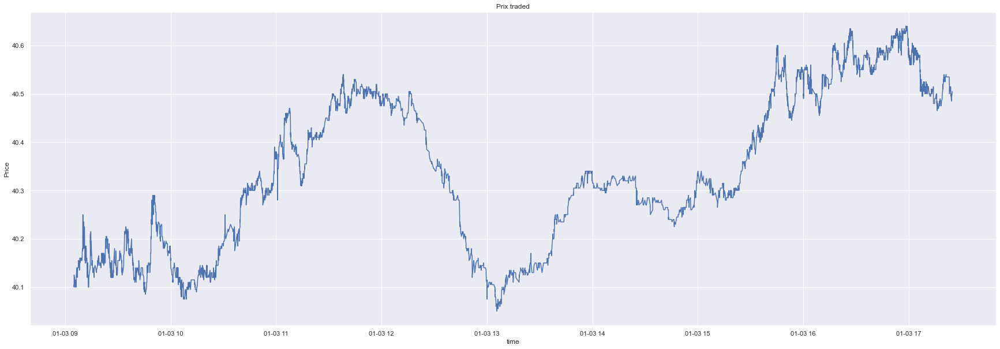

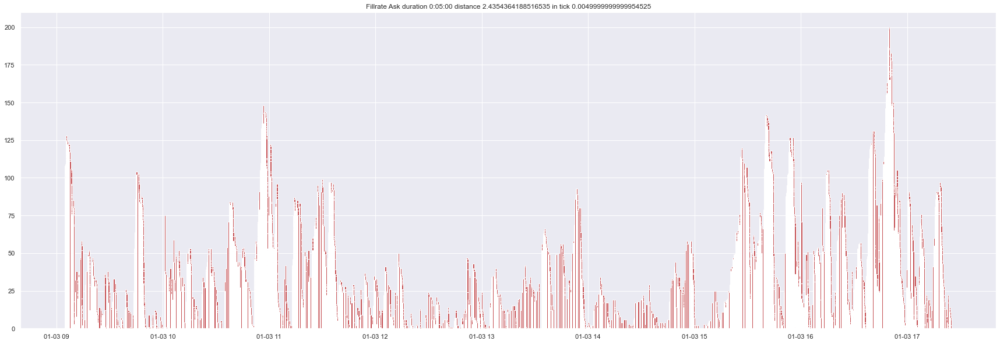

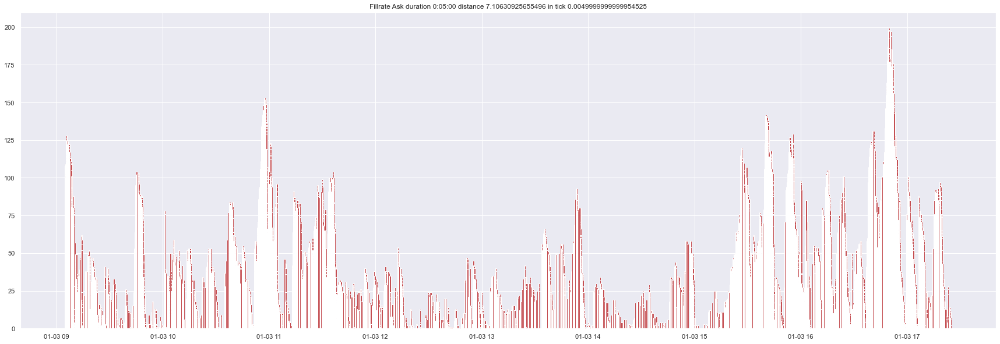

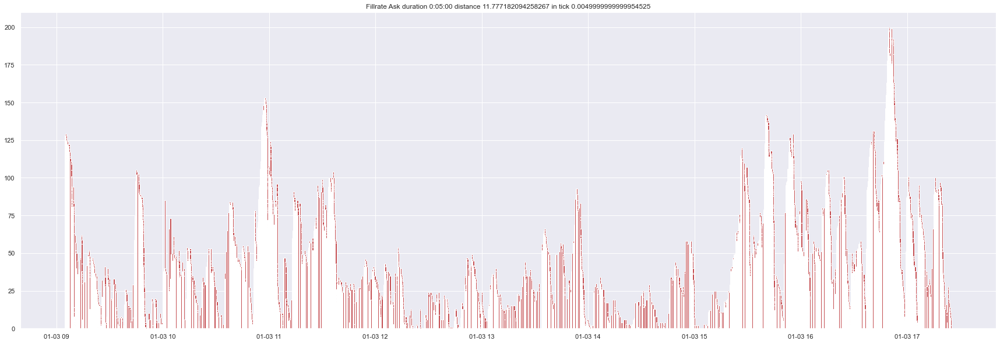

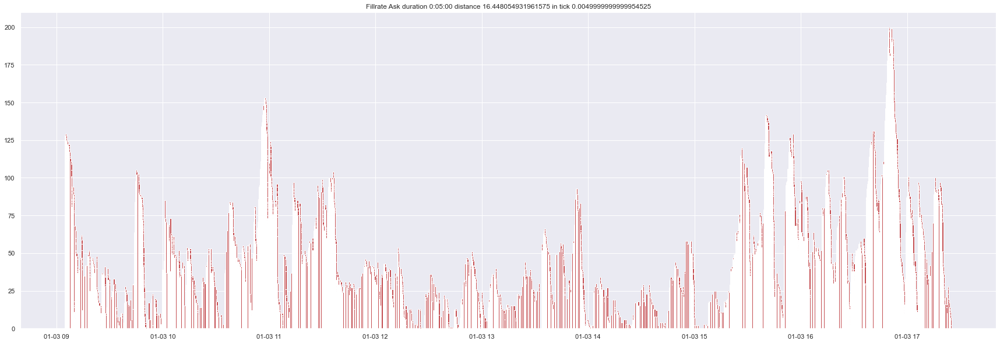

---- Duration 0:10:00


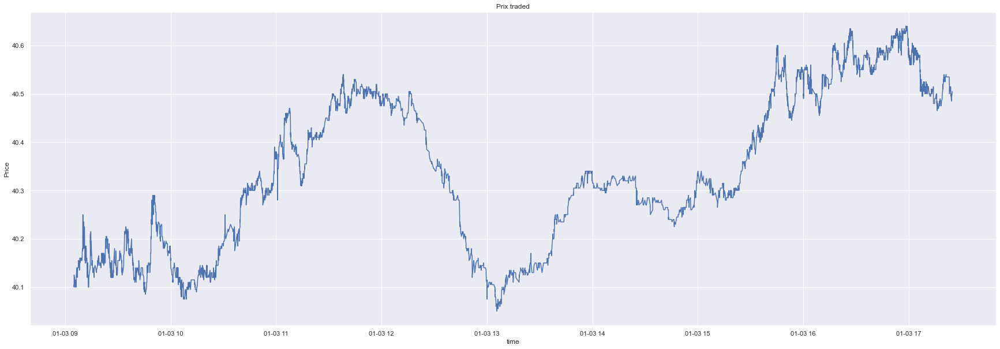

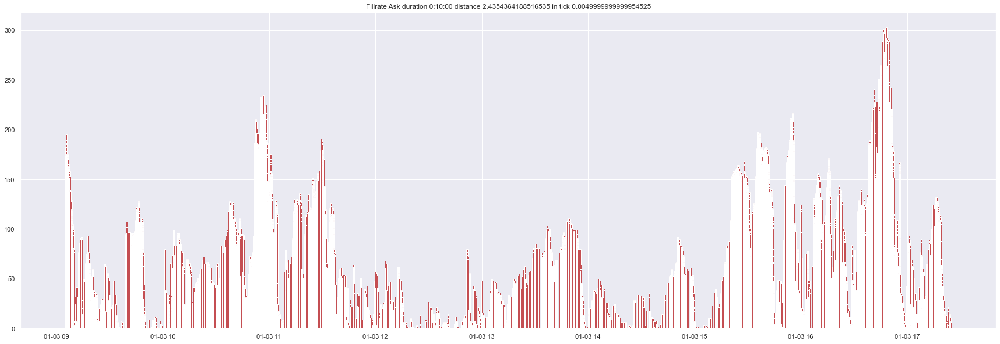

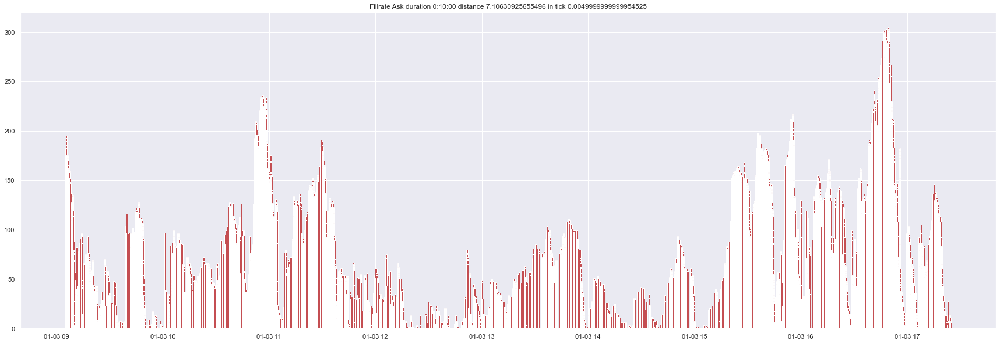

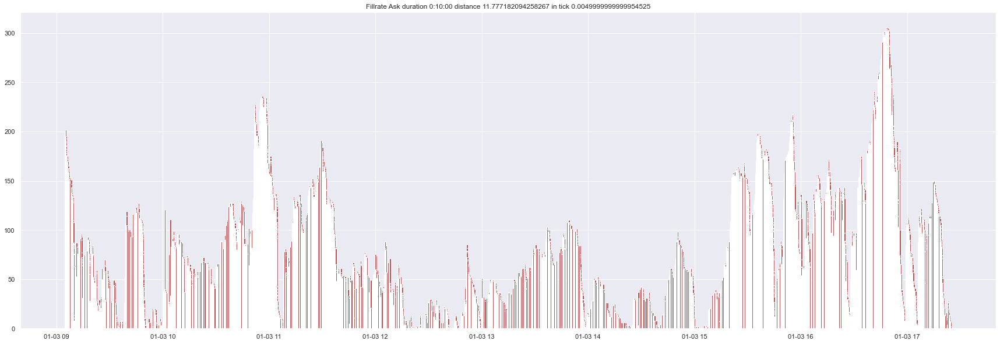

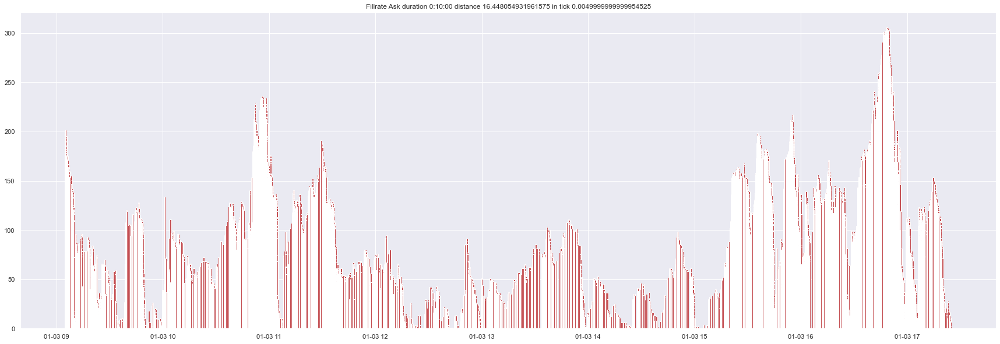

---- Duration 0:15:00


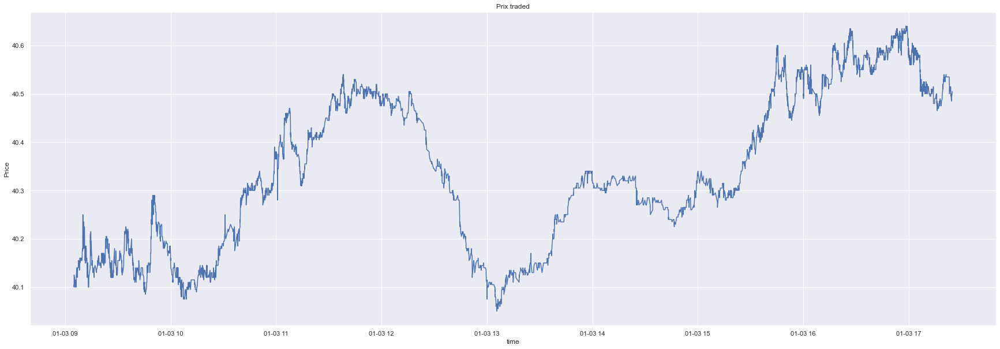

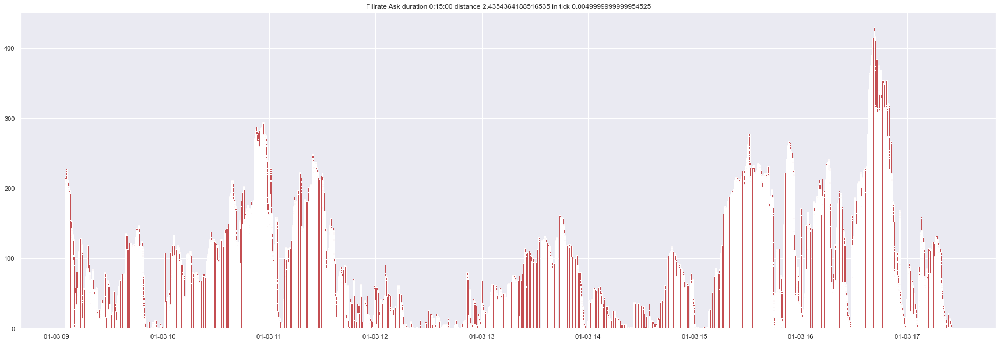

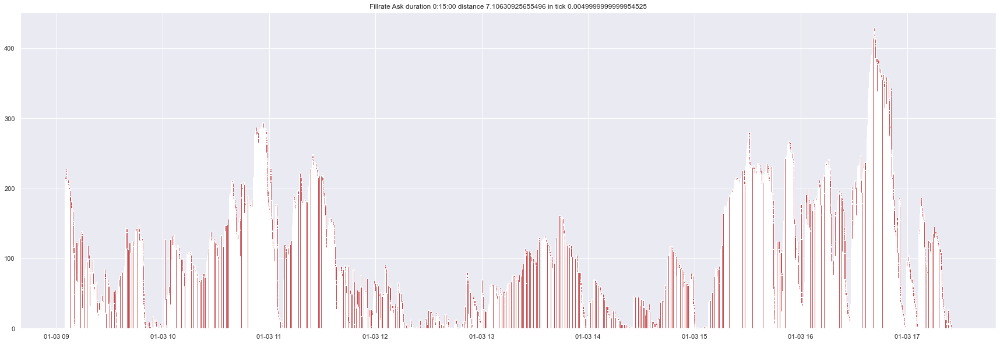

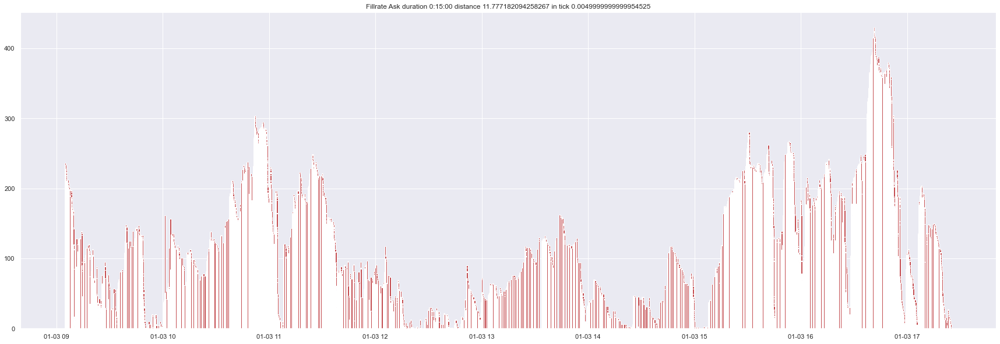

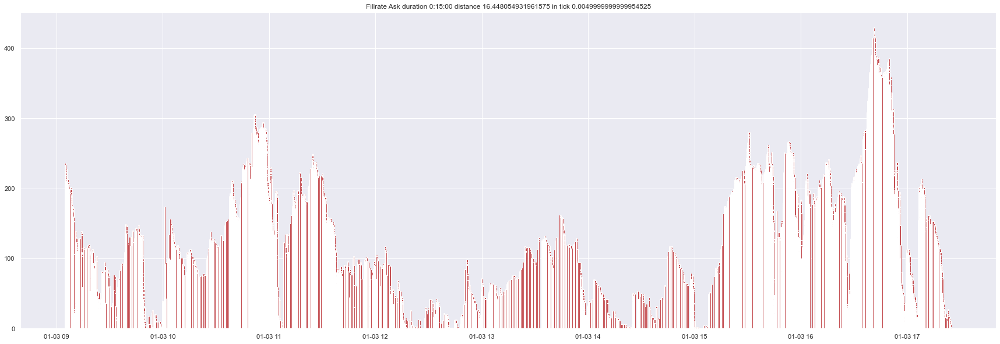

---- Duration 0:01:00


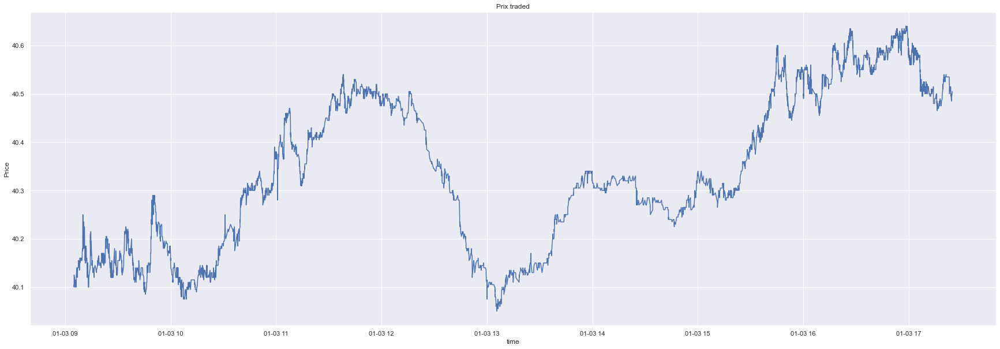

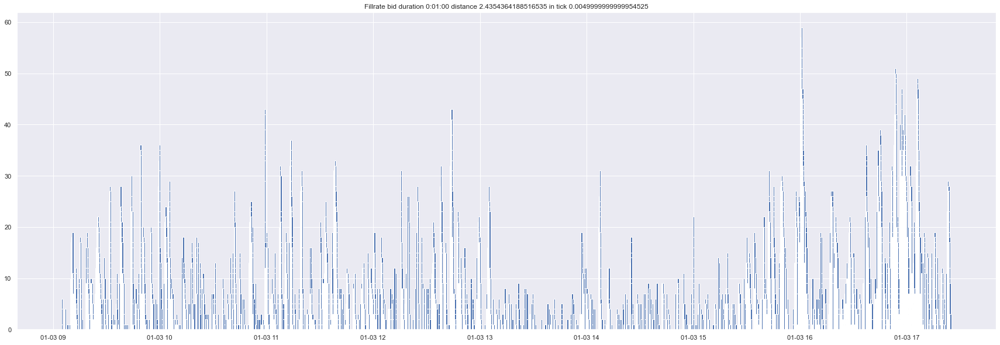

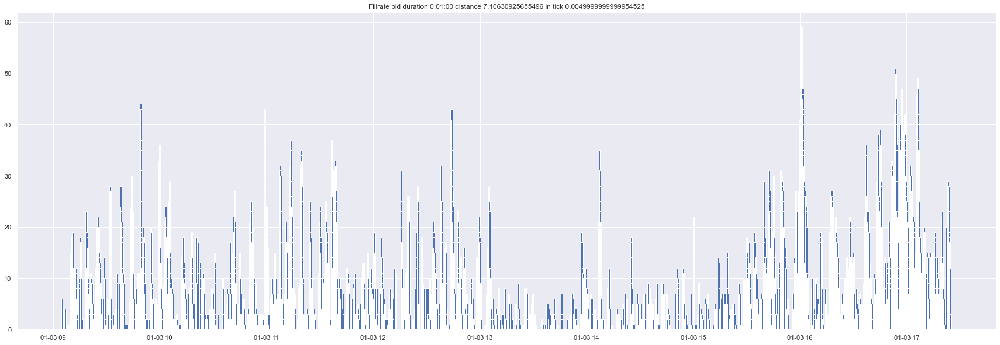

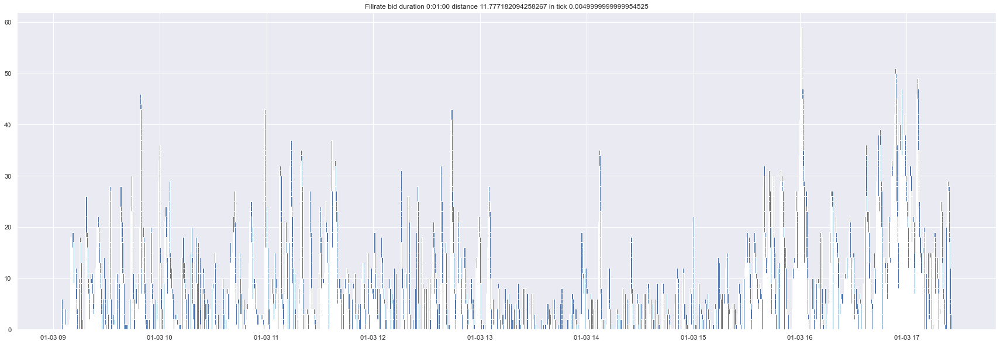

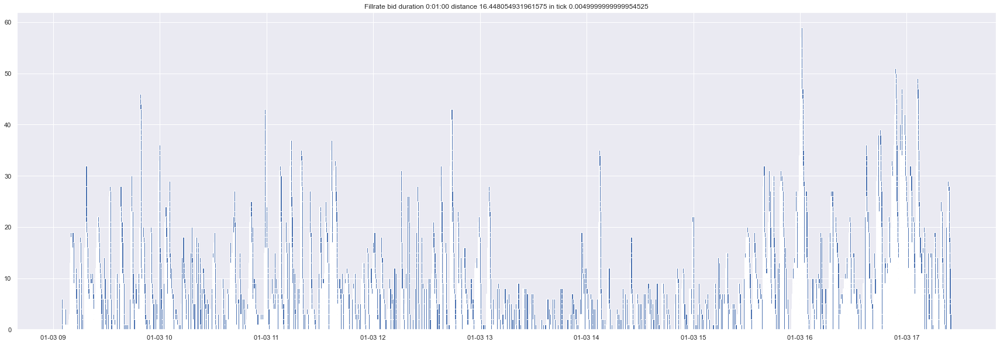

---- Duration 0:05:00


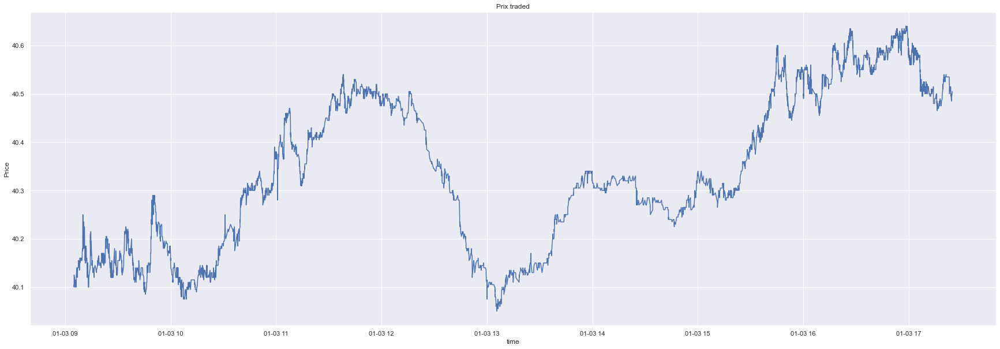

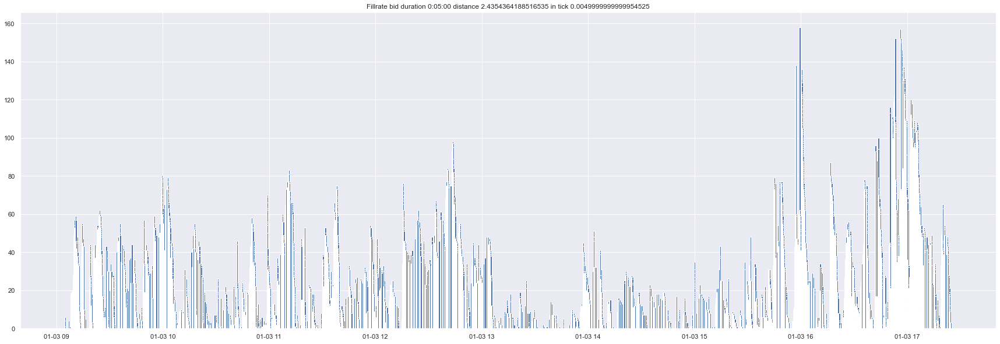

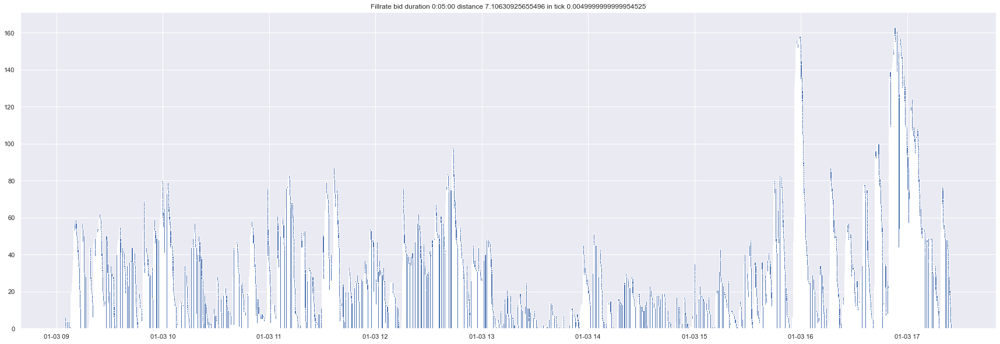

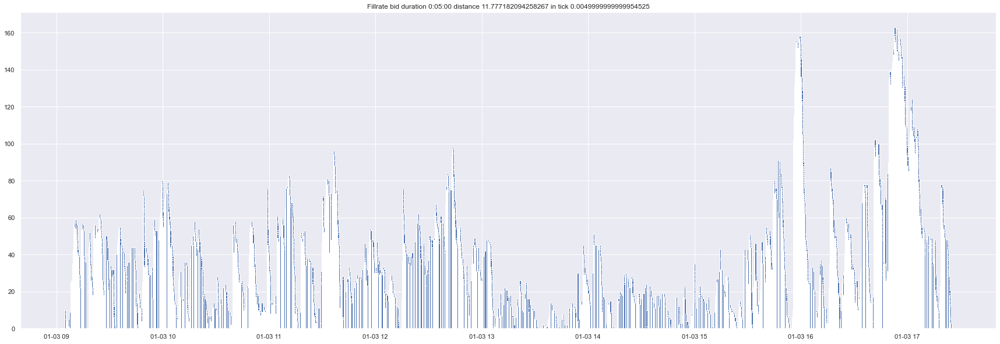

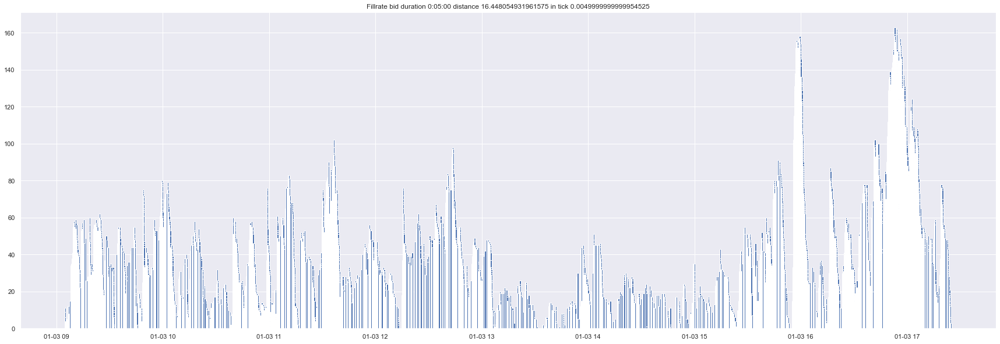

---- Duration 0:10:00


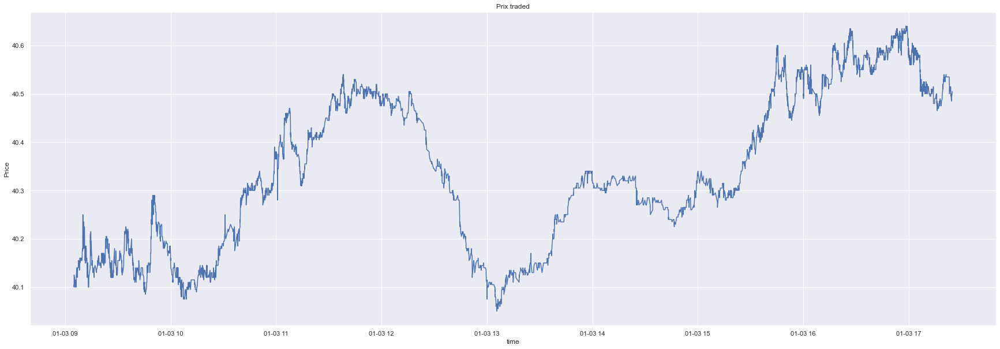

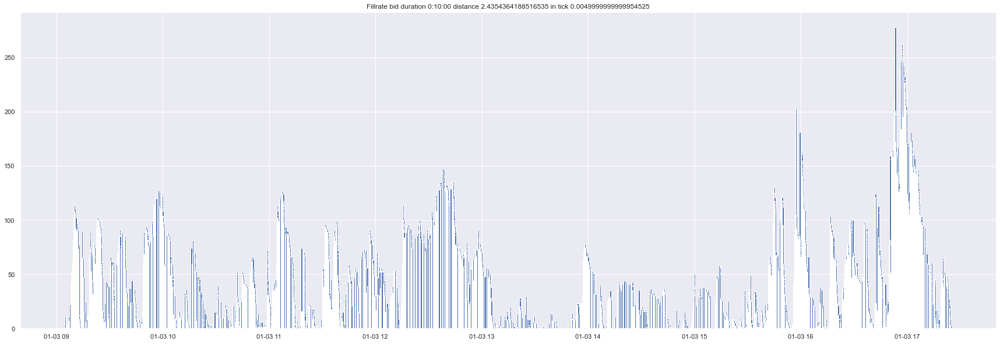

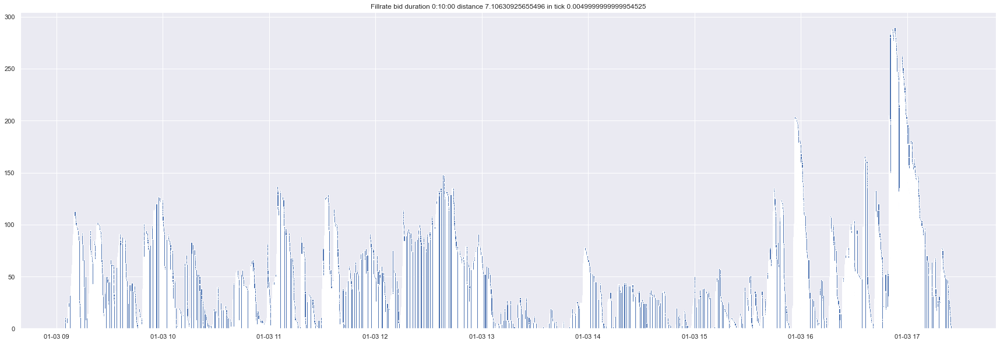

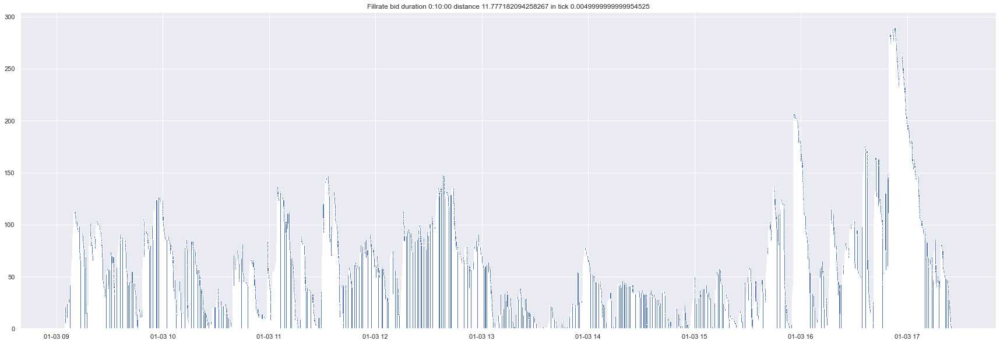

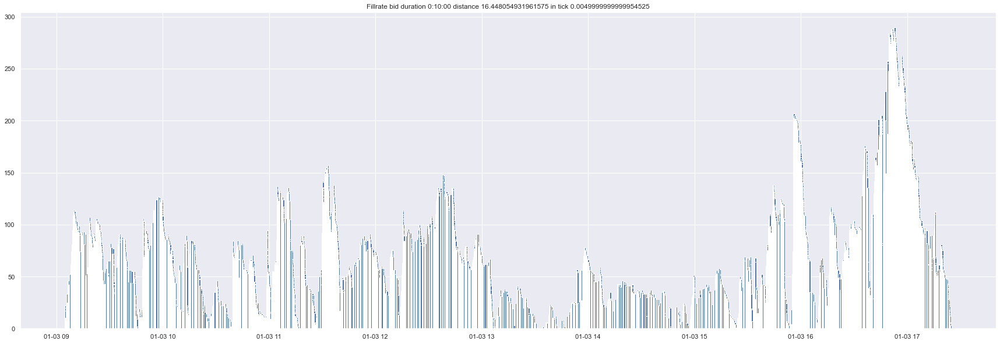

---- Duration 0:15:00


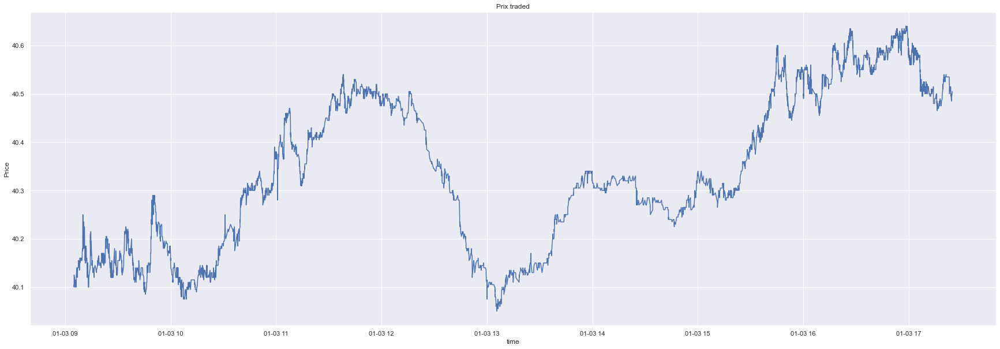

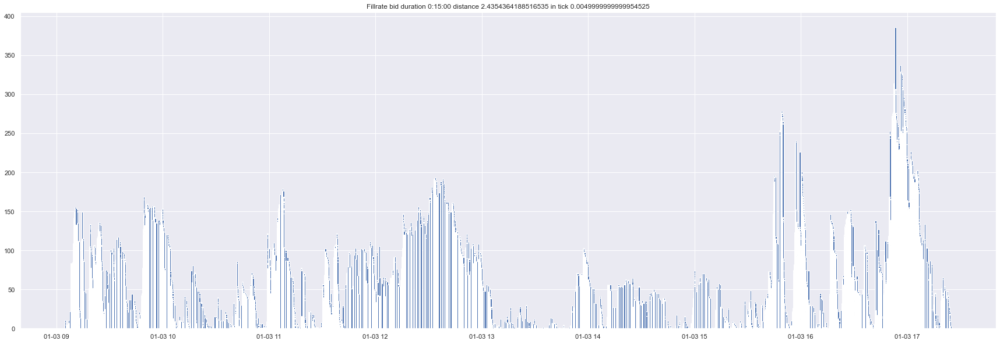

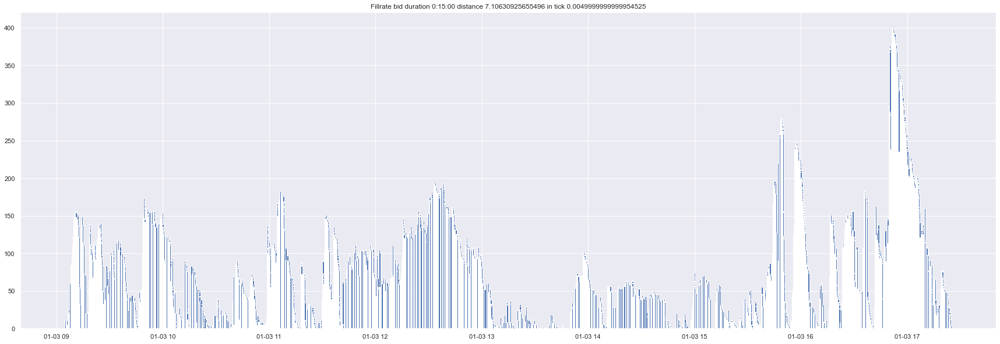

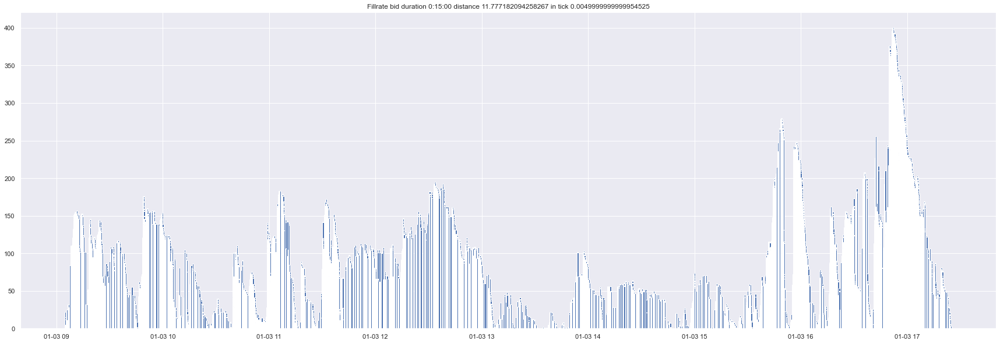

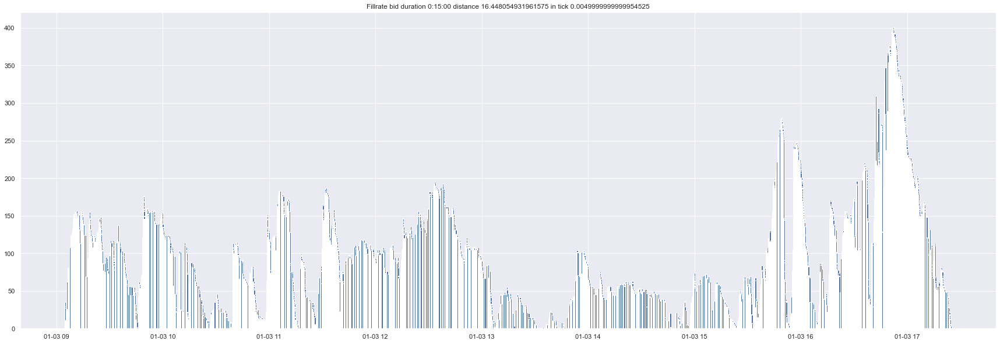

In [827]:
plot_fillrates(values_fillrate['TOTAL'], all_fillrates_nonconstant, combi_to_plot, tick) 

La visualisation des fillrates semble montrer plus de fillrates au début et en fin de journée par rapport au cas statique (à l'oeil plus de traits) peut-être dû à la forme de la volatilité en U.

## Tests de stationarité et optimalité des constantes $c_a$ et $c_b$

In [575]:
results_dynamique = compute_kpss(inventories_nonconstant)

/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up ta

/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/Users/zohra/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up ta

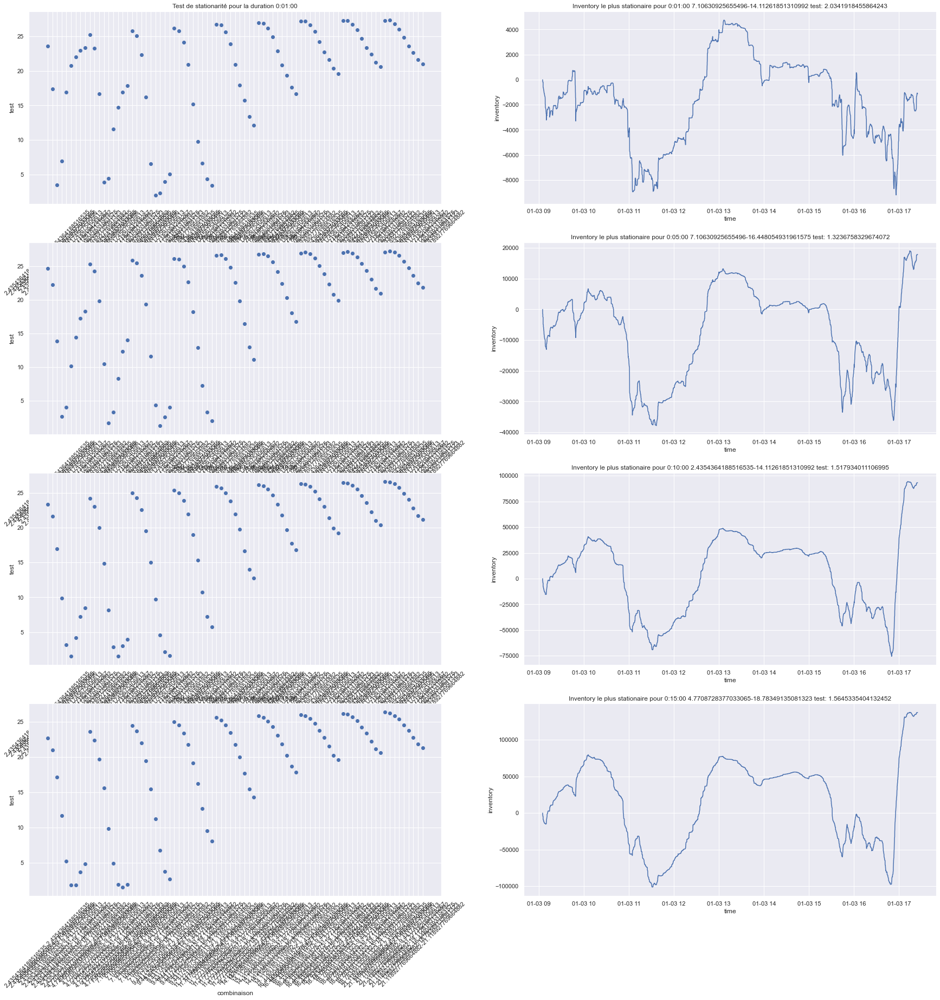

,duration,da-db,test
0,0 days 00:01:00,7.10630925655496-14.11261851310992,2.034192
1,0 days 00:05:00,7.10630925655496-16.448054931961575,1.323676
2,0 days 00:10:00,2.4354364188516535-14.11261851310992,1.517934
3,0 days 00:15:00,4.7708728377033065-18.78349135081323,1.564534


In [577]:
optimal_dynamique = plot_stati(results_dynamique, inventories_nonconstant) 
optimal_dynamique

Les résultats de test de stationarité montrent des valeurs encore plus fortes que pour le cas statique indiquant qu'il aurait peut-être fallu tester plus de distances. 

## Visualisation des prix, volatilité et inventory pour des distances 'optimales'

In [793]:
combi_to_plot = {optimal_dynamique['duration'][i] : [optimal_dynamique['da-db'].to_numpy()[i]]
                 for i in range(len(optimal_dynamique))}
combi_to_plot

{Timedelta('0 days 00:01:00'): ['7.10630925655496-14.11261851310992'],
 Timedelta('0 days 00:05:00'): ['7.10630925655496-16.448054931961575'],
 Timedelta('0 days 00:10:00'): ['2.4354364188516535-14.11261851310992'],
 Timedelta('0 days 00:15:00'): ['4.7708728377033065-18.78349135081323']}

---- Duration 0 days 00:01:00


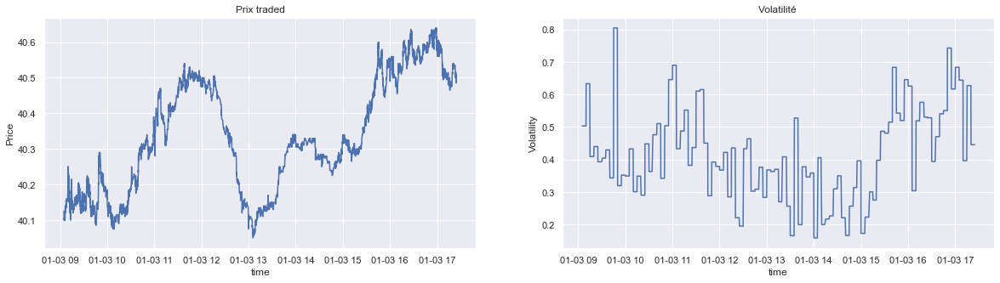

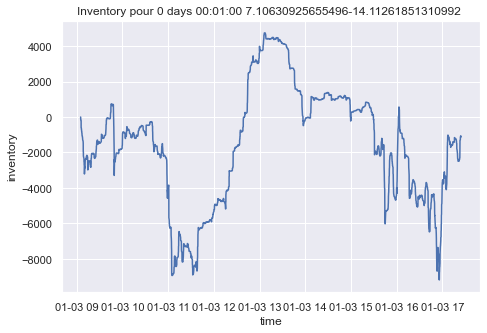

---- Duration 0 days 00:05:00


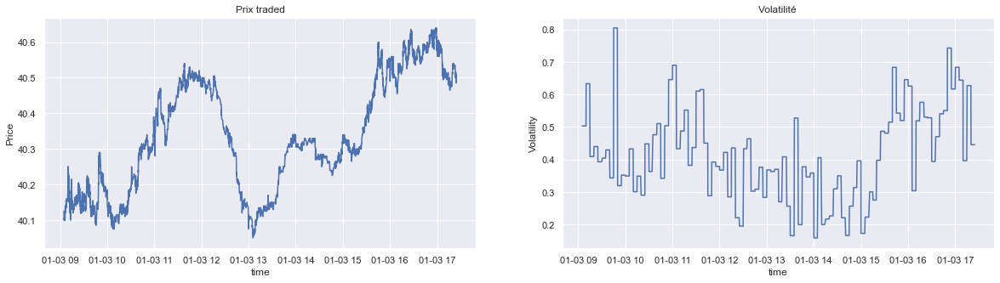

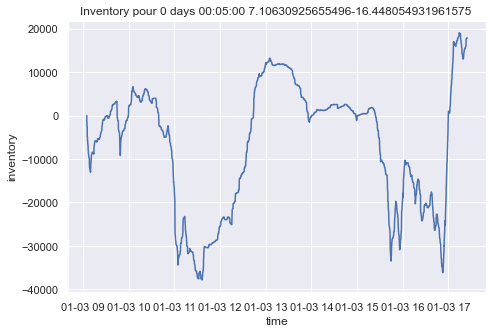

---- Duration 0 days 00:10:00


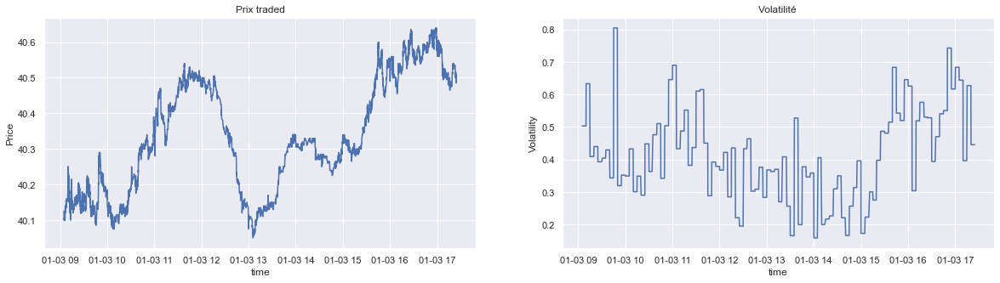

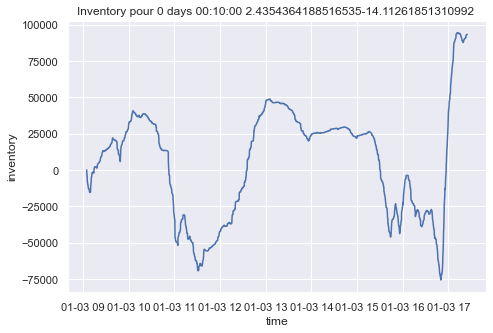

---- Duration 0 days 00:15:00


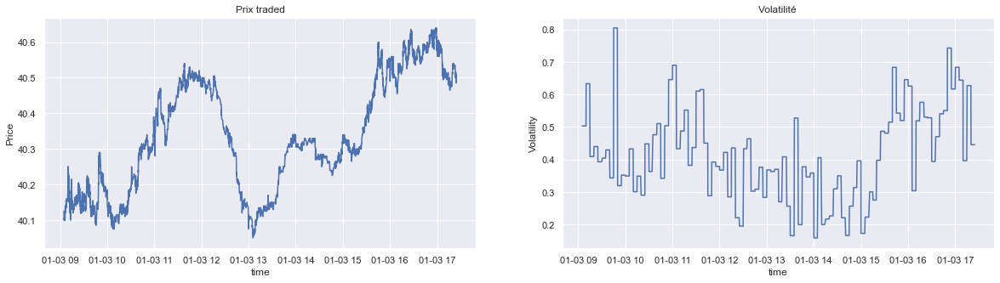

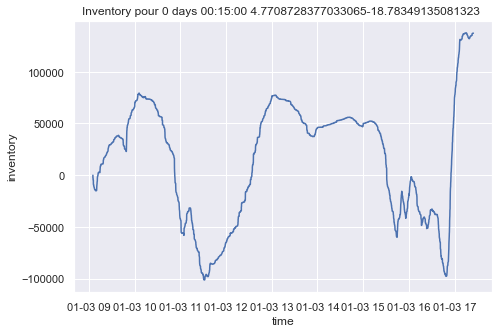

In [794]:
plot_inventory(values_fillrate['TOTAL'], courbes, inventories_nonconstant, combi_to_plot)

On retrouve des formes d'inventory assez similaires à celles trouvées dans le cas statique.

On remarque que l'évolution de l'inventory est bien corrélée au prix traded et à la volatilité au vu de la forme de la courbe. On n'a pas pu mettre les 3 graphes sur la même figure vu les différences d'échelle.

## Autres paramètres

D'autres paramètres intraday de trading pourraient être utilisés comme :

* le bid-ask spread : 
à cause de sa corrélation avec l'inventory

* l'imbalance :
On a vu en cours que l'imbalance est un bon 'trading signal' pour la prédiction des prix

* l'inventory passé :
On pourrait utiliser les valeurs de l'inventory juste avant un nouveau trading.

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;"> e - PnL </h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

In [750]:
def compute_PnL(values_fillrate_, all_fillrates, inventories) :
    PnL = {key: None for key in all_fillrates['AskPrice'].keys()}
    close = values_fillrate_['TradedPrice'].to_numpy()[-1]
    print(close)
    for key in PnL.keys() :
        distances_da = [c for c in all_fillrates['AskPrice'][key].columns 
                       if (c != 'time' and c!= 'AskPrice')]
        distances_db = [c for c in all_fillrates['BidPrice'][key].columns 
                       if (c != 'time' and c!= 'BidPrice')]
        times = all_fillrates['AskPrice'][key]['time']
        indices_ask = all_fillrates['AskPrice'][key].index
        indices_bid = all_fillrates['BidPrice'][key].index
        price_ask = all_fillrates['AskPrice'][key]['AskPrice']
        price_bid = all_fillrates['BidPrice'][key]['BidPrice']
        for da in distances_da :
            for db in distances_db :
                combi = str(da)+'-'+str(db)
                print(f'---- {key} do {combi}')
                diff_ask, diff_bid = [], []
                V_ = None
                for i, t in enumerate(times) :
                    # fillrate
                    quantite_ask = all_fillrates['AskPrice'][key].loc[indices_ask[:i+1]][da].to_numpy()
                    quantite_bid = all_fillrates['BidPrice'][key].loc[indices_bid[:i+1]][db].to_numpy()
                    
                    # difference des prix
                    if i ==  len(times) - 1:
                        diff_ask.append(close - price_ask[i])
                        diff_bid.append(close - price_bid[i])
                    else :
                        diff_ask.append(price_ask[i+1] - price_ask[i])
                        diff_bid.append(price_bid[i+1] - price_bid[i])
                        
                    scalar_product_ask = np.array(diff_ask)@quantite_ask
                    scalar_product_bid = np.array(diff_bid)@quantite_bid
                    # on a mis l'inventory à 0    
                    if i == 0 :
                        scalar_product_ask_0 = scalar_product_ask
                        scalar_product_bid_0 = scalar_product_bid
                    scalar_product_ask -= scalar_product_ask_0 
                    scalar_product_bid -= scalar_product_bid_0 
                    values = pd.DataFrame([[t, scalar_product_ask, scalar_product_bid, 
                                          scalar_product_ask-scalar_product_bid]], 
                                          columns = ['time', combi+'-PnL_ask', combi+'-PnL_bid', combi+'-PnL'],
                                          index = [i])
                    if V_ is None :
                        V_ = values
                    else :
                        V_ = pd.concat([V_, values], axis=0)
            
                # last value : on vend le reste au traded price
                V_.loc[i, combi+'-PnL'] =  V_.loc[i, combi+'-PnL'] - quantite_ask[i]*(close- price_ask[i]) + quantite_bid[i]*(close- price_bid[i])
                if PnL[key] is None :
                    PnL[key] = V_
                else :
                    V_ = V_.drop(['time'], axis=1)
                    PnL[key] = pd.concat([PnL[key], V_], axis=1)
    return PnL
                
    
def plot_PnL(PnL_, values_fillrate_, courbes, inventory, combi_to_plot) :
    for key, combi in combi_to_plot.items() :
        print(f'---- Duration {key}')
        fig, ax = plt.subplots(1,2, figsize=(20, 5))
        # prix
        ax[0].plot(values_fillrate_.index, values_fillrate_['TradedPrice'])
        ax[0].set_xlabel('time')
        ax[0].set_ylabel('Price')
        ax[0].set_title(f'Prix traded')
        # vol
        ax[1].plot(courbes.index, courbes['vol'])
        ax[1].set_xlabel('time')
        ax[1].set_ylabel('Volatility')
        ax[1].set_title(f'Volatilité ')
        plt.show()
        
        fig, ax = plt.subplots(len(combi),2, figsize=(30, 5))
        if len(combi) == 1 :
            ax[0].plot(PnL_[key]['time'].to_numpy(), PnL_[key][combi[0]+'-PnL'].to_numpy())
            ax[0].set_xlabel('time')
            ax[0].set_ylabel('PnL')
            ax[0].set_title(f'PnL pour {key} {combi[0]} ')
            
            ax[1].plot(inventory[key].index, inventory[key][combi[0]].to_numpy())
            ax[1].set_xlabel('time')
            ax[1].set_ylabel('inventory')
            ax[1].set_title(f'Inventory pour {key} {combi[0]} ')
        else :
            for i, c in enumerate(combi) :
                ax[i,0].plot(PnL_[key]['time'].to_numpy(), PnL_[key][c+'-PnL'].to_numpy())
                ax[i,0].set_xlabel('time')
                ax[i,0].set_ylabel('PnL')
                ax[i,0].set_title(f'PnL pour {key} {c} ')
            
                ax[i,1].plot(inventory[key].index, inventory[key][c].to_numpy())
                ax[i,1].set_xlabel('time')
                ax[i,1].set_ylabel('inventory')
                ax[i,1].set_title(f'Inventory pour {key} {c} ')
        plt.show()
        
    
    

## PnL statique

In [658]:
PnL_static = compute_PnL(values_fillrate['TOTAL'], all_fillrates, inventories) 

40.505
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0

In [691]:
PnL_static[list(PnL_static.keys())[0]].head()

,time,0-0-PnL_ask,0-0-PnL_bid,0-0-PnL,0-1-PnL_ask,0-1-PnL_bid,0-1-PnL,0-2-PnL_ask,0-2-PnL_bid,0-2-PnL,...,9-6-PnL,9-7-PnL_ask,9-7-PnL_bid,9-7-PnL,9-8-PnL_ask,9-8-PnL_bid,9-8-PnL,9-9-PnL_ask,9-9-PnL_bid,9-9-PnL
0,2011-01-03 09:05:04.594,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00
1,2011-01-03 09:05:04.594,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00
2,2011-01-03 09:05:04.594,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,...,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03
3,2011-01-03 09:05:05.005,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,...,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03
4,2011-01-03 09:05:05.005,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,...,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03


In [692]:
combi_to_plot = {optimal_stati['duration'][i] : [optimal_stati['da-db'].to_numpy()[i]]
                 for i in range(len(optimal_stati))}
combi_to_plot

{Timedelta('0 days 00:01:00'): ['3-7'],
 Timedelta('0 days 00:05:00'): ['1-5'],
 Timedelta('0 days 00:10:00'): ['0-6'],
 Timedelta('0 days 00:15:00'): ['1-7']}

---- Duration 0 days 00:01:00


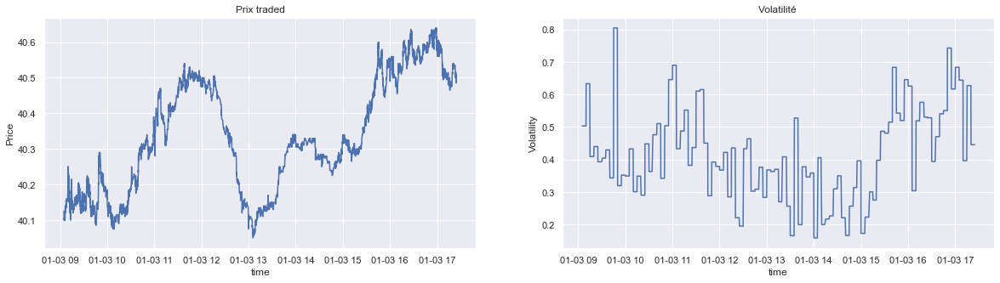

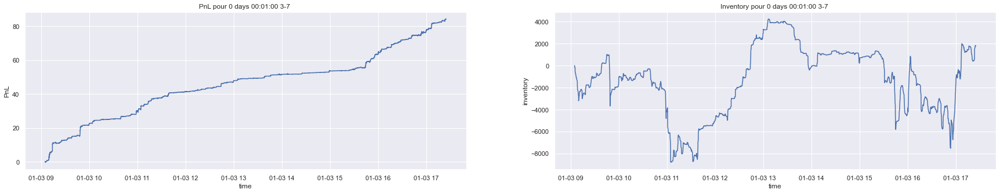

---- Duration 0 days 00:05:00


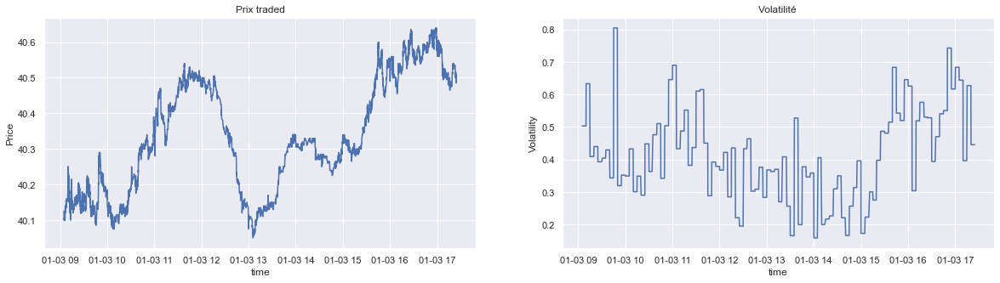

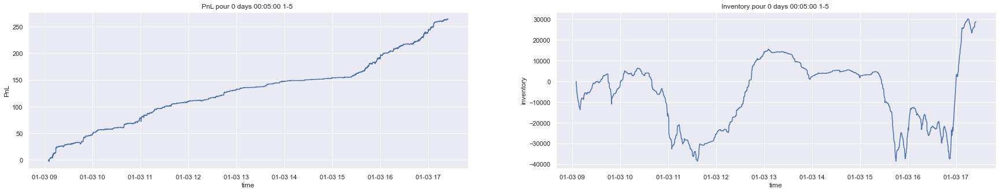

---- Duration 0 days 00:10:00


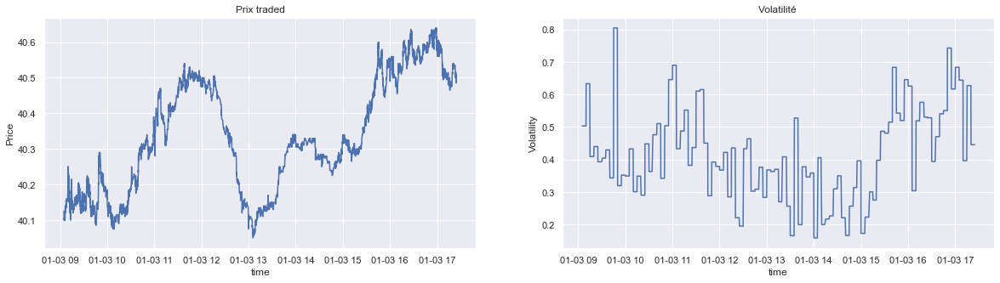

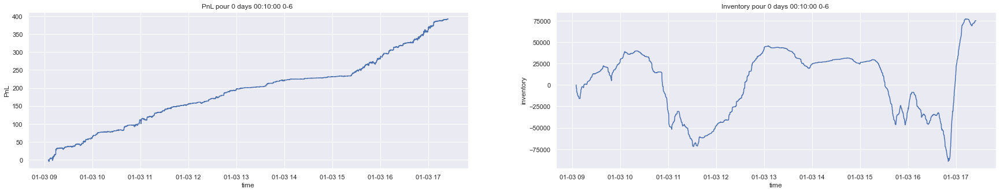

---- Duration 0 days 00:15:00


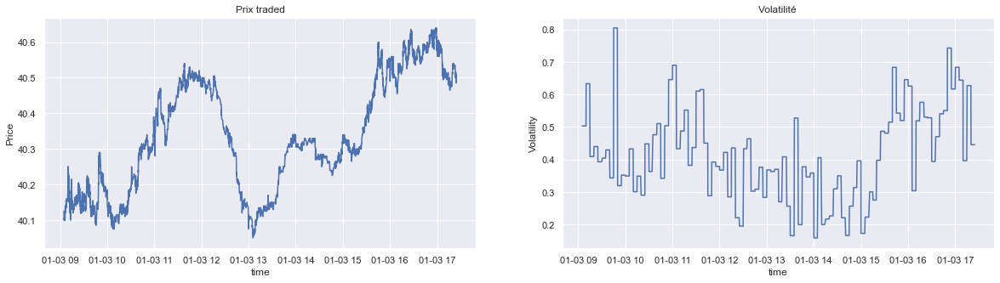

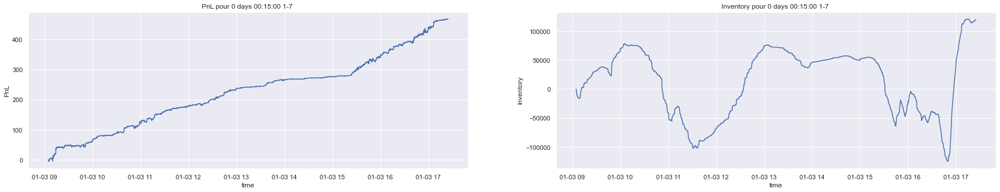

In [696]:
plot_PnL(PnL_static, values_fillrate['TOTAL'], courbes, inventories, combi_to_plot)

On obtient des PnL croissants, positifs et d'autant plus élevés pour de grandes durations. On peut voir à l'oeil que le PnL croît d'autant plus que le prix augmente et reste quasi constant lorsqu'il diminue. 

Pour le calcul du PnL, on a enlevé la dernière valeur de l'inventory en le prenant au prix du close. Pour ce qui est de la différence des prix entre chaque temps, on utilise les prix à l'ask et au bid suivant qu'on évalue le PnL pour l'ask ou le bid. 

## PnL dynamique

In [751]:
PnL_dynamic = compute_PnL(values_fillrate['TOTAL'], all_fillrates_nonconstant, inventories_nonconstant) 

40.505
---- 0:01:00 do 2.4354364188516535-2.4354364188516535
---- 0:01:00 do 2.4354364188516535-4.7708728377033065
---- 0:01:00 do 2.4354364188516535-7.10630925655496
---- 0:01:00 do 2.4354364188516535-9.441745675406613
---- 0:01:00 do 2.4354364188516535-11.777182094258267
---- 0:01:00 do 2.4354364188516535-14.11261851310992
---- 0:01:00 do 2.4354364188516535-16.448054931961575
---- 0:01:00 do 2.4354364188516535-18.78349135081323
---- 0:01:00 do 2.4354364188516535-21.118927769664882
---- 0:01:00 do 4.7708728377033065-2.4354364188516535
---- 0:01:00 do 4.7708728377033065-4.7708728377033065
---- 0:01:00 do 4.7708728377033065-7.10630925655496
---- 0:01:00 do 4.7708728377033065-9.441745675406613
---- 0:01:00 do 4.7708728377033065-11.777182094258267
---- 0:01:00 do 4.7708728377033065-14.11261851310992
---- 0:01:00 do 4.7708728377033065-16.448054931961575
---- 0:01:00 do 4.7708728377033065-18.78349135081323
---- 0:01:00 do 4.7708728377033065-21.118927769664882
---- 0:01:00 do 7.1063092565549

---- 0:05:00 do 21.118927769664882-7.10630925655496
---- 0:05:00 do 21.118927769664882-9.441745675406613
---- 0:05:00 do 21.118927769664882-11.777182094258267
---- 0:05:00 do 21.118927769664882-14.11261851310992
---- 0:05:00 do 21.118927769664882-16.448054931961575
---- 0:05:00 do 21.118927769664882-18.78349135081323
---- 0:05:00 do 21.118927769664882-21.118927769664882
---- 0:10:00 do 2.4354364188516535-2.4354364188516535
---- 0:10:00 do 2.4354364188516535-4.7708728377033065
---- 0:10:00 do 2.4354364188516535-7.10630925655496
---- 0:10:00 do 2.4354364188516535-9.441745675406613
---- 0:10:00 do 2.4354364188516535-11.777182094258267
---- 0:10:00 do 2.4354364188516535-14.11261851310992
---- 0:10:00 do 2.4354364188516535-16.448054931961575
---- 0:10:00 do 2.4354364188516535-18.78349135081323
---- 0:10:00 do 2.4354364188516535-21.118927769664882
---- 0:10:00 do 4.7708728377033065-2.4354364188516535
---- 0:10:00 do 4.7708728377033065-4.7708728377033065
---- 0:10:00 do 4.7708728377033065-7.1

---- 0:15:00 do 18.78349135081323-11.777182094258267
---- 0:15:00 do 18.78349135081323-14.11261851310992
---- 0:15:00 do 18.78349135081323-16.448054931961575
---- 0:15:00 do 18.78349135081323-18.78349135081323
---- 0:15:00 do 18.78349135081323-21.118927769664882
---- 0:15:00 do 21.118927769664882-2.4354364188516535
---- 0:15:00 do 21.118927769664882-4.7708728377033065
---- 0:15:00 do 21.118927769664882-7.10630925655496
---- 0:15:00 do 21.118927769664882-9.441745675406613
---- 0:15:00 do 21.118927769664882-11.777182094258267
---- 0:15:00 do 21.118927769664882-14.11261851310992
---- 0:15:00 do 21.118927769664882-16.448054931961575
---- 0:15:00 do 21.118927769664882-18.78349135081323
---- 0:15:00 do 21.118927769664882-21.118927769664882


In [752]:
PnL_dynamic[list(PnL_dynamic.keys())[0]].head()

,time,2.4354364188516535-2.4354364188516535-PnL_ask,2.4354364188516535-2.4354364188516535-PnL_bid,2.4354364188516535-2.4354364188516535-PnL,2.4354364188516535-4.7708728377033065-PnL_ask,2.4354364188516535-4.7708728377033065-PnL_bid,2.4354364188516535-4.7708728377033065-PnL,2.4354364188516535-7.10630925655496-PnL_ask,2.4354364188516535-7.10630925655496-PnL_bid,2.4354364188516535-7.10630925655496-PnL,...,21.118927769664882-14.11261851310992-PnL,21.118927769664882-16.448054931961575-PnL_ask,21.118927769664882-16.448054931961575-PnL_bid,21.118927769664882-16.448054931961575-PnL,21.118927769664882-18.78349135081323-PnL_ask,21.118927769664882-18.78349135081323-PnL_bid,21.118927769664882-18.78349135081323-PnL,21.118927769664882-21.118927769664882-PnL_ask,21.118927769664882-21.118927769664882-PnL_bid,21.118927769664882-21.118927769664882-PnL
0,2011-01-03 09:05:04.594,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00
1,2011-01-03 09:05:04.594,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,...,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00
2,2011-01-03 09:05:04.594,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,...,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03
3,2011-01-03 09:05:05.005,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,...,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03
4,2011-01-03 09:05:05.005,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,...,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03,0.0,-0.03,0.03


In [754]:
combi_to_plot = {optimal_dynamique['duration'][i] : [optimal_dynamique['da-db'].to_numpy()[i]]
                 for i in range(len(optimal_dynamique))}
combi_to_plot

{Timedelta('0 days 00:01:00'): ['7.10630925655496-14.11261851310992'],
 Timedelta('0 days 00:05:00'): ['7.10630925655496-16.448054931961575'],
 Timedelta('0 days 00:10:00'): ['2.4354364188516535-14.11261851310992'],
 Timedelta('0 days 00:15:00'): ['4.7708728377033065-18.78349135081323']}

---- Duration 0 days 00:01:00


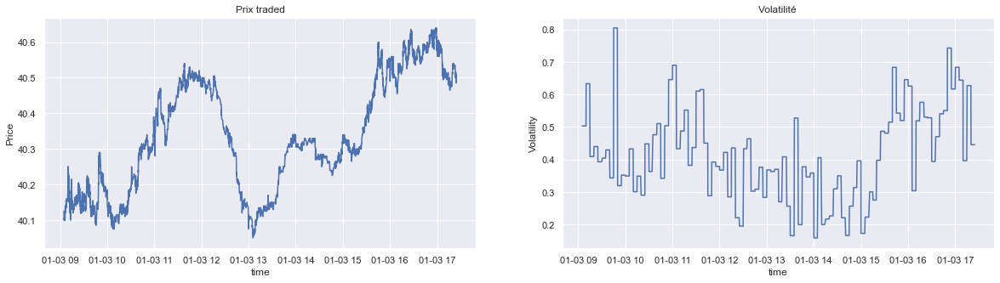

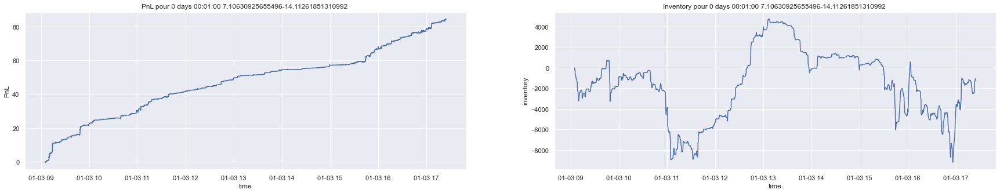

---- Duration 0 days 00:05:00


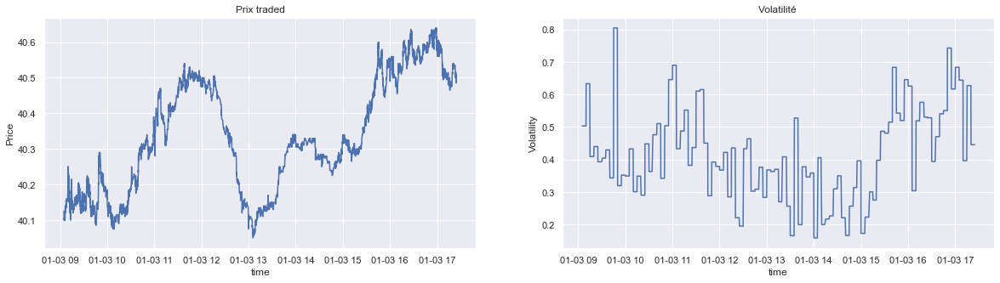

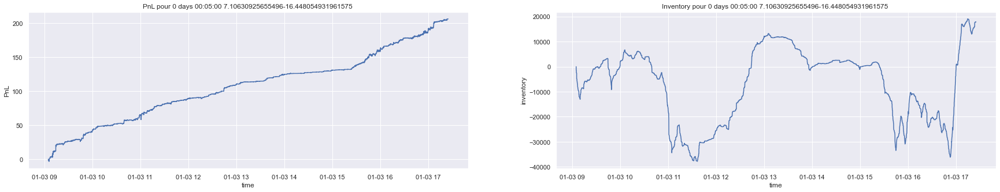

---- Duration 0 days 00:10:00


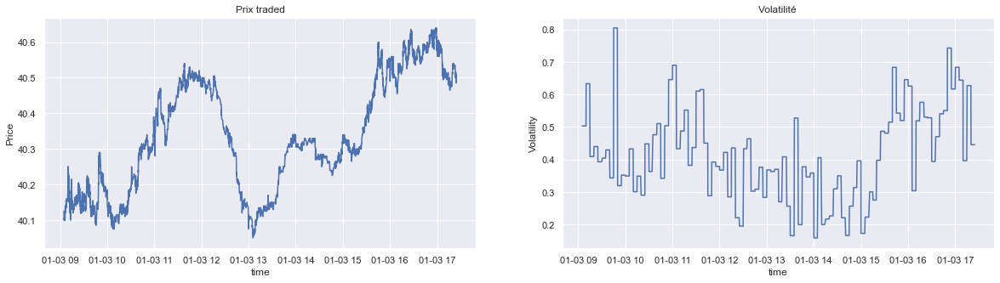

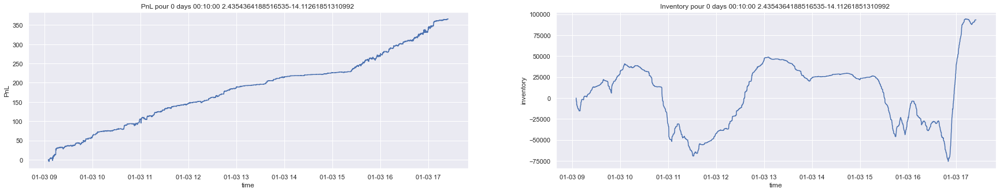

---- Duration 0 days 00:15:00


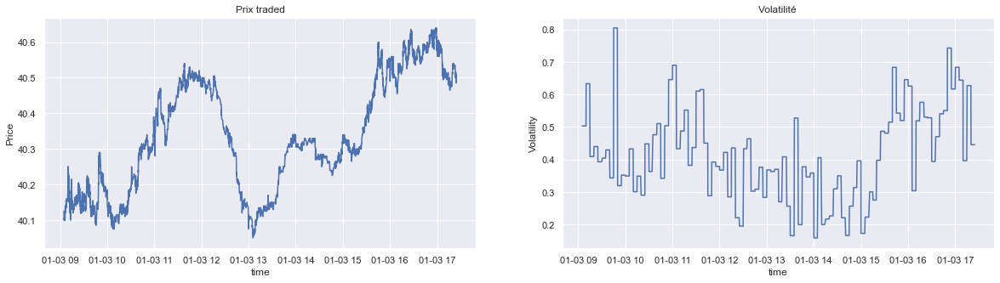

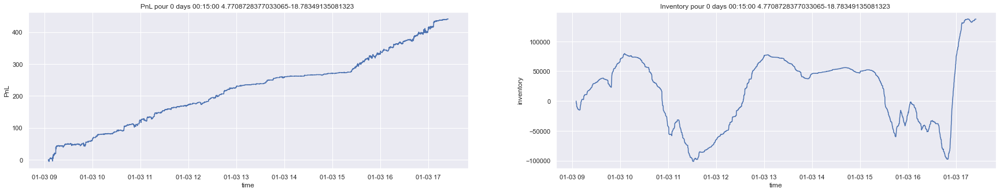

In [755]:
plot_PnL(PnL_dynamic, values_fillrate['TOTAL'], courbes, inventories_nonconstant, combi_to_plot)

On obtient des PnLs à la forme similaire à celle du cadre statique mais les valeurs finales obtenues sont légèrement plus faibles. 

## Possibilité des liquidations au close

Il ne me semble pas toujours possible de liquider l'inventory restant au closing price car si on suppose que tous les market makers font la même chose (liquident leur stock au closing price), il faudrait qu'il y ait assez de liquidité pour qu'ils puissent tous avoir dans le marché le stock opposé donc il faudrait que le marché soit toujours à l'équilibre ce qui ne semble pas toujours vérifié (si ils veulent tous vendre par exemple).

## Corrélation entre le PnL et l'inventory

In [764]:
def compute_all_correlation_pll_inventory(PnL_, inventories_) :
    correlation = {key : None for key in inventories_.keys()}
    for key, inventory in inventories_.items() :
        for combi in inventory.columns :
            Pnl_val = PnL_[key][combi+'-PnL']
            name = 'pnl'
            if correlation[key] is None :
                correlation[key] = compute_correlation(Pnl_val, inventory[combi], name, combi)
            else :
                value = pd.concat([compute_correlation(Pnl_val, inventory[combi], name, combi)], axis= 1)
                correlation[key] = pd.concat([correlation[key], 
                                              value], axis= 0)
                
    return correlation

def plot_correlation_pnl(correlation) :
    fig, ax = plt.subplots(2,2, figsize=(30, 15))
    for i, key in enumerate(correlation) :
        ax[i//2,i%2].plot(correlation[key].index, correlation[key]['pnl-Pearson_coeff'], 'o', label='Pearson')
        ax[i//2,i%2].plot(correlation[key].index, correlation[key]['pnl-spearman_coeff'], 'o', label='spearman')
        ax[i//2,i%2].set_xlabel('combinaison')
        ax[i//2,i%2].set_ylabel('test')
        ax[i//2,i%2].set_title(f'Test de corrélation Pearson/Spearman inventory/PnL pour la duration {key}')
        ax[i//2,i%2].set_xticklabels(correlation[key].index, rotation=45)
        ax[i//2,i%2].legend()
    plt.show()

### Corrélation cas statique

In [758]:
correlation_Pnl_invento_stati = compute_all_correlation_pll_inventory(PnL_static, inventories)

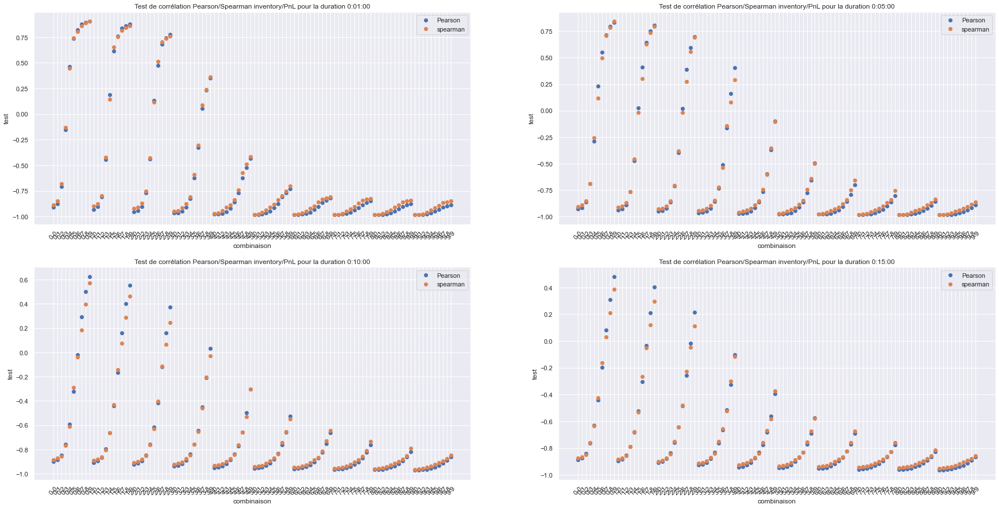

In [765]:
plot_correlation_pnl(correlation_Pnl_invento_stati)

### Corrélation cas dynamique

In [766]:
correlation_Pnl_invento_dyna = compute_all_correlation_pll_inventory(PnL_dynamic, inventories_nonconstant)

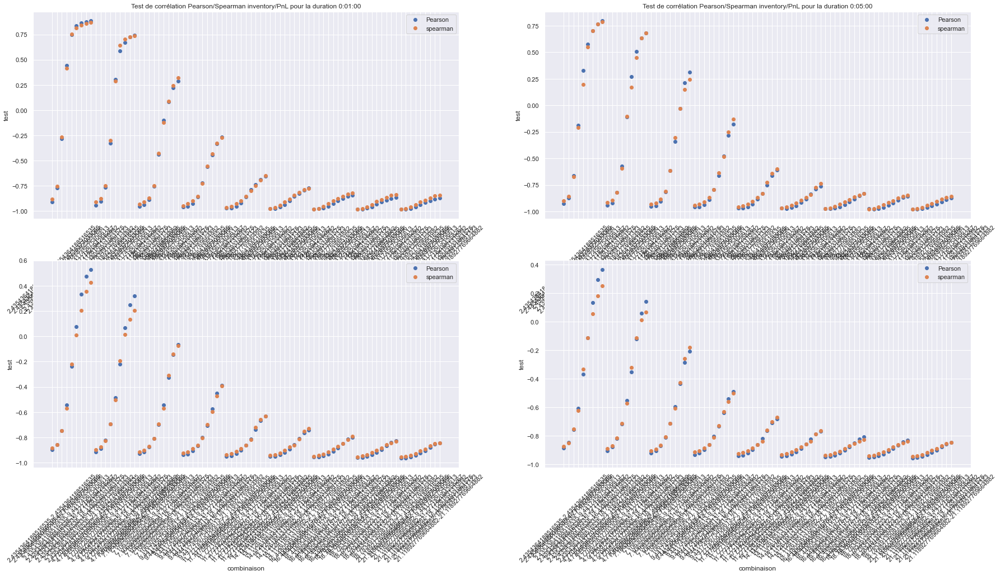

In [767]:
plot_correlation_pnl(correlation_Pnl_invento_dyna)

Les corrélations des cas statitique et dynamique du PnL et de l'inventory sont quasiment similaires. On peut voir que changer les combinaisons de distances influe surtout sur le signe de la corrélation lorsque $d_a$ est faible et $d_b$ augmente (d'où les fortes variations au début des graphes de corrélations). Lorsque $d_a$ augmente, l'effet de $d_b$ est plus négligeable et le PnL croît d'autant plus que l'inventory est négatif (corrélation proche de -1).

* Forme du PnL

On suppose que la distance dépend à la fois de la volatilité et de l'inventory. 

On pourrait d'abord tester $f$ sous forme linéaire en $V_t$. Même si $V_t$ dépend déjà linéairement en la volatilité et $f$ dépend linéairement de la volatilité, cela pourrait inclure l'effet de la constante $c_a$ et $c_b$ qui sont supposées différentes. Si il s'avère que ça ne pénalise pas autant les inventories les plus élevés (en norme) pour réduire le PnL, on pourrait aussi tester $f$ sous une forme exponentielle en $V_t$ (but pénaliser d'autant plus les fortes valeurs en norme de $V_t$) et choisir le signe de la constante devant suivant si on poste au bid ou à l'ask pour contrôler la probabilité d'exécution tout en restant positif pour que ce soit bien une distance (vu que l'on a aussi la dépendance en $\sigma$).